In [6]:
# conda activate layoutlm


CommandNotFoundError: Your shell has not been properly configured to use 'conda activate'.
To initialize your shell, run

    $ conda init <SHELL_NAME>

Currently supported shells are:
  - bash
  - fish
  - tcsh
  - xonsh
  - zsh
  - powershell

See 'conda init --help' for more information and options.

IMPORTANT: You may need to close and restart your shell after running 'conda init'.



Note: you may need to restart the kernel to use updated packages.


In [1]:
# pip list

Package                 Version
----------------------- ------------------
absl-py                 0.14.1
analytics-python        1.4.0
antlr4-python3-runtime  4.8
appdirs                 1.4.4
appnope                 0.1.2
argcomplete             1.12.3
argon2-cffi             21.1.0
attrs                   21.2.0
backcall                0.2.0
backoff                 1.10.0
bcrypt                  3.2.0
black                   21.4b2
bleach                  4.1.0
cachetools              4.2.4
certifi                 2021.5.30
cffi                    1.15.0
charset-normalizer      2.0.6
click                   8.0.1
cloudpickle             2.0.0
cryptography            35.0.0
cycler                  0.10.0
Cython                  0.29.24
datasets                1.6.2
debugpy                 1.5.1
decorator               5.1.0
defusedxml              0.7.1
detectron2              0.5
dill                    0.3.4
entrypoints             0.3
ffmpy                   0.3.0
filelock        

In [6]:
from datasets import load_dataset

In [7]:
# pip install git+https://github.com/huggingface/transformers.git

In [8]:
# conda install sentencepiece

In [9]:
from PIL import Image
from transformers import LayoutLMv2Processor, LayoutXLMProcessor
from datasets import Features, Sequence, ClassLabel, Value, Array2D, Array3D
from transformers import AutoTokenizer
# tokenizer = AutoTokenizer.from_pretrained("microsoft/layoutxlm-base")

In [96]:
import os
import layoutlmft.data.datasets.xfun
dataset = load_dataset(os.path.abspath(layoutlmft.data.datasets.xfun.__file__), f"xfun.zh", split="validation")

Reusing dataset xfun (/Users/aile/.cache/huggingface/datasets/xfun/xfun.zh/0.0.0/8e03a76ec26031c39ffc485a02bf053a79a5a1b7ffbba133818803ee081b40d3)


In [11]:
dataset

Dataset({
    features: ['id', 'input_ids', 'bbox', 'labels', 'image', 'entities', 'relations'],
    num_rows: 65
})

In [12]:
labels = dataset.features['labels'].feature.names
dataset.features['entities'].feature['label'].names
# print(labels)

['HEADER', 'QUESTION', 'ANSWER']

In [14]:
dataset.features["input_ids"].feature

Value(dtype='int64', id=None)

In [15]:
dataset.features["id"]

Value(dtype='string', id=None)

In [13]:
example=dataset[0] # example是val中第一张图片
example.keys()
example['id'][:-2]
example['input_ids']

# len(example['entities']['label'])

[7798,
 58870,
 157,
 449,
 313,
 63823,
 9688,
 175560,
 16444,
 7798,
 58870,
 157,
 449,
 95411,
 6,
 247243,
 38711,
 20645,
 5873,
 6,
 31723,
 12040,
 159853,
 2122,
 6111,
 166186,
 6,
 13525,
 133144,
 114491,
 6,
 129428,
 12,
 6,
 40409,
 49519,
 12,
 6,
 225238,
 12,
 6,
 73521,
 9095,
 45671,
 12,
 6,
 210427,
 40146,
 1988,
 2128,
 2128,
 144341,
 3624,
 6,
 28413,
 12,
 6,
 1879,
 12,
 6,
 14754,
 12,
 78373,
 4633,
 200439,
 152261,
 6,
 20645,
 34134,
 43,
 166186,
 45671,
 6,
 46625,
 52039,
 155815,
 617,
 5730,
 14843,
 363,
 9788,
 2954,
 122367,
 6,
 95411,
 185814,
 84010,
 6,
 95411,
 52684,
 78267,
 206691,
 1198,
 1726,
 48412,
 95411,
 43,
 13046,
 16205,
 2672,
 10007,
 192460,
 30,
 134684,
 95411,
 4467,
 52741,
 9651,
 5207,
 14439,
 85567,
 5070,
 6,
 23060,
 4,
 7363,
 5412,
 85567,
 213,
 11372,
 97825,
 354,
 100485,
 4,
 89598,
 206691,
 12513,
 85567,
 4766,
 83636,
 30,
 3322,
 14072,
 8107,
 5412,
 4,
 9736,
 27644,
 11415,
 95411,
 43,
 52,
 18581

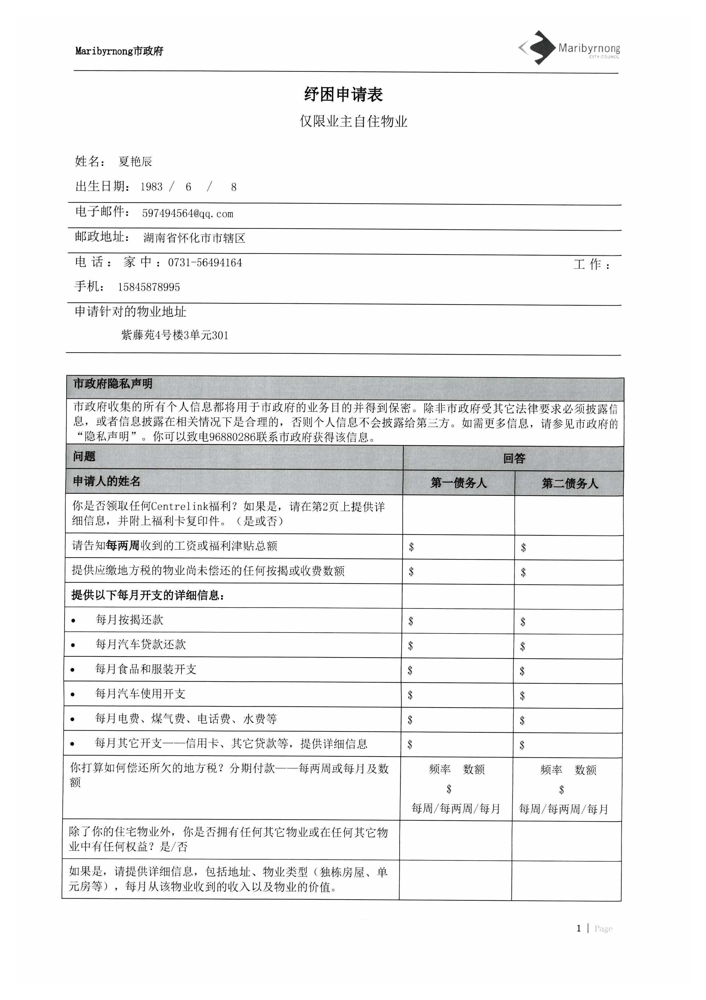

In [18]:
from PIL import Image, ImageDraw, ImageFont
image = Image.open("zh.val/"+ example['id'][:-2]+".jpg")
image = image.convert("RGB")
image
# example长啥样

In [165]:
from transformers import LayoutXLMProcessor, LayoutLMv2ForTokenClassification, LayoutXLMTokenizer, AutoTokenizer
processor = LayoutXLMProcessor.from_pretrained("./layoutxlm-base", revision="no_ocr")
tokenizer = AutoTokenizer.from_pretrained("./layoutxlm-base", revision="no_ocr")
model = LayoutLMv2ForTokenClassification.from_pretrained("./checkpoint-2500", revision="no_ocr")
print(tokenizer)
print(processor)

The tokenizer class you load from this checkpoint is not the same type as the class this function is called from. It may result in unexpected tokenization. 
The tokenizer class you load from this checkpoint is 'XLMRobertaTokenizer'. 
The class this function is called from is 'LayoutXLMTokenizerFast'.
Some weights of the model checkpoint at ./checkpoint-2500 were not used when initializing LayoutLMv2ForTokenClassification: ['extractor.rel_classifier.linear.bias', 'extractor.entity_emb.weight', 'extractor.rel_classifier.linear.weight', 'extractor.ffnn_tail.3.bias', 'extractor.ffnn_tail.3.weight', 'extractor.ffnn_head.0.bias', 'extractor.ffnn_head.0.weight', 'extractor.ffnn_head.3.weight', 'extractor.ffnn_tail.0.bias', 'extractor.ffnn_head.3.bias', 'extractor.ffnn_tail.0.weight', 'extractor.rel_classifier.bilinear.weight']
- This IS expected if you are initializing LayoutLMv2ForTokenClassification from the checkpoint of a model trained on another task or with another architecture (e.g. in

PreTrainedTokenizerFast(name_or_path='./layoutxlm-base', vocab_size=250002, model_max_len=1000000000000000019884624838656, is_fast=True, padding_side='right', special_tokens={'bos_token': '<s>', 'eos_token': '</s>', 'unk_token': '<unk>', 'sep_token': '</s>', 'pad_token': '<pad>', 'cls_token': '<s>', 'mask_token': AddedToken("<mask>", rstrip=False, lstrip=True, single_word=False, normalized=False)})


In [19]:
example.keys()

dict_keys(['bbox', 'entities', 'id', 'image', 'input_ids', 'labels', 'relations'])

In [20]:
len(example['input_ids']) #字的个数

459

In [231]:
ids_list=example['input_ids']#字的id
print(ids_list)

[7798, 58870, 157, 449, 313, 63823, 9688, 175560, 16444, 7798, 58870, 157, 449, 95411, 6, 247243, 38711, 20645, 5873, 6, 31723, 12040, 159853, 2122, 6111, 166186, 6, 13525, 133144, 114491, 6, 129428, 12, 6, 40409, 49519, 12, 6, 225238, 12, 6, 73521, 9095, 45671, 12, 6, 210427, 40146, 1988, 2128, 2128, 144341, 3624, 6, 28413, 12, 6, 1879, 12, 6, 14754, 12, 78373, 4633, 200439, 152261, 6, 20645, 34134, 43, 166186, 45671, 6, 46625, 52039, 155815, 617, 5730, 14843, 363, 9788, 2954, 122367, 6, 95411, 185814, 84010, 6, 95411, 52684, 78267, 206691, 1198, 1726, 48412, 95411, 43, 13046, 16205, 2672, 10007, 192460, 30, 134684, 95411, 4467, 52741, 9651, 5207, 14439, 85567, 5070, 6, 23060, 4, 7363, 5412, 85567, 213, 11372, 97825, 354, 100485, 4, 89598, 206691, 12513, 85567, 4766, 83636, 30, 3322, 14072, 8107, 5412, 4, 9736, 27644, 11415, 95411, 43, 52, 185814, 84010, 7534, 44815, 10497, 8312, 11648, 111056, 3882, 910, 21446, 95411, 13730, 4941, 5412, 30, 6, 4258, 6, 27739, 6, 152827, 43, 129428, 6

In [241]:
word_list=[] # 把所有字的id转换为字并存入word_list
for index in ids_list:
    word_list.append(tokenizer._convert_id_to_token(index))

In [151]:
len(example['entities']['label']) # 词的个数，也就是语义实体的个数

60

In [145]:
example['entities'].keys()

dict_keys(['end', 'label', 'start'])

In [203]:
words_num=len(example['entities']['end']) # 60个词words，459个字word
start_ind = example['entities']['start'][0]
end_ind = example['entities']['end'][0]
label_ind = example['entities']['label'][0]
entity_labels=dataset.features['entities'].feature['label'].names
print(entity_labels[label_ind])
print(start_ind)
print(label_ind)

HEADER
14
0


In [232]:
print(tokenizer._convert_id_to_token(52))

▁“


In [233]:
words_num=len(example['entities']['end']) # 60个词words，459个字word
words_list=[] # 把所有语义实体从id转换为词，并存入words_list
for i in range(words_num):
    start_ind = example['entities']['start'][i]
    end_ind = example['entities']['end'][i]
    words=""
    for ind in range(start_ind, end_ind):
        id = ids_list[ind]
        if id!=6 and id!=52:
            words += str(tokenizer._convert_id_to_token(id))
#     print(words)
    words_list.append(words)
#     print("\n")
print(len(words_list))

60


In [234]:
example['entities']['label']
entity_labels=dataset.features['entities'].feature['label'].names
# entities是example中除了other外所有语义实体集合
# label是每个语义实体的标签，start是语义实体中第一个字的id，end是最后一个字的id

In [235]:
label_ids=example['entities']['label']
label_list=[]
for id in label_ids:
    label_list.append(entity_labels[id])
# 把每个语义实体的label从数字id转化为字符串

In [236]:
lv_list = []
for i in range(words_num):
    lv_list.append({label_list[i]:words_list[i]})
print(lv_list)

[{'HEADER': '纾困申请表'}, {'HEADER': '仅限业主自住物业'}, {'ANSWER': '夏艳辰'}, {'QUESTION': '姓名:'}, {'QUESTION': '出生日期:'}, {'QUESTION': '电子邮件:'}, {'QUESTION': '邮政地址:'}, {'ANSWER': '湖南省怀化市市辖区'}, {'QUESTION': '电话:'}, {'QUESTION': '手机:'}, {'ANSWER': '▁15845878995'}, {'QUESTION': '申请针对的物业地址'}, {'ANSWER': '紫藤苑4号楼3单元301'}, {'QUESTION': '市政府隐私声明'}, {'ANSWER': '市政府收集的所有个人信息都将用于市政府的业务目的并得到保密。除非市政府受其它法律要求必须披露信'}, {'ANSWER': '息,或者信息披露在相关情况下是合理的,否则个人信息不会披露给第三方。如需更多信息,请参见市政府的'}, {'ANSWER': '隐私声明”。你可以致电96880286联系市政府获得该信息。'}, {'QUESTION': '问题'}, {'ANSWER': '回答'}, {'QUESTION': '申请人的姓名'}, {'ANSWER': '第一债务人'}, {'ANSWER': '▁第二债务人'}, {'ANSWER': '▁$'}, {'QUESTION': '请告知每两周收到的工资或福利津贴总额'}, {'ANSWER': '▁$'}, {'QUESTION': '提供应缴地方税的物业尚未偿还的任何按揭或收费数额'}, {'QUESTION': '提供以下每月开支的详细信息:'}, {'ANSWER': '▁$'}, {'ANSWER': '▁$'}, {'QUESTION': '每月按揭还款'}, {'QUESTION': '每月汽车贷款还款'}, {'ANSWER': '▁$'}, {'ANSWER': '▁$'}, {'QUESTION': '每月食品和服装开支'}, {'ANSWER': '▁$'}, {'QUESTION': '每月汽车使用开支'}, {'ANSWER': '▁$'}, {'ANSWER': '▁$'}, {'QUESTION': '每月电

In [366]:
example['relations']
example['relations'].keys()

dict_keys(['end_index', 'head', 'start_index', 'tail'])

In [466]:
head_ids = example['relations']['head'] # question在words_list里面的索引值
tail_ids = example['relations']['tail']  # answer在words_list里面的索引值

# print(head_ids)
# print(words_list[head_ids[0]])
# print(tail_ids)
# print(words_list[tail_ids[0]])
relation_num=len(head_ids)
qa_pairs=[]
for i in range(relation_num):
    qa_pairs.append({words_list[head_ids[i]]:words_list[tail_ids[i]]})
print(qa_pairs)


[{'姓名:': '夏艳辰'}, {'出生日期:': '▁1983/6/8'}, {'电子邮件:': '597494564@qq.com'}, {'邮政地址:': '湖南省怀化市市辖区'}, {'手机:': '▁15845878995'}, {'申请针对的物业地址': '紫藤苑4号楼3单元301'}, {'市政府隐私声明': '市政府收集的所有个人信息都将用于市政府的业务目的并得到保密。除非市政府受其它法律要求必须披露信'}, {'市政府隐私声明': '息,或者信息披露在相关情况下是合理的,否则个人信息不会披露给第三方。如需更多信息,请参见市政府的'}, {'市政府隐私声明': '隐私声明”。你可以致电96880286联系市政府获得该信息。'}, {'问题': '回答'}, {'申请人的姓名': '▁第二债务人'}, {'申请人的姓名': '第一债务人'}, {'请告知每两周收到的工资或福利津贴总额': '▁$'}, {'请告知每两周收到的工资或福利津贴总额': '▁$'}, {'提供应缴地方税的物业尚未偿还的任何按揭或收费数额': '▁$'}, {'提供应缴地方税的物业尚未偿还的任何按揭或收费数额': '▁$'}, {'每月按揭还款': '▁$'}, {'每月按揭还款': '▁$'}, {'每月汽车贷款还款': '▁$'}, {'每月汽车贷款还款': '▁$'}, {'每月食品和服装开支': '▁$'}, {'每月食品和服装开支': '▁$'}, {'每月汽车使用开支': '▁$'}, {'每月汽车使用开支': '▁$'}, {'每月电费、煤气费、电话费、水费等': '▁$'}, {'每月电费、煤气费、电话费、水费等': '▁$'}, {'每月其它开支--信用卡、其它贷款等,提供详细信息': '▁$'}, {'每月其它开支--信用卡、其它贷款等,提供详细信息': '▁$'}, {'▁你打算如何偿还所欠的地方税?分期付款——每两周或每月及数额': '频率'}, {'▁你打算如何偿还所欠的地方税?分期付款——每两周或每月及数额': '频率'}, {'▁你打算如何偿还所欠的地方税?分期付款——每两周或每月及数额': '▁$'}, {'▁你打算如何偿还所欠的地方税?分期付款——每两周或每月及数额': '数额'}, {'▁你打算如何偿还所欠的地方税?分期付款——每两周或每月

Inference 以下是SER推断部分

In [404]:
# processor = LayoutLMv2Processor.from_pretrained("./layoutlmv2-base-uncased", revision="no_ocr")
processor = LayoutXLMProcessor.from_pretrained("./layoutxlm-base", revision="no_ocr")
encoded_inputs = processor(image, word_list, boxes=example['bbox'], 
                           word_labels=example['labels'],padding="do_not_pad", truncation=True, return_tensors="pt", max_length=512)

The tokenizer class you load from this checkpoint is not the same type as the class this function is called from. It may result in unexpected tokenization. 
The tokenizer class you load from this checkpoint is 'XLMRobertaTokenizer'. 
The class this function is called from is 'LayoutXLMTokenizerFast'.


In [405]:
print(encoded_inputs.keys())

dict_keys(['input_ids', 'attention_mask', 'bbox', 'labels', 'image'])


In [442]:
# encoded_inputs['image']

In [397]:
import torch
device = torch.device('cpu')
labels = encoded_inputs.pop('labels').squeeze().tolist()
for k,v in encoded_inputs.items():
  encoded_inputs[k] = v.to(device)

In [408]:
# print(encoded_inputs.keys())
print(encoded_inputs['input_ids'].shape)

torch.Size([1, 512])


In [444]:
outputs = model(**encoded_inputs)

In [538]:
print(outputs)

TokenClassifierOutput(loss=tensor(2.1201, grad_fn=<NllLossBackward>), logits=tensor([[[-0.5157, -0.2670,  0.0302,  ...,  0.0297, -0.2825,  0.3843],
         [-0.4539, -0.2549,  0.0777,  ...,  0.0326, -0.2334,  0.3699],
         [-0.4657, -0.1203, -0.0433,  ..., -0.0104, -0.1834,  0.3303],
         ...,
         [ 0.2955, -0.3378, -0.2482,  ...,  0.5107,  0.2139,  0.0512],
         [ 0.2050, -0.3612, -0.3347,  ...,  0.4185,  0.3488, -0.0043],
         [ 0.3389,  0.1475, -0.2155,  ..., -0.2916,  0.3841, -0.2150]]],
       grad_fn=<AddBackward0>), hidden_states=None, attentions=None)


In [388]:
outputs.logits.shape

torch.Size([1, 512, 7])

In [559]:
def unnormalize_box(bbox, width, height):
     return [
         width * (bbox[0] / 1000),
         height * (bbox[1] / 1000),
         width * (bbox[2] / 1000),
         height * (bbox[3] / 1000),
     ]

predictions = outputs.logits.argmax(-1).squeeze().tolist()
print(len(predictions))
# predictions = outputs.logits.argmax(-1).squeeze().tolist()
token_boxes = encoded_inputs.bbox.squeeze().tolist()
print(len(token_boxes))
width, height = image.size

true_predictions = [id2label[prediction] for prediction, label in zip(predictions, labels) if label != -100]
true_labels = [id2label[label] for prediction, label in zip(predictions, labels) if label != -100]
true_boxes = [unnormalize_box(box, width, height) for box, label in zip(token_boxes, labels) if label != -100]

512
512


In [560]:
print(predictions)
print(len(true_predictions))
# print(true_labels)
# print(true_boxes)

[3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 3, 3, 3, 2, 2, 2, 2, 2, 2, 2, 2, 4, 1, 1, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 5, 1, 6, 2, 2, 2, 2, 2, 2, 2, 2, 6, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 6, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 6, 1, 2, 1, 2, 1, 2, 1, 2, 1, 1, 1, 2, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 1, 1, 1, 1, 1, 2, 1, 1, 1, 2, 2, 2, 2, 1, 2, 2, 2, 1, 2, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 5, 0, 5, 5, 5, 0, 1, 1, 5, 5, 5, 0, 5, 5, 0, 5, 1, 6, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 6, 6, 1, 1, 6, 6, 1, 1, 5, 1, 6, 1, 6, 1, 1, 1, 1, 1, 1, 1, 1, 5, 5, 4, 1, 6, 6, 6, 6, 6, 6, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 5, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 

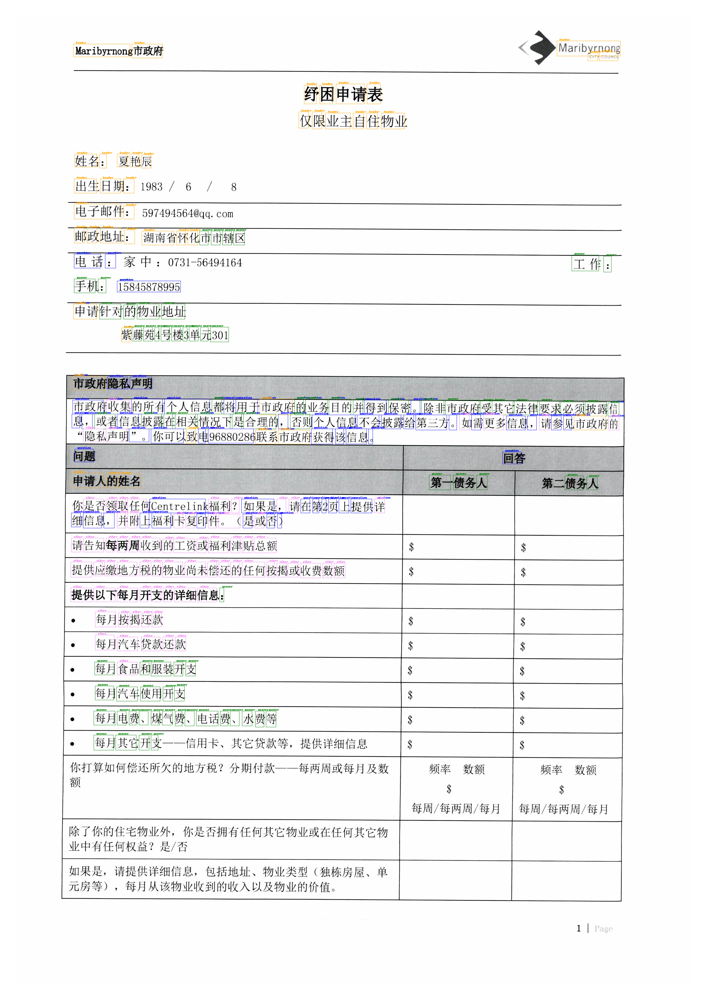

In [554]:
from PIL import ImageDraw
from PIL import Image, ImageDraw, ImageFont
image = Image.open("zh.val/"+ example['id'][:-2]+".jpg")
image = image.convert("RGB")
draw = ImageDraw.Draw(image)

font = ImageFont.load_default()

def iob_to_label(label):
    label = label[2:]
    if not label:
      return 'other'
    return label

label2color = {'question':'blue', 'answer':'green', 'header':'orange', 'other':'violet'}
pre_label_list=[]
for prediction, box in zip(true_predictions, true_boxes):
    predicted_label = iob_to_label(prediction).lower()
    pre_label_list.append(predicted_label)
    
    draw.rectangle(box, outline=label2color[predicted_label])
    draw.text((box[0] + 10, box[1] - 10), text=predicted_label, fill=label2color[predicted_label], font=font)
image

<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=2480x3508 at 0x7FC6DDE06BD0>


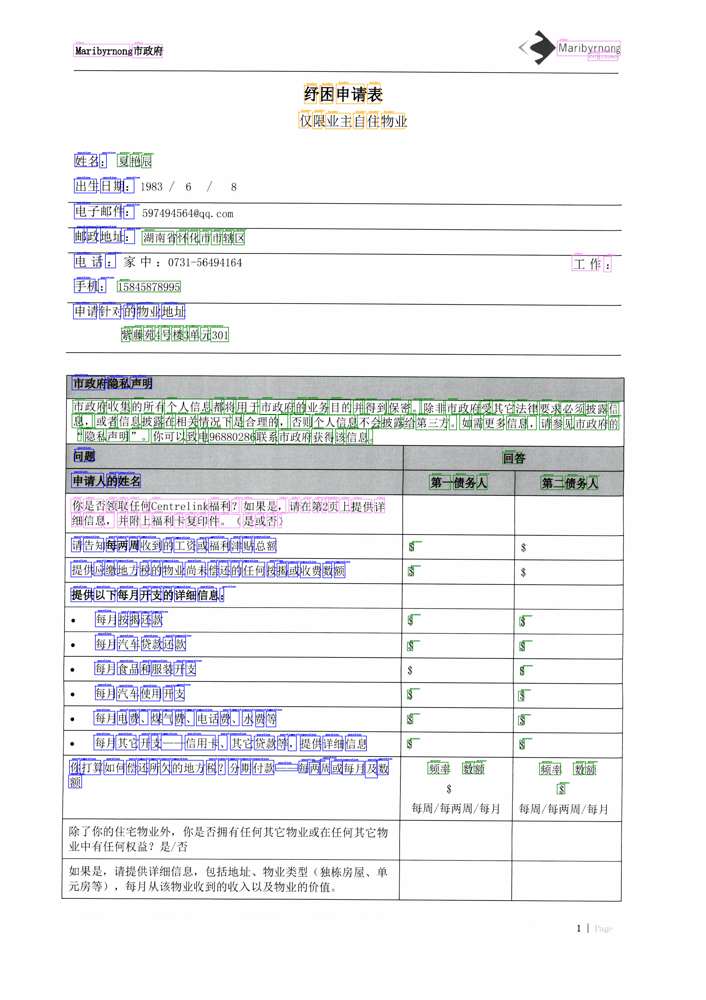

In [515]:
# image = Image.open(example['image_path'])
from PIL import Image, ImageDraw, ImageFont
example=dataset[0] # example是val中第一张图片
image = Image.open("zh.val/"+ example['id'][:-2]+".jpg")
print(image)
# image = example['image']
image = image.convert("RGB")

draw = ImageDraw.Draw(image)

for word, box, label in zip(word_list, example['bbox'], example['labels']):
  actual_label = iob_to_label(id2label[label]).lower()
  box = unnormalize_box(box, width, height)
  draw.rectangle(box, outline=label2color[actual_label], width=2)
  draw.text((box[0] + 10, box[1] - 10), actual_label, fill=label2color[actual_label], font=font)

image

In [443]:
# from layoutlmft import AutoModelForRelationExtraction
# model = AutoModelForRelationExtraction.from_pretrained("./checkpoint-2500", revision="no_ocr")
# outputs = model(**encoded_inputs)

ImportError: cannot import name 'AutoModelForRelationExtraction' from 'layoutlmft' (/Users/aile/PycharmProjects/visual/layoutlmft/__init__.py)

In [453]:
print(example['entities'].keys())

dict_keys(['end', 'label', 'start'])


In [457]:
result=[[{'head_id': 29, 'head': (257, 263), 'head_type': 1, 'tail_id': 28, 'tail': (256, 257), 'tail_type': 2, 'type': 1}, {'head_id': 30, 'head': (263, 269), 'head_type': 1, 'tail_id': 32, 'tail': (270, 271), 'tail_type': 2, 'type': 1}, {'head_id': 23, 'head': (211, 225), 'head_type': 1, 'tail_id': 22, 'tail': (210, 211), 'tail_type': 2, 'type': 1}, {'head_id': 30, 'head': (263, 269), 'head_type': 1, 'tail_id': 31, 'tail': (269, 270), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (37, 40), 'head_type': 1, 'tail_id': 54, 'tail': (439, 447), 'tail_type': 2, 'type': 1}, {'head_id': 35, 'head': (279, 285), 'head_type': 1, 'tail_id': 37, 'tail': (286, 287), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (257, 263), 'head_type': 1, 'tail_id': 27, 'tail': (255, 256), 'tail_type': 2, 'type': 1}, {'head_id': 6, 'head': (40, 45), 'head_type': 1, 'tail_id': 7, 'tail': (45, 53), 'tail_type': 2, 'type': 1}, {'head_id': 13, 'head': (83, 87), 'head_type': 1, 'tail_id': 16, 'tail': (141, 158), 'tail_type': 2, 'type': 1}, {'head_id': 35, 'head': (279, 285), 'head_type': 1, 'tail_id': 36, 'tail': (285, 286), 'tail_type': 2, 'type': 1}, {'head_id': 3, 'head': (30, 33), 'head_type': 1, 'tail_id': 2, 'tail': (26, 30), 'tail_type': 2, 'type': 1}, {'head_id': 13, 'head': (83, 87), 'head_type': 1, 'tail_id': 15, 'tail': (112, 141), 'tail_type': 2, 'type': 1}, {'head_id': 9, 'head': (59, 62), 'head_type': 1, 'tail_id': 10, 'tail': (62, 66), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (33, 37), 'head_type': 1, 'tail_id': 53, 'tail': (436, 439), 'tail_type': 2, 'type': 1}, {'head_id': 11, 'head': (66, 72), 'head_type': 1, 'tail_id': 12, 'tail': (72, 83), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (271, 278), 'head_type': 1, 'tail_id': 34, 'tail': (278, 279), 'tail_type': 2, 'type': 1}, {'head_id': 38, 'head': (287, 302), 'head_type': 1, 'tail_id': 39, 'tail': (302, 303), 'tail_type': 2, 'type': 1}, {'head_id': 13, 'head': (83, 87), 'head_type': 1, 'tail_id': 14, 'tail': (87, 112), 'tail_type': 2, 'type': 1}, {'head_id': 25, 'head': (226, 245), 'head_type': 1, 'tail_id': 24, 'tail': (225, 226), 'tail_type': 2, 'type': 1}, {'head_id': 30, 'head': (263, 269), 'head_type': 1, 'tail_id': 27, 'tail': (255, 256), 'tail_type': 2, 'type': 1}, {'head_id': 48, 'head': (332, 354), 'head_type': 1, 'tail_id': 41, 'tail': (304, 305), 'tail_type': 2, 'type': 1}, {'head_id': 19, 'head': (162, 166), 'head_type': 1, 'tail_id': 27, 'tail': (255, 256), 'tail_type': 2, 'type': 1}, {'head_id': 35, 'head': (279, 285), 'head_type': 1, 'tail_id': 34, 'tail': (278, 279), 'tail_type': 2, 'type': 1}, {'head_id': 23, 'head': (211, 225), 'head_type': 1, 'tail_id': 31, 'tail': (269, 270), 'tail_type': 2, 'type': 1}, {'head_id': 55, 'head': (447, 450), 'head_type': 1, 'tail_id': 7, 'tail': (45, 53), 'tail_type': 2, 'type': 1}, {'head_id': 48, 'head': (332, 354), 'head_type': 1, 'tail_id': 39, 'tail': (302, 303), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (271, 278), 'head_type': 1, 'tail_id': 32, 'tail': (270, 271), 'tail_type': 2, 'type': 1}, {'head_id': 25, 'head': (226, 245), 'head_type': 1, 'tail_id': 31, 'tail': (269, 270), 'tail_type': 2, 'type': 1}, {'head_id': 25, 'head': (226, 245), 'head_type': 1, 'tail_id': 32, 'tail': (270, 271), 'tail_type': 2, 'type': 1}, {'head_id': 23, 'head': (211, 225), 'head_type': 1, 'tail_id': 27, 'tail': (255, 256), 'tail_type': 2, 'type': 1}, {'head_id': 38, 'head': (287, 302), 'head_type': 1, 'tail_id': 34, 'tail': (278, 279), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (271, 278), 'head_type': 1, 'tail_id': 36, 'tail': (285, 286), 'tail_type': 2, 'type': 1}, {'head_id': 38, 'head': (287, 302), 'head_type': 1, 'tail_id': 37, 'tail': (286, 287), 'tail_type': 2, 'type': 1}, {'head_id': 48, 'head': (332, 354), 'head_type': 1, 'tail_id': 40, 'tail': (303, 304), 'tail_type': 2, 'type': 1}, {'head_id': 23, 'head': (211, 225), 'head_type': 1, 'tail_id': 28, 'tail': (256, 257), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (37, 40), 'head_type': 1, 'tail_id': 56, 'tail': (450, 456), 'tail_type': 2, 'type': 1}, {'head_id': 38, 'head': (287, 302), 'head_type': 1, 'tail_id': 41, 'tail': (304, 305), 'tail_type': 2, 'type': 1}, {'head_id': 30, 'head': (263, 269), 'head_type': 1, 'tail_id': 24, 'tail': (225, 226), 'tail_type': 2, 'type': 1}, {'head_id': 30, 'head': (263, 269), 'head_type': 1, 'tail_id': 34, 'tail': (278, 279), 'tail_type': 2, 'type': 1}, {'head_id': 48, 'head': (332, 354), 'head_type': 1, 'tail_id': 42, 'tail': (305, 306), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (271, 278), 'head_type': 1, 'tail_id': 39, 'tail': (302, 303), 'tail_type': 2, 'type': 1}, {'head_id': 8, 'head': (53, 56), 'head_type': 1, 'tail_id': 54, 'tail': (439, 447), 'tail_type': 2, 'type': 1}, {'head_id': 35, 'head': (279, 285), 'head_type': 1, 'tail_id': 39, 'tail': (302, 303), 'tail_type': 2, 'type': 1}, {'head_id': 23, 'head': (211, 225), 'head_type': 1, 'tail_id': 24, 'tail': (225, 226), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (271, 278), 'head_type': 1, 'tail_id': 31, 'tail': (269, 270), 'tail_type': 2, 'type': 1}, {'head_id': 38, 'head': (287, 302), 'head_type': 1, 'tail_id': 36, 'tail': (285, 286), 'tail_type': 2, 'type': 1}, {'head_id': 30, 'head': (263, 269), 'head_type': 1, 'tail_id': 28, 'tail': (256, 257), 'tail_type': 2, 'type': 1}, {'head_id': 8, 'head': (53, 56), 'head_type': 1, 'tail_id': 56, 'tail': (450, 456), 'tail_type': 2, 'type': 1}, {'head_id': 25, 'head': (226, 245), 'head_type': 1, 'tail_id': 28, 'tail': (256, 257), 'tail_type': 2, 'type': 1}], [{'head_id': 27, 'head': (252, 255), 'head_type': 1, 'tail_id': 26, 'tail': (218, 252), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (38, 41), 'head_type': 1, 'tail_id': 6, 'tail': (41, 45), 'tail_type': 2, 'type': 1}, {'head_id': 27, 'head': (252, 255), 'head_type': 1, 'tail_id': 29, 'tail': (292, 324), 'tail_type': 2, 'type': 1}, {'head_id': 1, 'head': (9, 12), 'head_type': 1, 'tail_id': 2, 'tail': (12, 30), 'tail_type': 2, 'type': 1}, {'head_id': 20, 'head': (125, 128), 'head_type': 1, 'tail_id': 21, 'tail': (128, 144), 'tail_type': 2, 'type': 1}, {'head_id': 27, 'head': (252, 255), 'head_type': 1, 'tail_id': 25, 'tail': (192, 218), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (395, 399), 'head_type': 1, 'tail_id': 39, 'tail': (464, 484), 'tail_type': 2, 'type': 1}, {'head_id': 20, 'head': (125, 128), 'head_type': 1, 'tail_id': 18, 'tail': (94, 111), 'tail_type': 2, 'type': 1}, {'head_id': 27, 'head': (252, 255), 'head_type': 1, 'tail_id': 28, 'tail': (255, 292), 'tail_type': 2, 'type': 1}, {'head_id': 27, 'head': (252, 255), 'head_type': 1, 'tail_id': 32, 'tail': (375, 395), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (395, 399), 'head_type': 1, 'tail_id': 35, 'tail': (404, 422), 'tail_type': 2, 'type': 1}, {'head_id': 20, 'head': (125, 128), 'head_type': 1, 'tail_id': 22, 'tail': (144, 164), 'tail_type': 2, 'type': 1}, {'head_id': 27, 'head': (252, 255), 'head_type': 1, 'tail_id': 24, 'tail': (171, 192), 'tail_type': 2, 'type': 1}, {'head_id': 9, 'head': (52, 55), 'head_type': 1, 'tail_id': 10, 'tail': (55, 58), 'tail_type': 2, 'type': 1}, {'head_id': 14, 'head': (77, 80), 'head_type': 1, 'tail_id': 15, 'tail': (80, 84), 'tail_type': 2, 'type': 1}, {'head_id': 20, 'head': (125, 128), 'head_type': 1, 'tail_id': 19, 'tail': (111, 125), 'tail_type': 2, 'type': 1}, {'head_id': 27, 'head': (252, 255), 'head_type': 1, 'tail_id': 31, 'tail': (347, 375), 'tail_type': 2, 'type': 1}, {'head_id': 11, 'head': (58, 62), 'head_type': 1, 'tail_id': 12, 'tail': (62, 71), 'tail_type': 2, 'type': 1}, {'head_id': 7, 'head': (45, 49), 'head_type': 1, 'tail_id': 8, 'tail': (49, 52), 'tail_type': 2, 'type': 1}, {'head_id': 20, 'head': (125, 128), 'head_type': 1, 'tail_id': 23, 'tail': (164, 171), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (395, 399), 'head_type': 1, 'tail_id': 37, 'tail': (442, 451), 'tail_type': 2, 'type': 1}, {'head_id': 27, 'head': (252, 255), 'head_type': 1, 'tail_id': 30, 'tail': (324, 347), 'tail_type': 2, 'type': 1}, {'head_id': 3, 'head': (30, 34), 'head_type': 1, 'tail_id': 4, 'tail': (34, 38), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (395, 399), 'head_type': 1, 'tail_id': 36, 'tail': (422, 442), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (395, 399), 'head_type': 1, 'tail_id': 30, 'tail': (324, 347), 'tail_type': 2, 'type': 1}, {'head_id': 3, 'head': (30, 34), 'head_type': 1, 'tail_id': 2, 'tail': (12, 30), 'tail_type': 2, 'type': 1}, {'head_id': 27, 'head': (252, 255), 'head_type': 1, 'tail_id': 39, 'tail': (464, 484), 'tail_type': 2, 'type': 1}, {'head_id': 27, 'head': (252, 255), 'head_type': 1, 'tail_id': 40, 'tail': (484, 504), 'tail_type': 2, 'type': 1}, {'head_id': 11, 'head': (58, 62), 'head_type': 1, 'tail_id': 15, 'tail': (80, 84), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (395, 399), 'head_type': 1, 'tail_id': 40, 'tail': (484, 504), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (395, 399), 'head_type': 1, 'tail_id': 29, 'tail': (292, 324), 'tail_type': 2, 'type': 1}, {'head_id': 27, 'head': (252, 255), 'head_type': 1, 'tail_id': 38, 'tail': (451, 464), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (395, 399), 'head_type': 1, 'tail_id': 28, 'tail': (255, 292), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (395, 399), 'head_type': 1, 'tail_id': 32, 'tail': (375, 395), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (395, 399), 'head_type': 1, 'tail_id': 26, 'tail': (218, 252), 'tail_type': 2, 'type': 1}, {'head_id': 27, 'head': (252, 255), 'head_type': 1, 'tail_id': 35, 'tail': (404, 422), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (395, 399), 'head_type': 1, 'tail_id': 25, 'tail': (192, 218), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (395, 399), 'head_type': 1, 'tail_id': 38, 'tail': (451, 464), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (395, 399), 'head_type': 1, 'tail_id': 24, 'tail': (171, 192), 'tail_type': 2, 'type': 1}, {'head_id': 14, 'head': (77, 80), 'head_type': 1, 'tail_id': 12, 'tail': (62, 71), 'tail_type': 2, 'type': 1}, {'head_id': 27, 'head': (252, 255), 'head_type': 1, 'tail_id': 37, 'tail': (442, 451), 'tail_type': 2, 'type': 1}, {'head_id': 1, 'head': (9, 12), 'head_type': 1, 'tail_id': 4, 'tail': (34, 38), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (395, 399), 'head_type': 1, 'tail_id': 31, 'tail': (347, 375), 'tail_type': 2, 'type': 1}, {'head_id': 27, 'head': (252, 255), 'head_type': 1, 'tail_id': 36, 'tail': (422, 442), 'tail_type': 2, 'type': 1}], [{'head_id': 17, 'head': (235, 244), 'head_type': 1, 'tail_id': 43, 'tail': (352, 355), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (235, 244), 'head_type': 1, 'tail_id': 20, 'tail': (252, 256), 'tail_type': 2, 'type': 1}, {'head_id': 14, 'head': (220, 223), 'head_type': 1, 'tail_id': 46, 'tail': (368, 371), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (235, 244), 'head_type': 1, 'tail_id': 37, 'tail': (335, 338), 'tail_type': 2, 'type': 1}, {'head_id': 15, 'head': (223, 226), 'head_type': 1, 'tail_id': 54, 'tail': (406, 412), 'tail_type': 2, 'type': 1}, {'head_id': 16, 'head': (226, 235), 'head_type': 1, 'tail_id': 36, 'tail': (333, 335), 'tail_type': 2, 'type': 1}, {'head_id': 14, 'head': (220, 223), 'head_type': 1, 'tail_id': 38, 'tail': (338, 341), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (235, 244), 'head_type': 1, 'tail_id': 63, 'tail': (462, 465), 'tail_type': 2, 'type': 1}, {'head_id': 15, 'head': (223, 226), 'head_type': 1, 'tail_id': 39, 'tail': (341, 344), 'tail_type': 2, 'type': 1}, {'head_id': 15, 'head': (223, 226), 'head_type': 1, 'tail_id': 34, 'tail': (318, 329), 'tail_type': 2, 'type': 1}, {'head_id': 16, 'head': (226, 235), 'head_type': 1, 'tail_id': 30, 'tail': (307, 309), 'tail_type': 2, 'type': 1}, {'head_id': 16, 'head': (226, 235), 'head_type': 1, 'tail_id': 23, 'tail': (265, 268), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (235, 244), 'head_type': 1, 'tail_id': 31, 'tail': (309, 312), 'tail_type': 2, 'type': 1}, {'head_id': 14, 'head': (220, 223), 'head_type': 1, 'tail_id': 53, 'tail': (402, 406), 'tail_type': 2, 'type': 1}, {'head_id': 16, 'head': (226, 235), 'head_type': 1, 'tail_id': 19, 'tail': (250, 252), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (235, 244), 'head_type': 1, 'tail_id': 27, 'tail': (283, 288), 'tail_type': 2, 'type': 1}, {'head_id': 14, 'head': (220, 223), 'head_type': 1, 'tail_id': 69, 'tail': (489, 493), 'tail_type': 2, 'type': 1}, {'head_id': 14, 'head': (220, 223), 'head_type': 1, 'tail_id': 45, 'tail': (364, 368), 'tail_type': 2, 'type': 1}, {'head_id': 14, 'head': (220, 223), 'head_type': 1, 'tail_id': 65, 'tail': (467, 471), 'tail_type': 2, 'type': 1}, {'head_id': 14, 'head': (220, 223), 'head_type': 1, 'tail_id': 21, 'tail': (256, 259), 'tail_type': 2, 'type': 1}, {'head_id': 14, 'head': (220, 223), 'head_type': 1, 'tail_id': 64, 'tail': (465, 467), 'tail_type': 2, 'type': 1}, {'head_id': 15, 'head': (223, 226), 'head_type': 1, 'tail_id': 65, 'tail': (467, 471), 'tail_type': 2, 'type': 1}, {'head_id': 16, 'head': (226, 235), 'head_type': 1, 'tail_id': 24, 'tail': (268, 271), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (235, 244), 'head_type': 1, 'tail_id': 42, 'tail': (348, 352), 'tail_type': 2, 'type': 1}, {'head_id': 15, 'head': (223, 226), 'head_type': 1, 'tail_id': 53, 'tail': (402, 406), 'tail_type': 2, 'type': 1}, {'head_id': 15, 'head': (223, 226), 'head_type': 1, 'tail_id': 38, 'tail': (338, 341), 'tail_type': 2, 'type': 1}, {'head_id': 15, 'head': (223, 226), 'head_type': 1, 'tail_id': 64, 'tail': (465, 467), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (235, 244), 'head_type': 1, 'tail_id': 62, 'tail': (459, 462), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (235, 244), 'head_type': 1, 'tail_id': 55, 'tail': (412, 415), 'tail_type': 2, 'type': 1}, {'head_id': 15, 'head': (223, 226), 'head_type': 1, 'tail_id': 46, 'tail': (368, 371), 'tail_type': 2, 'type': 1}, {'head_id': 15, 'head': (223, 226), 'head_type': 1, 'tail_id': 69, 'tail': (489, 493), 'tail_type': 2, 'type': 1}, {'head_id': 16, 'head': (226, 235), 'head_type': 1, 'tail_id': 27, 'tail': (283, 288), 'tail_type': 2, 'type': 1}, {'head_id': 14, 'head': (220, 223), 'head_type': 1, 'tail_id': 32, 'tail': (312, 315), 'tail_type': 2, 'type': 1}], [{'head_id': 8, 'head': (40, 43), 'head_type': 1, 'tail_id': 9, 'tail': (43, 47), 'tail_type': 2, 'type': 1}, {'head_id': 10, 'head': (47, 50), 'head_type': 1, 'tail_id': 11, 'tail': (50, 56), 'tail_type': 2, 'type': 1}], [{'head_id': 8, 'head': (84, 97), 'head_type': 1, 'tail_id': 35, 'tail': (438, 440), 'tail_type': 2, 'type': 1}, {'head_id': 18, 'head': (166, 173), 'head_type': 1, 'tail_id': 22, 'tail': (198, 201), 'tail_type': 2, 'type': 1}, {'head_id': 1, 'head': (24, 33), 'head_type': 1, 'tail_id': 3, 'tail': (42, 49), 'tail_type': 2, 'type': 1}, {'head_id': 10, 'head': (102, 111), 'head_type': 1, 'tail_id': 11, 'tail': (111, 114), 'tail_type': 2, 'type': 1}, {'head_id': 23, 'head': (207, 211), 'head_type': 1, 'tail_id': 31, 'tail': (379, 398), 'tail_type': 2, 'type': 1}, {'head_id': 18, 'head': (166, 173), 'head_type': 1, 'tail_id': 19, 'tail': (173, 182), 'tail_type': 2, 'type': 1}, {'head_id': 23, 'head': (207, 211), 'head_type': 1, 'tail_id': 32, 'tail': (398, 430), 'tail_type': 2, 'type': 1}, {'head_id': 23, 'head': (207, 211), 'head_type': 1, 'tail_id': 26, 'tail': (272, 285), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (51, 55), 'head_type': 1, 'tail_id': 36, 'tail': (440, 445), 'tail_type': 2, 'type': 1}, {'head_id': 23, 'head': (207, 211), 'head_type': 1, 'tail_id': 30, 'tail': (374, 379), 'tail_type': 2, 'type': 1}, {'head_id': 9, 'head': (97, 102), 'head_type': 1, 'tail_id': 12, 'tail': (114, 117), 'tail_type': 2, 'type': 1}, {'head_id': 18, 'head': (166, 173), 'head_type': 1, 'tail_id': 20, 'tail': (182, 189), 'tail_type': 2, 'type': 1}, {'head_id': 16, 'head': (135, 140), 'head_type': 1, 'tail_id': 40, 'tail': (454, 456), 'tail_type': 2, 'type': 1}, {'head_id': 23, 'head': (207, 211), 'head_type': 1, 'tail_id': 29, 'tail': (344, 374), 'tail_type': 2, 'type': 1}, {'head_id': 14, 'head': (126, 131), 'head_type': 1, 'tail_id': 15, 'tail': (131, 135), 'tail_type': 2, 'type': 1}, {'head_id': 18, 'head': (166, 173), 'head_type': 1, 'tail_id': 21, 'tail': (189, 198), 'tail_type': 2, 'type': 1}, {'head_id': 23, 'head': (207, 211), 'head_type': 1, 'tail_id': 24, 'tail': (211, 242), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (49, 51), 'head_type': 1, 'tail_id': 6, 'tail': (55, 67), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (151, 156), 'head_type': 1, 'tail_id': 39, 'tail': (452, 454), 'tail_type': 2, 'type': 1}, {'head_id': 23, 'head': (207, 211), 'head_type': 1, 'tail_id': 28, 'tail': (315, 344), 'tail_type': 2, 'type': 1}, {'head_id': 13, 'head': (117, 126), 'head_type': 1, 'tail_id': 38, 'tail': (448, 452), 'tail_type': 2, 'type': 1}, {'head_id': 23, 'head': (207, 211), 'head_type': 1, 'tail_id': 33, 'tail': (430, 436), 'tail_type': 2, 'type': 1}, {'head_id': 23, 'head': (207, 211), 'head_type': 1, 'tail_id': 27, 'tail': (285, 315), 'tail_type': 2, 'type': 1}, {'head_id': 2, 'head': (33, 42), 'head_type': 1, 'tail_id': 37, 'tail': (445, 448), 'tail_type': 2, 'type': 1}, {'head_id': 7, 'head': (67, 71), 'head_type': 1, 'tail_id': 34, 'tail': (436, 438), 'tail_type': 2, 'type': 1}, {'head_id': 8, 'head': (84, 97), 'head_type': 1, 'tail_id': 34, 'tail': (436, 438), 'tail_type': 2, 'type': 1}, {'head_id': 7, 'head': (67, 71), 'head_type': 1, 'tail_id': 6, 'tail': (55, 67), 'tail_type': 2, 'type': 1}, {'head_id': 9, 'head': (97, 102), 'head_type': 1, 'tail_id': 11, 'tail': (111, 114), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (49, 51), 'head_type': 1, 'tail_id': 34, 'tail': (436, 438), 'tail_type': 2, 'type': 1}], [{'head_id': 26, 'head': (103, 106), 'head_type': 1, 'tail_id': 24, 'tail': (91, 95), 'tail_type': 2, 'type': 1}, {'head_id': 22, 'head': (72, 75), 'head_type': 1, 'tail_id': 23, 'tail': (75, 77), 'tail_type': 2, 'type': 1}, {'head_id': 30, 'head': (146, 149), 'head_type': 1, 'tail_id': 32, 'tail': (151, 153), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (52, 56), 'head_type': 1, 'tail_id': 43, 'tail': (279, 300), 'tail_type': 2, 'type': 1}, {'head_id': 8, 'head': (28, 30), 'head_type': 1, 'tail_id': 9, 'tail': (30, 32), 'tail_type': 2, 'type': 1}, {'head_id': 18, 'head': (64, 67), 'head_type': 1, 'tail_id': 19, 'tail': (67, 69), 'tail_type': 2, 'type': 1}, {'head_id': 10, 'head': (35, 37), 'head_type': 1, 'tail_id': 3, 'tail': (13, 17), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (169, 173), 'head_type': 1, 'tail_id': 35, 'tail': (162, 164), 'tail_type': 2, 'type': 1}, {'head_id': 15, 'head': (46, 49), 'head_type': 1, 'tail_id': 12, 'tail': (39, 41), 'tail_type': 2, 'type': 1}, {'head_id': 6, 'head': (22, 26), 'head_type': 1, 'tail_id': 7, 'tail': (26, 28), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (164, 169), 'head_type': 1, 'tail_id': 38, 'tail': (173, 175), 'tail_type': 2, 'type': 1}, {'head_id': 20, 'head': (69, 71), 'head_type': 1, 'tail_id': 21, 'tail': (71, 72), 'tail_type': 2, 'type': 1}, {'head_id': 2, 'head': (10, 13), 'head_type': 1, 'tail_id': 42, 'tail': (273, 279), 'tail_type': 2, 'type': 1}, {'head_id': 1, 'head': (6, 10), 'head_type': 1, 'tail_id': 41, 'tail': (267, 273), 'tail_type': 2, 'type': 1}, {'head_id': 39, 'head': (175, 182), 'head_type': 1, 'tail_id': 40, 'tail': (182, 184), 'tail_type': 2, 'type': 1}, {'head_id': 16, 'head': (49, 52), 'head_type': 1, 'tail_id': 11, 'tail': (37, 39), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (17, 20), 'head_type': 1, 'tail_id': 5, 'tail': (20, 22), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (139, 146), 'head_type': 1, 'tail_id': 33, 'tail': (153, 157), 'tail_type': 2, 'type': 1}, {'head_id': 31, 'head': (149, 151), 'head_type': 1, 'tail_id': 34, 'tail': (157, 160), 'tail_type': 2, 'type': 1}, {'head_id': 13, 'head': (41, 44), 'head_type': 1, 'tail_id': 14, 'tail': (44, 46), 'tail_type': 2, 'type': 1}, {'head_id': 2, 'head': (10, 13), 'head_type': 1, 'tail_id': 41, 'tail': (267, 273), 'tail_type': 2, 'type': 1}, {'head_id': 6, 'head': (22, 26), 'head_type': 1, 'tail_id': 42, 'tail': (273, 279), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (169, 173), 'head_type': 1, 'tail_id': 40, 'tail': (182, 184), 'tail_type': 2, 'type': 1}, {'head_id': 1, 'head': (6, 10), 'head_type': 1, 'tail_id': 42, 'tail': (273, 279), 'tail_type': 2, 'type': 1}], [{'head_id': 5, 'head': (20, 25), 'head_type': 1, 'tail_id': 6, 'tail': (25, 31), 'tail_type': 2, 'type': 1}, {'head_id': 28, 'head': (153, 160), 'head_type': 1, 'tail_id': 29, 'tail': (160, 169), 'tail_type': 2, 'type': 1}, {'head_id': 18, 'head': (81, 84), 'head_type': 1, 'tail_id': 15, 'tail': (71, 75), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (190, 192), 'head_type': 1, 'tail_id': 37, 'tail': (192, 193), 'tail_type': 2, 'type': 1}, {'head_id': 24, 'head': (105, 109), 'head_type': 1, 'tail_id': 26, 'tail': (125, 136), 'tail_type': 2, 'type': 1}, {'head_id': 40, 'head': (203, 207), 'head_type': 1, 'tail_id': 41, 'tail': (207, 209), 'tail_type': 2, 'type': 1}, {'head_id': 30, 'head': (169, 177), 'head_type': 1, 'tail_id': 31, 'tail': (177, 180), 'tail_type': 2, 'type': 1}, {'head_id': 1, 'head': (5, 8), 'head_type': 1, 'tail_id': 2, 'tail': (8, 13), 'tail_type': 2, 'type': 1}, {'head_id': 32, 'head': (180, 184), 'head_type': 1, 'tail_id': 33, 'tail': (184, 185), 'tail_type': 2, 'type': 1}, {'head_id': 12, 'head': (61, 64), 'head_type': 1, 'tail_id': 13, 'tail': (64, 67), 'tail_type': 2, 'type': 1}, {'head_id': 20, 'head': (88, 91), 'head_type': 1, 'tail_id': 21, 'tail': (91, 99), 'tail_type': 2, 'type': 1}, {'head_id': 24, 'head': (105, 109), 'head_type': 1, 'tail_id': 27, 'tail': (136, 153), 'tail_type': 2, 'type': 1}, {'head_id': 18, 'head': (81, 84), 'head_type': 1, 'tail_id': 16, 'tail': (75, 78), 'tail_type': 2, 'type': 1}, {'head_id': 12, 'head': (61, 64), 'head_type': 1, 'tail_id': 17, 'tail': (78, 81), 'tail_type': 2, 'type': 1}, {'head_id': 10, 'head': (53, 56), 'head_type': 1, 'tail_id': 9, 'tail': (52, 53), 'tail_type': 2, 'type': 1}, {'head_id': 12, 'head': (61, 64), 'head_type': 1, 'tail_id': 14, 'tail': (67, 71), 'tail_type': 2, 'type': 1}, {'head_id': 20, 'head': (88, 91), 'head_type': 1, 'tail_id': 22, 'tail': (99, 102), 'tail_type': 2, 'type': 1}, {'head_id': 7, 'head': (31, 35), 'head_type': 1, 'tail_id': 8, 'tail': (35, 41), 'tail_type': 2, 'type': 1}, {'head_id': 20, 'head': (88, 91), 'head_type': 1, 'tail_id': 23, 'tail': (102, 105), 'tail_type': 2, 'type': 1}, {'head_id': 38, 'head': (196, 201), 'head_type': 1, 'tail_id': 39, 'tail': (201, 203), 'tail_type': 2, 'type': 1}, {'head_id': 24, 'head': (105, 109), 'head_type': 1, 'tail_id': 25, 'tail': (109, 125), 'tail_type': 2, 'type': 1}, {'head_id': 3, 'head': (13, 16), 'head_type': 1, 'tail_id': 4, 'tail': (16, 20), 'tail_type': 2, 'type': 1}, {'head_id': 18, 'head': (81, 84), 'head_type': 1, 'tail_id': 19, 'tail': (84, 88), 'tail_type': 2, 'type': 1}, {'head_id': 32, 'head': (180, 184), 'head_type': 1, 'tail_id': 35, 'tail': (188, 190), 'tail_type': 2, 'type': 1}, {'head_id': 40, 'head': (203, 207), 'head_type': 1, 'tail_id': 17, 'tail': (78, 81), 'tail_type': 2, 'type': 1}, {'head_id': 24, 'head': (105, 109), 'head_type': 1, 'tail_id': 23, 'tail': (102, 105), 'tail_type': 2, 'type': 1}, {'head_id': 40, 'head': (203, 207), 'head_type': 1, 'tail_id': 19, 'tail': (84, 88), 'tail_type': 2, 'type': 1}], [{'head_id': 22, 'head': (93, 99), 'head_type': 1, 'tail_id': 23, 'tail': (99, 104), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (154, 157), 'head_type': 1, 'tail_id': 45, 'tail': (218, 222), 'tail_type': 2, 'type': 1}, {'head_id': 21, 'head': (88, 93), 'head_type': 1, 'tail_id': 24, 'tail': (104, 106), 'tail_type': 2, 'type': 1}, {'head_id': 34, 'head': (157, 160), 'head_type': 1, 'tail_id': 35, 'tail': (160, 173), 'tail_type': 2, 'type': 1}, {'head_id': 31, 'head': (149, 152), 'head_type': 1, 'tail_id': 32, 'tail': (152, 154), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (59, 63), 'head_type': 1, 'tail_id': 15, 'tail': (55, 56), 'tail_type': 2, 'type': 1}, {'head_id': 1, 'head': (16, 23), 'head_type': 1, 'tail_id': 2, 'tail': (23, 25), 'tail_type': 2, 'type': 1}, {'head_id': 6, 'head': (32, 35), 'head_type': 1, 'tail_id': 7, 'tail': (35, 37), 'tail_type': 2, 'type': 1}, {'head_id': 8, 'head': (37, 39), 'head_type': 1, 'tail_id': 10, 'tail': (42, 44), 'tail_type': 2, 'type': 1}, {'head_id': 25, 'head': (115, 118), 'head_type': 1, 'tail_id': 26, 'tail': (118, 126), 'tail_type': 2, 'type': 1}, {'head_id': 28, 'head': (133, 137), 'head_type': 1, 'tail_id': 27, 'tail': (126, 133), 'tail_type': 2, 'type': 1}, {'head_id': 16, 'head': (56, 59), 'head_type': 1, 'tail_id': 18, 'tail': (63, 65), 'tail_type': 2, 'type': 1}, {'head_id': 11, 'head': (44, 46), 'head_type': 1, 'tail_id': 13, 'tail': (52, 53), 'tail_type': 2, 'type': 1}, {'head_id': 1, 'head': (16, 23), 'head_type': 1, 'tail_id': 4, 'tail': (29, 30), 'tail_type': 2, 'type': 1}, {'head_id': 30, 'head': (143, 149), 'head_type': 1, 'tail_id': 29, 'tail': (137, 143), 'tail_type': 2, 'type': 1}, {'head_id': 19, 'head': (76, 84), 'head_type': 1, 'tail_id': 20, 'tail': (84, 88), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (30, 32), 'head_type': 1, 'tail_id': 3, 'tail': (25, 29), 'tail_type': 2, 'type': 1}, {'head_id': 41, 'head': (202, 205), 'head_type': 1, 'tail_id': 14, 'tail': (53, 55), 'tail_type': 2, 'type': 1}, {'head_id': 9, 'head': (39, 42), 'head_type': 1, 'tail_id': 12, 'tail': (49, 52), 'tail_type': 2, 'type': 1}, {'head_id': 41, 'head': (202, 205), 'head_type': 1, 'tail_id': 13, 'tail': (52, 53), 'tail_type': 2, 'type': 1}, {'head_id': 34, 'head': (157, 160), 'head_type': 1, 'tail_id': 32, 'tail': (152, 154), 'tail_type': 2, 'type': 1}, {'head_id': 11, 'head': (44, 46), 'head_type': 1, 'tail_id': 14, 'tail': (53, 55), 'tail_type': 2, 'type': 1}, {'head_id': 31, 'head': (149, 152), 'head_type': 1, 'tail_id': 35, 'tail': (160, 173), 'tail_type': 2, 'type': 1}, {'head_id': 34, 'head': (157, 160), 'head_type': 1, 'tail_id': 36, 'tail': (173, 178), 'tail_type': 2, 'type': 1}, {'head_id': 30, 'head': (143, 149), 'head_type': 1, 'tail_id': 32, 'tail': (152, 154), 'tail_type': 2, 'type': 1}, {'head_id': 31, 'head': (149, 152), 'head_type': 1, 'tail_id': 37, 'tail': (178, 184), 'tail_type': 2, 'type': 1}, {'head_id': 34, 'head': (157, 160), 'head_type': 1, 'tail_id': 37, 'tail': (178, 184), 'tail_type': 2, 'type': 1}], [{'head_id': 38, 'head': (379, 383), 'head_type': 1, 'tail_id': 43, 'tail': (401, 404), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (26, 38), 'head_type': 1, 'tail_id': 13, 'tail': (102, 117), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (26, 38), 'head_type': 1, 'tail_id': 19, 'tail': (194, 205), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (26, 38), 'head_type': 1, 'tail_id': 26, 'tail': (302, 317), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (26, 38), 'head_type': 1, 'tail_id': 23, 'tail': (251, 267), 'tail_type': 2, 'type': 1}, {'head_id': 0, 'head': (0, 7), 'head_type': 1, 'tail_id': 32, 'tail': (337, 350), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (22, 26), 'head_type': 1, 'tail_id': 9, 'tail': (45, 52), 'tail_type': 2, 'type': 1}, {'head_id': 35, 'head': (365, 371), 'head_type': 1, 'tail_id': 44, 'tail': (404, 406), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (375, 379), 'head_type': 1, 'tail_id': 42, 'tail': (396, 401), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (26, 38), 'head_type': 1, 'tail_id': 12, 'tail': (85, 102), 'tail_type': 2, 'type': 1}, {'head_id': 39, 'head': (383, 386), 'head_type': 1, 'tail_id': 45, 'tail': (406, 408), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (26, 38), 'head_type': 1, 'tail_id': 18, 'tail': (178, 194), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (26, 38), 'head_type': 1, 'tail_id': 25, 'tail': (285, 302), 'tail_type': 2, 'type': 1}, {'head_id': 8, 'head': (43, 45), 'head_type': 1, 'tail_id': 29, 'tail': (327, 330), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (26, 38), 'head_type': 1, 'tail_id': 22, 'tail': (237, 251), 'tail_type': 2, 'type': 1}, {'head_id': 3, 'head': (16, 22), 'head_type': 1, 'tail_id': 27, 'tail': (317, 321), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (375, 379), 'head_type': 1, 'tail_id': 41, 'tail': (392, 396), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (26, 38), 'head_type': 1, 'tail_id': 11, 'tail': (66, 85), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (371, 375), 'head_type': 1, 'tail_id': 40, 'tail': (386, 392), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (26, 38), 'head_type': 1, 'tail_id': 17, 'tail': (163, 178), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (26, 38), 'head_type': 1, 'tail_id': 24, 'tail': (267, 285), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (26, 38), 'head_type': 1, 'tail_id': 46, 'tail': (408, 410), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (26, 38), 'head_type': 1, 'tail_id': 15, 'tail': (134, 149), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (26, 38), 'head_type': 1, 'tail_id': 21, 'tail': (222, 237), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (26, 38), 'head_type': 1, 'tail_id': 10, 'tail': (52, 66), 'tail_type': 2, 'type': 1}, {'head_id': 2, 'head': (11, 16), 'head_type': 1, 'tail_id': 28, 'tail': (321, 327), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (26, 38), 'head_type': 1, 'tail_id': 16, 'tail': (149, 163), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (26, 38), 'head_type': 1, 'tail_id': 14, 'tail': (117, 134), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (26, 38), 'head_type': 1, 'tail_id': 20, 'tail': (205, 222), 'tail_type': 2, 'type': 1}, {'head_id': 6, 'head': (38, 41), 'head_type': 1, 'tail_id': 34, 'tail': (358, 365), 'tail_type': 2, 'type': 1}, {'head_id': 7, 'head': (41, 43), 'head_type': 1, 'tail_id': 30, 'tail': (330, 333), 'tail_type': 2, 'type': 1}, {'head_id': 2, 'head': (11, 16), 'head_type': 1, 'tail_id': 27, 'tail': (317, 321), 'tail_type': 2, 'type': 1}, {'head_id': 2, 'head': (11, 16), 'head_type': 1, 'tail_id': 32, 'tail': (337, 350), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (371, 375), 'head_type': 1, 'tail_id': 41, 'tail': (392, 396), 'tail_type': 2, 'type': 1}, {'head_id': 0, 'head': (0, 7), 'head_type': 1, 'tail_id': 27, 'tail': (317, 321), 'tail_type': 2, 'type': 1}, {'head_id': 3, 'head': (16, 22), 'head_type': 1, 'tail_id': 28, 'tail': (321, 327), 'tail_type': 2, 'type': 1}, {'head_id': 35, 'head': (365, 371), 'head_type': 1, 'tail_id': 40, 'tail': (386, 392), 'tail_type': 2, 'type': 1}, {'head_id': 0, 'head': (0, 7), 'head_type': 1, 'tail_id': 28, 'tail': (321, 327), 'tail_type': 2, 'type': 1}, {'head_id': 1, 'head': (7, 11), 'head_type': 1, 'tail_id': 32, 'tail': (337, 350), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (371, 375), 'head_type': 1, 'tail_id': 44, 'tail': (404, 406), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (375, 379), 'head_type': 1, 'tail_id': 40, 'tail': (386, 392), 'tail_type': 2, 'type': 1}, {'head_id': 3, 'head': (16, 22), 'head_type': 1, 'tail_id': 32, 'tail': (337, 350), 'tail_type': 2, 'type': 1}], [{'head_id': 10, 'head': (42, 45), 'head_type': 1, 'tail_id': 11, 'tail': (45, 47), 'tail_type': 2, 'type': 1}, {'head_id': 7, 'head': (35, 38), 'head_type': 1, 'tail_id': 12, 'tail': (47, 49), 'tail_type': 2, 'type': 1}, {'head_id': 24, 'head': (100, 106), 'head_type': 1, 'tail_id': 26, 'tail': (110, 113), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (63, 67), 'head_type': 1, 'tail_id': 20, 'tail': (75, 83), 'tail_type': 2, 'type': 1}, {'head_id': 8, 'head': (38, 40), 'head_type': 1, 'tail_id': 9, 'tail': (40, 42), 'tail_type': 2, 'type': 1}, {'head_id': 40, 'head': (179, 182), 'head_type': 1, 'tail_id': 41, 'tail': (182, 206), 'tail_type': 2, 'type': 1}, {'head_id': 18, 'head': (67, 70), 'head_type': 1, 'tail_id': 19, 'tail': (70, 75), 'tail_type': 2, 'type': 1}, {'head_id': 31, 'head': (132, 134), 'head_type': 1, 'tail_id': 36, 'tail': (145, 146), 'tail_type': 2, 'type': 1}, {'head_id': 1, 'head': (17, 19), 'head_type': 1, 'tail_id': 5, 'tail': (29, 33), 'tail_type': 2, 'type': 1}, {'head_id': 31, 'head': (132, 134), 'head_type': 1, 'tail_id': 35, 'tail': (144, 145), 'tail_type': 2, 'type': 1}, {'head_id': 23, 'head': (93, 98), 'head_type': 1, 'tail_id': 25, 'tail': (106, 110), 'tail_type': 2, 'type': 1}, {'head_id': 30, 'head': (130, 132), 'head_type': 1, 'tail_id': 38, 'tail': (148, 152), 'tail_type': 2, 'type': 1}, {'head_id': 46, 'head': (235, 242), 'head_type': 1, 'tail_id': 49, 'tail': (264, 268), 'tail_type': 2, 'type': 1}, {'head_id': 2, 'head': (19, 22), 'head_type': 1, 'tail_id': 6, 'tail': (33, 35), 'tail_type': 2, 'type': 1}, {'head_id': 24, 'head': (100, 106), 'head_type': 1, 'tail_id': 28, 'tail': (117, 120), 'tail_type': 2, 'type': 1}, {'head_id': 13, 'head': (49, 54), 'head_type': 1, 'tail_id': 15, 'tail': (57, 60), 'tail_type': 2, 'type': 1}, {'head_id': 30, 'head': (130, 132), 'head_type': 1, 'tail_id': 34, 'tail': (140, 144), 'tail_type': 2, 'type': 1}, {'head_id': 45, 'head': (228, 235), 'head_type': 1, 'tail_id': 47, 'tail': (242, 246), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (127, 130), 'head_type': 1, 'tail_id': 33, 'tail': (138, 140), 'tail_type': 2, 'type': 1}, {'head_id': 40, 'head': (179, 182), 'head_type': 1, 'tail_id': 39, 'tail': (152, 179), 'tail_type': 2, 'type': 1}, {'head_id': 44, 'head': (216, 222), 'head_type': 1, 'tail_id': 43, 'tail': (212, 216), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (127, 130), 'head_type': 1, 'tail_id': 37, 'tail': (146, 148), 'tail_type': 2, 'type': 1}, {'head_id': 14, 'head': (54, 57), 'head_type': 1, 'tail_id': 16, 'tail': (60, 63), 'tail_type': 2, 'type': 1}, {'head_id': 48, 'head': (259, 264), 'head_type': 1, 'tail_id': 42, 'tail': (206, 212), 'tail_type': 2, 'type': 1}, {'head_id': 21, 'head': (83, 86), 'head_type': 1, 'tail_id': 22, 'tail': (86, 93), 'tail_type': 2, 'type': 1}, {'head_id': 23, 'head': (93, 98), 'head_type': 1, 'tail_id': 27, 'tail': (113, 117), 'tail_type': 2, 'type': 1}, {'head_id': 3, 'head': (22, 26), 'head_type': 1, 'tail_id': 4, 'tail': (26, 29), 'tail_type': 2, 'type': 1}, {'head_id': 45, 'head': (228, 235), 'head_type': 1, 'tail_id': 43, 'tail': (212, 216), 'tail_type': 2, 'type': 1}], [{'head_id': 22, 'head': (72, 75), 'head_type': 1, 'tail_id': 23, 'tail': (75, 82), 'tail_type': 2, 'type': 1}, {'head_id': 42, 'head': (160, 162), 'head_type': 1, 'tail_id': 43, 'tail': (162, 166), 'tail_type': 2, 'type': 1}, {'head_id': 54, 'head': (206, 212), 'head_type': 1, 'tail_id': 58, 'tail': (225, 231), 'tail_type': 2, 'type': 1}, {'head_id': 83, 'head': (431, 433), 'head_type': 1, 'tail_id': 68, 'tail': (317, 321), 'tail_type': 2, 'type': 1}, {'head_id': 40, 'head': (149, 150), 'head_type': 1, 'tail_id': 41, 'tail': (150, 160), 'tail_type': 2, 'type': 1}, {'head_id': 15, 'head': (46, 49), 'head_type': 1, 'tail_id': 16, 'tail': (49, 51), 'tail_type': 2, 'type': 1}, {'head_id': 52, 'head': (199, 202), 'head_type': 1, 'tail_id': 82, 'tail': (427, 429), 'tail_type': 2, 'type': 1}, {'head_id': 66, 'head': (311, 315), 'head_type': 1, 'tail_id': 69, 'tail': (321, 323), 'tail_type': 2, 'type': 1}, {'head_id': 31, 'head': (113, 117), 'head_type': 1, 'tail_id': 32, 'tail': (117, 119), 'tail_type': 2, 'type': 1}, {'head_id': 49, 'head': (179, 188), 'head_type': 1, 'tail_id': 50, 'tail': (188, 194), 'tail_type': 2, 'type': 1}, {'head_id': 55, 'head': (212, 217), 'head_type': 1, 'tail_id': 62, 'tail': (243, 245), 'tail_type': 2, 'type': 1}, {'head_id': 6, 'head': (24, 27), 'head_type': 1, 'tail_id': 7, 'tail': (27, 30), 'tail_type': 2, 'type': 1}, {'head_id': 56, 'head': (217, 221), 'head_type': 1, 'tail_id': 61, 'tail': (239, 243), 'tail_type': 2, 'type': 1}, {'head_id': 53, 'head': (202, 206), 'head_type': 1, 'tail_id': 59, 'tail': (231, 235), 'tail_type': 2, 'type': 1}, {'head_id': 26, 'head': (91, 95), 'head_type': 1, 'tail_id': 29, 'tail': (103, 108), 'tail_type': 2, 'type': 1}, {'head_id': 54, 'head': (206, 212), 'head_type': 1, 'tail_id': 60, 'tail': (235, 239), 'tail_type': 2, 'type': 1}, {'head_id': 27, 'head': (97, 99), 'head_type': 1, 'tail_id': 28, 'tail': (99, 103), 'tail_type': 2, 'type': 1}, {'head_id': 35, 'head': (127, 136), 'head_type': 1, 'tail_id': 36, 'tail': (136, 139), 'tail_type': 2, 'type': 1}, {'head_id': 47, 'head': (172, 177), 'head_type': 1, 'tail_id': 48, 'tail': (177, 179), 'tail_type': 2, 'type': 1}, {'head_id': 78, 'head': (415, 417), 'head_type': 1, 'tail_id': 8, 'tail': (30, 34), 'tail_type': 2, 'type': 1}, {'head_id': 83, 'head': (431, 433), 'head_type': 1, 'tail_id': 70, 'tail': (323, 326), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (21, 23), 'head_type': 1, 'tail_id': 5, 'tail': (23, 24), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (139, 141), 'head_type': 1, 'tail_id': 38, 'tail': (141, 144), 'tail_type': 2, 'type': 1}, {'head_id': 39, 'head': (144, 149), 'head_type': 1, 'tail_id': 44, 'tail': (166, 169), 'tail_type': 2, 'type': 1}, {'head_id': 52, 'head': (199, 202), 'head_type': 1, 'tail_id': 63, 'tail': (245, 247), 'tail_type': 2, 'type': 1}, {'head_id': 9, 'head': (34, 37), 'head_type': 1, 'tail_id': 10, 'tail': (37, 39), 'tail_type': 2, 'type': 1}, {'head_id': 2, 'head': (16, 19), 'head_type': 1, 'tail_id': 3, 'tail': (19, 21), 'tail_type': 2, 'type': 1}, {'head_id': 66, 'head': (311, 315), 'head_type': 1, 'tail_id': 67, 'tail': (315, 317), 'tail_type': 2, 'type': 1}, {'head_id': 77, 'head': (412, 415), 'head_type': 1, 'tail_id': 74, 'tail': (398, 404), 'tail_type': 2, 'type': 1}, {'head_id': 87, 'head': (446, 449), 'head_type': 1, 'tail_id': 88, 'tail': (449, 452), 'tail_type': 2, 'type': 1}, {'head_id': 19, 'head': (58, 61), 'head_type': 1, 'tail_id': 20, 'tail': (61, 68), 'tail_type': 2, 'type': 1}, {'head_id': 11, 'head': (39, 41), 'head_type': 1, 'tail_id': 12, 'tail': (41, 43), 'tail_type': 2, 'type': 1}, {'head_id': 1, 'head': (6, 13), 'head_type': 1, 'tail_id': 84, 'tail': (438, 440), 'tail_type': 2, 'type': 1}, {'head_id': 52, 'head': (199, 202), 'head_type': 1, 'tail_id': 80, 'tail': (422, 424), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (53, 56), 'head_type': 1, 'tail_id': 18, 'tail': (56, 58), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (119, 125), 'head_type': 1, 'tail_id': 34, 'tail': (125, 127), 'tail_type': 2, 'type': 1}, {'head_id': 53, 'head': (202, 206), 'head_type': 1, 'tail_id': 57, 'tail': (221, 225), 'tail_type': 2, 'type': 1}, {'head_id': 71, 'head': (326, 329), 'head_type': 1, 'tail_id': 73, 'tail': (360, 398), 'tail_type': 2, 'type': 1}, {'head_id': 75, 'head': (404, 408), 'head_type': 1, 'tail_id': 76, 'tail': (408, 412), 'tail_type': 2, 'type': 1}, {'head_id': 13, 'head': (43, 45), 'head_type': 1, 'tail_id': 14, 'tail': (45, 46), 'tail_type': 2, 'type': 1}, {'head_id': 45, 'head': (169, 171), 'head_type': 1, 'tail_id': 46, 'tail': (171, 172), 'tail_type': 2, 'type': 1}, {'head_id': 79, 'head': (417, 420), 'head_type': 1, 'tail_id': 30, 'tail': (108, 113), 'tail_type': 2, 'type': 1}, {'head_id': 85, 'head': (440, 444), 'head_type': 1, 'tail_id': 86, 'tail': (444, 446), 'tail_type': 2, 'type': 1}, {'head_id': 24, 'head': (82, 86), 'head_type': 1, 'tail_id': 25, 'tail': (86, 91), 'tail_type': 2, 'type': 1}, {'head_id': 71, 'head': (326, 329), 'head_type': 1, 'tail_id': 72, 'tail': (329, 360), 'tail_type': 2, 'type': 1}, {'head_id': 52, 'head': (199, 202), 'head_type': 1, 'tail_id': 81, 'tail': (424, 427), 'tail_type': 2, 'type': 1}, {'head_id': 9, 'head': (34, 37), 'head_type': 1, 'tail_id': 84, 'tail': (438, 440), 'tail_type': 2, 'type': 1}, {'head_id': 85, 'head': (440, 444), 'head_type': 1, 'tail_id': 12, 'tail': (41, 43), 'tail_type': 2, 'type': 1}, {'head_id': 54, 'head': (206, 212), 'head_type': 1, 'tail_id': 46, 'tail': (171, 172), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (119, 125), 'head_type': 1, 'tail_id': 20, 'tail': (61, 68), 'tail_type': 2, 'type': 1}, {'head_id': 19, 'head': (58, 61), 'head_type': 1, 'tail_id': 34, 'tail': (125, 127), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (119, 125), 'head_type': 1, 'tail_id': 38, 'tail': (141, 144), 'tail_type': 2, 'type': 1}, {'head_id': 47, 'head': (172, 177), 'head_type': 1, 'tail_id': 61, 'tail': (239, 243), 'tail_type': 2, 'type': 1}, {'head_id': 79, 'head': (417, 420), 'head_type': 1, 'tail_id': 44, 'tail': (166, 169), 'tail_type': 2, 'type': 1}, {'head_id': 77, 'head': (412, 415), 'head_type': 1, 'tail_id': 70, 'tail': (323, 326), 'tail_type': 2, 'type': 1}, {'head_id': 45, 'head': (169, 171), 'head_type': 1, 'tail_id': 60, 'tail': (235, 239), 'tail_type': 2, 'type': 1}, {'head_id': 87, 'head': (446, 449), 'head_type': 1, 'tail_id': 12, 'tail': (41, 43), 'tail_type': 2, 'type': 1}, {'head_id': 42, 'head': (160, 162), 'head_type': 1, 'tail_id': 28, 'tail': (99, 103), 'tail_type': 2, 'type': 1}, {'head_id': 85, 'head': (440, 444), 'head_type': 1, 'tail_id': 88, 'tail': (449, 452), 'tail_type': 2, 'type': 1}, {'head_id': 87, 'head': (446, 449), 'head_type': 1, 'tail_id': 86, 'tail': (444, 446), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (53, 56), 'head_type': 1, 'tail_id': 80, 'tail': (422, 424), 'tail_type': 2, 'type': 1}, {'head_id': 11, 'head': (39, 41), 'head_type': 1, 'tail_id': 88, 'tail': (449, 452), 'tail_type': 2, 'type': 1}, {'head_id': 21, 'head': (68, 72), 'head_type': 1, 'tail_id': 32, 'tail': (117, 119), 'tail_type': 2, 'type': 1}, {'head_id': 11, 'head': (39, 41), 'head_type': 1, 'tail_id': 86, 'tail': (444, 446), 'tail_type': 2, 'type': 1}, {'head_id': 79, 'head': (417, 420), 'head_type': 1, 'tail_id': 18, 'tail': (56, 58), 'tail_type': 2, 'type': 1}, {'head_id': 35, 'head': (127, 136), 'head_type': 1, 'tail_id': 41, 'tail': (150, 160), 'tail_type': 2, 'type': 1}, {'head_id': 27, 'head': (97, 99), 'head_type': 1, 'tail_id': 43, 'tail': (162, 166), 'tail_type': 2, 'type': 1}, {'head_id': 56, 'head': (217, 221), 'head_type': 1, 'tail_id': 48, 'tail': (177, 179), 'tail_type': 2, 'type': 1}, {'head_id': 6, 'head': (24, 27), 'head_type': 1, 'tail_id': 76, 'tail': (408, 412), 'tail_type': 2, 'type': 1}, {'head_id': 39, 'head': (144, 149), 'head_type': 1, 'tail_id': 29, 'tail': (103, 108), 'tail_type': 2, 'type': 1}, {'head_id': 79, 'head': (417, 420), 'head_type': 1, 'tail_id': 29, 'tail': (103, 108), 'tail_type': 2, 'type': 1}, {'head_id': 26, 'head': (91, 95), 'head_type': 1, 'tail_id': 44, 'tail': (166, 169), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (139, 141), 'head_type': 1, 'tail_id': 34, 'tail': (125, 127), 'tail_type': 2, 'type': 1}, {'head_id': 40, 'head': (149, 150), 'head_type': 1, 'tail_id': 36, 'tail': (136, 139), 'tail_type': 2, 'type': 1}, {'head_id': 45, 'head': (169, 171), 'head_type': 1, 'tail_id': 58, 'tail': (225, 231), 'tail_type': 2, 'type': 1}, {'head_id': 75, 'head': (404, 408), 'head_type': 1, 'tail_id': 7, 'tail': (27, 30), 'tail_type': 2, 'type': 1}], [{'head_id': 22, 'head': (210, 214), 'head_type': 1, 'tail_id': 23, 'tail': (218, 223), 'tail_type': 2, 'type': 1}, {'head_id': 28, 'head': (245, 248), 'head_type': 1, 'tail_id': 29, 'tail': (248, 256), 'tail_type': 2, 'type': 1}, {'head_id': 25, 'head': (227, 230), 'head_type': 1, 'tail_id': 27, 'tail': (241, 245), 'tail_type': 2, 'type': 1}, {'head_id': 18, 'head': (154, 159), 'head_type': 1, 'tail_id': 19, 'tail': (162, 169), 'tail_type': 2, 'type': 1}, {'head_id': 32, 'head': (262, 268), 'head_type': 1, 'tail_id': 40, 'tail': (312, 314), 'tail_type': 2, 'type': 1}, {'head_id': 45, 'head': (353, 357), 'head_type': 1, 'tail_id': 0, 'tail': (0, 6), 'tail_type': 2, 'type': 1}, {'head_id': 1, 'head': (6, 10), 'head_type': 1, 'tail_id': 2, 'tail': (10, 14), 'tail_type': 2, 'type': 1}, {'head_id': 16, 'head': (146, 149), 'head_type': 1, 'tail_id': 17, 'tail': (151, 154), 'tail_type': 2, 'type': 1}, {'head_id': 30, 'head': (256, 259), 'head_type': 1, 'tail_id': 33, 'tail': (287, 290), 'tail_type': 2, 'type': 1}, {'head_id': 20, 'head': (173, 178), 'head_type': 1, 'tail_id': 21, 'tail': (187, 210), 'tail_type': 2, 'type': 1}, {'head_id': 9, 'head': (59, 65), 'head_type': 1, 'tail_id': 10, 'tail': (71, 82), 'tail_type': 2, 'type': 1}, {'head_id': 14, 'head': (114, 123), 'head_type': 1, 'tail_id': 15, 'tail': (132, 146), 'tail_type': 2, 'type': 1}, {'head_id': 8, 'head': (46, 51), 'head_type': 1, 'tail_id': 7, 'tail': (41, 46), 'tail_type': 2, 'type': 1}, {'head_id': 11, 'head': (88, 92), 'head_type': 1, 'tail_id': 12, 'tail': (100, 105), 'tail_type': 2, 'type': 1}, {'head_id': 48, 'head': (365, 367), 'head_type': 1, 'tail_id': 39, 'tail': (305, 312), 'tail_type': 2, 'type': 1}, {'head_id': 1, 'head': (6, 10), 'head_type': 1, 'tail_id': 47, 'tail': (364, 365), 'tail_type': 2, 'type': 1}, {'head_id': 32, 'head': (262, 268), 'head_type': 1, 'tail_id': 36, 'tail': (298, 300), 'tail_type': 2, 'type': 1}, {'head_id': 32, 'head': (262, 268), 'head_type': 1, 'tail_id': 44, 'tail': (343, 348), 'tail_type': 2, 'type': 1}, {'head_id': 30, 'head': (256, 259), 'head_type': 1, 'tail_id': 27, 'tail': (241, 245), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (23, 29), 'head_type': 1, 'tail_id': 7, 'tail': (41, 46), 'tail_type': 2, 'type': 1}, {'head_id': 20, 'head': (173, 178), 'head_type': 1, 'tail_id': 23, 'tail': (218, 223), 'tail_type': 2, 'type': 1}, {'head_id': 42, 'head': (317, 323), 'head_type': 1, 'tail_id': 2, 'tail': (10, 14), 'tail_type': 2, 'type': 1}, {'head_id': 28, 'head': (245, 248), 'head_type': 1, 'tail_id': 39, 'tail': (305, 312), 'tail_type': 2, 'type': 1}, {'head_id': 22, 'head': (210, 214), 'head_type': 1, 'tail_id': 21, 'tail': (187, 210), 'tail_type': 2, 'type': 1}, {'head_id': 3, 'head': (19, 23), 'head_type': 1, 'tail_id': 46, 'tail': (362, 364), 'tail_type': 2, 'type': 1}, {'head_id': 41, 'head': (314, 317), 'head_type': 1, 'tail_id': 36, 'tail': (298, 300), 'tail_type': 2, 'type': 1}, {'head_id': 24, 'head': (223, 227), 'head_type': 1, 'tail_id': 34, 'tail': (290, 292), 'tail_type': 2, 'type': 1}, {'head_id': 48, 'head': (365, 367), 'head_type': 1, 'tail_id': 29, 'tail': (248, 256), 'tail_type': 2, 'type': 1}, {'head_id': 41, 'head': (314, 317), 'head_type': 1, 'tail_id': 40, 'tail': (312, 314), 'tail_type': 2, 'type': 1}, {'head_id': 28, 'head': (245, 248), 'head_type': 1, 'tail_id': 38, 'tail': (303, 305), 'tail_type': 2, 'type': 1}, {'head_id': 24, 'head': (223, 227), 'head_type': 1, 'tail_id': 38, 'tail': (303, 305), 'tail_type': 2, 'type': 1}], [{'head_id': 5, 'head': (33, 36), 'head_type': 1, 'tail_id': 6, 'tail': (36, 39), 'tail_type': 2, 'type': 1}, {'head_id': 9, 'head': (45, 50), 'head_type': 1, 'tail_id': 8, 'tail': (43, 45), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (203, 210), 'head_type': 1, 'tail_id': 41, 'tail': (225, 226), 'tail_type': 2, 'type': 1}, {'head_id': 19, 'head': (118, 128), 'head_type': 1, 'tail_id': 22, 'tail': (142, 145), 'tail_type': 2, 'type': 1}, {'head_id': 16, 'head': (83, 87), 'head_type': 1, 'tail_id': 14, 'tail': (72, 77), 'tail_type': 2, 'type': 1}, {'head_id': 34, 'head': (210, 216), 'head_type': 1, 'tail_id': 49, 'tail': (240, 241), 'tail_type': 2, 'type': 1}, {'head_id': 12, 'head': (62, 66), 'head_type': 1, 'tail_id': 13, 'tail': (66, 72), 'tail_type': 2, 'type': 1}, {'head_id': 15, 'head': (77, 83), 'head_type': 1, 'tail_id': 11, 'tail': (56, 62), 'tail_type': 2, 'type': 1}, {'head_id': 7, 'head': (39, 43), 'head_type': 1, 'tail_id': 10, 'tail': (50, 56), 'tail_type': 2, 'type': 1}, {'head_id': 27, 'head': (162, 165), 'head_type': 1, 'tail_id': 24, 'tail': (148, 152), 'tail_type': 2, 'type': 1}, {'head_id': 32, 'head': (198, 203), 'head_type': 1, 'tail_id': 39, 'tail': (221, 224), 'tail_type': 2, 'type': 1}, {'head_id': 34, 'head': (210, 216), 'head_type': 1, 'tail_id': 44, 'tail': (231, 233), 'tail_type': 2, 'type': 1}, {'head_id': 19, 'head': (118, 128), 'head_type': 1, 'tail_id': 20, 'tail': (128, 132), 'tail_type': 2, 'type': 1}, {'head_id': 30, 'head': (190, 193), 'head_type': 1, 'tail_id': 35, 'tail': (216, 217), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (203, 210), 'head_type': 1, 'tail_id': 48, 'tail': (238, 240), 'tail_type': 2, 'type': 1}, {'head_id': 3, 'head': (21, 26), 'head_type': 1, 'tail_id': 1, 'tail': (10, 16), 'tail_type': 2, 'type': 1}, {'head_id': 30, 'head': (190, 193), 'head_type': 1, 'tail_id': 40, 'tail': (224, 225), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (203, 210), 'head_type': 1, 'tail_id': 37, 'tail': (218, 220), 'tail_type': 2, 'type': 1}, {'head_id': 28, 'head': (165, 168), 'head_type': 1, 'tail_id': 25, 'tail': (152, 157), 'tail_type': 2, 'type': 1}, {'head_id': 3, 'head': (21, 26), 'head_type': 1, 'tail_id': 2, 'tail': (16, 21), 'tail_type': 2, 'type': 1}, {'head_id': 32, 'head': (198, 203), 'head_type': 1, 'tail_id': 35, 'tail': (216, 217), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (203, 210), 'head_type': 1, 'tail_id': 38, 'tail': (220, 221), 'tail_type': 2, 'type': 1}, {'head_id': 31, 'head': (193, 198), 'head_type': 1, 'tail_id': 38, 'tail': (220, 221), 'tail_type': 2, 'type': 1}, {'head_id': 28, 'head': (165, 168), 'head_type': 1, 'tail_id': 22, 'tail': (142, 145), 'tail_type': 2, 'type': 1}, {'head_id': 32, 'head': (198, 203), 'head_type': 1, 'tail_id': 40, 'tail': (224, 225), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (203, 210), 'head_type': 1, 'tail_id': 43, 'tail': (230, 231), 'tail_type': 2, 'type': 1}], [{'head_id': 5, 'head': (23, 25), 'head_type': 1, 'tail_id': 6, 'tail': (25, 29), 'tail_type': 2, 'type': 1}, {'head_id': 48, 'head': (228, 232), 'head_type': 1, 'tail_id': 62, 'tail': (279, 284), 'tail_type': 2, 'type': 1}, {'head_id': 49, 'head': (232, 236), 'head_type': 1, 'tail_id': 63, 'tail': (284, 287), 'tail_type': 2, 'type': 1}, {'head_id': 46, 'head': (220, 226), 'head_type': 1, 'tail_id': 47, 'tail': (226, 228), 'tail_type': 2, 'type': 1}, {'head_id': 45, 'head': (215, 220), 'head_type': 1, 'tail_id': 93, 'tail': (430, 432), 'tail_type': 2, 'type': 1}, {'head_id': 49, 'head': (232, 236), 'head_type': 1, 'tail_id': 54, 'tail': (253, 256), 'tail_type': 2, 'type': 1}, {'head_id': 51, 'head': (240, 242), 'head_type': 1, 'tail_id': 67, 'tail': (300, 303), 'tail_type': 2, 'type': 1}, {'head_id': 44, 'head': (208, 215), 'head_type': 1, 'tail_id': 92, 'tail': (428, 430), 'tail_type': 2, 'type': 1}, {'head_id': 1, 'head': (6, 9), 'head_type': 1, 'tail_id': 2, 'tail': (9, 14), 'tail_type': 2, 'type': 1}, {'head_id': 20, 'head': (84, 87), 'head_type': 1, 'tail_id': 21, 'tail': (87, 113), 'tail_type': 2, 'type': 1}, {'head_id': 25, 'head': (129, 133), 'head_type': 1, 'tail_id': 26, 'tail': (133, 140), 'tail_type': 2, 'type': 1}, {'head_id': 50, 'head': (236, 240), 'head_type': 1, 'tail_id': 70, 'tail': (312, 315), 'tail_type': 2, 'type': 1}, {'head_id': 27, 'head': (140, 143), 'head_type': 1, 'tail_id': 36, 'tail': (176, 180), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (146, 149), 'head_type': 1, 'tail_id': 34, 'tail': (166, 169), 'tail_type': 2, 'type': 1}, {'head_id': 49, 'head': (232, 236), 'head_type': 1, 'tail_id': 58, 'tail': (265, 268), 'tail_type': 2, 'type': 1}, {'head_id': 28, 'head': (143, 146), 'head_type': 1, 'tail_id': 39, 'tail': (188, 190), 'tail_type': 2, 'type': 1}, {'head_id': 84, 'head': (384, 387), 'head_type': 1, 'tail_id': 91, 'tail': (422, 428), 'tail_type': 2, 'type': 1}, {'head_id': 30, 'head': (149, 152), 'head_type': 1, 'tail_id': 38, 'tail': (183, 188), 'tail_type': 2, 'type': 1}, {'head_id': 27, 'head': (140, 143), 'head_type': 1, 'tail_id': 32, 'tail': (160, 164), 'tail_type': 2, 'type': 1}, {'head_id': 51, 'head': (240, 242), 'head_type': 1, 'tail_id': 60, 'tail': (271, 274), 'tail_type': 2, 'type': 1}, {'head_id': 13, 'head': (55, 58), 'head_type': 1, 'tail_id': 15, 'tail': (64, 69), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (146, 149), 'head_type': 1, 'tail_id': 42, 'tail': (197, 200), 'tail_type': 2, 'type': 1}, {'head_id': 52, 'head': (242, 246), 'head_type': 1, 'tail_id': 75, 'tail': (338, 339), 'tail_type': 2, 'type': 1}, {'head_id': 77, 'head': (344, 348), 'head_type': 1, 'tail_id': 79, 'tail': (361, 366), 'tail_type': 2, 'type': 1}, {'head_id': 9, 'head': (35, 39), 'head_type': 1, 'tail_id': 10, 'tail': (39, 45), 'tail_type': 2, 'type': 1}, {'head_id': 30, 'head': (149, 152), 'head_type': 1, 'tail_id': 43, 'tail': (200, 208), 'tail_type': 2, 'type': 1}, {'head_id': 51, 'head': (240, 242), 'head_type': 1, 'tail_id': 56, 'tail': (259, 262), 'tail_type': 2, 'type': 1}, {'head_id': 48, 'head': (228, 232), 'head_type': 1, 'tail_id': 53, 'tail': (246, 253), 'tail_type': 2, 'type': 1}, {'head_id': 13, 'head': (55, 58), 'head_type': 1, 'tail_id': 19, 'tail': (82, 84), 'tail_type': 2, 'type': 1}, {'head_id': 51, 'head': (240, 242), 'head_type': 1, 'tail_id': 65, 'tail': (290, 294), 'tail_type': 2, 'type': 1}, {'head_id': 23, 'head': (120, 124), 'head_type': 1, 'tail_id': 24, 'tail': (124, 129), 'tail_type': 2, 'type': 1}, {'head_id': 11, 'head': (45, 49), 'head_type': 1, 'tail_id': 12, 'tail': (49, 55), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (146, 149), 'head_type': 1, 'tail_id': 37, 'tail': (180, 183), 'tail_type': 2, 'type': 1}, {'head_id': 50, 'head': (236, 240), 'head_type': 1, 'tail_id': 55, 'tail': (256, 259), 'tail_type': 2, 'type': 1}, {'head_id': 50, 'head': (236, 240), 'head_type': 1, 'tail_id': 64, 'tail': (287, 290), 'tail_type': 2, 'type': 1}, {'head_id': 81, 'head': (371, 375), 'head_type': 1, 'tail_id': 82, 'tail': (375, 380), 'tail_type': 2, 'type': 1}, {'head_id': 7, 'head': (29, 32), 'head_type': 1, 'tail_id': 8, 'tail': (32, 35), 'tail_type': 2, 'type': 1}, {'head_id': 78, 'head': (348, 351), 'head_type': 1, 'tail_id': 80, 'tail': (366, 371), 'tail_type': 2, 'type': 1}, {'head_id': 84, 'head': (384, 387), 'head_type': 1, 'tail_id': 88, 'tail': (404, 410), 'tail_type': 2, 'type': 1}, {'head_id': 13, 'head': (55, 58), 'head_type': 1, 'tail_id': 14, 'tail': (58, 64), 'tail_type': 2, 'type': 1}, {'head_id': 30, 'head': (149, 152), 'head_type': 1, 'tail_id': 35, 'tail': (169, 176), 'tail_type': 2, 'type': 1}, {'head_id': 50, 'head': (236, 240), 'head_type': 1, 'tail_id': 59, 'tail': (268, 271), 'tail_type': 2, 'type': 1}, {'head_id': 52, 'head': (242, 246), 'head_type': 1, 'tail_id': 71, 'tail': (315, 316), 'tail_type': 2, 'type': 1}, {'head_id': 13, 'head': (55, 58), 'head_type': 1, 'tail_id': 18, 'tail': (79, 82), 'tail_type': 2, 'type': 1}, {'head_id': 28, 'head': (143, 146), 'head_type': 1, 'tail_id': 33, 'tail': (164, 166), 'tail_type': 2, 'type': 1}, {'head_id': 48, 'head': (228, 232), 'head_type': 1, 'tail_id': 57, 'tail': (262, 265), 'tail_type': 2, 'type': 1}, {'head_id': 83, 'head': (380, 384), 'head_type': 1, 'tail_id': 87, 'tail': (400, 404), 'tail_type': 2, 'type': 1}, {'head_id': 3, 'head': (14, 18), 'head_type': 1, 'tail_id': 4, 'tail': (18, 23), 'tail_type': 2, 'type': 1}, {'head_id': 78, 'head': (348, 351), 'head_type': 1, 'tail_id': 86, 'tail': (396, 400), 'tail_type': 2, 'type': 1}, {'head_id': 45, 'head': (215, 220), 'head_type': 1, 'tail_id': 54, 'tail': (253, 256), 'tail_type': 2, 'type': 1}, {'head_id': 52, 'head': (242, 246), 'head_type': 1, 'tail_id': 70, 'tail': (312, 315), 'tail_type': 2, 'type': 1}, {'head_id': 50, 'head': (236, 240), 'head_type': 1, 'tail_id': 63, 'tail': (284, 287), 'tail_type': 2, 'type': 1}, {'head_id': 28, 'head': (143, 146), 'head_type': 1, 'tail_id': 34, 'tail': (166, 169), 'tail_type': 2, 'type': 1}, {'head_id': 84, 'head': (384, 387), 'head_type': 1, 'tail_id': 71, 'tail': (315, 316), 'tail_type': 2, 'type': 1}, {'head_id': 27, 'head': (140, 143), 'head_type': 1, 'tail_id': 24, 'tail': (124, 129), 'tail_type': 2, 'type': 1}, {'head_id': 46, 'head': (220, 226), 'head_type': 1, 'tail_id': 58, 'tail': (265, 268), 'tail_type': 2, 'type': 1}, {'head_id': 44, 'head': (208, 215), 'head_type': 1, 'tail_id': 40, 'tail': (190, 194), 'tail_type': 2, 'type': 1}, {'head_id': 1, 'head': (6, 9), 'head_type': 1, 'tail_id': 6, 'tail': (25, 29), 'tail_type': 2, 'type': 1}, {'head_id': 83, 'head': (380, 384), 'head_type': 1, 'tail_id': 80, 'tail': (366, 371), 'tail_type': 2, 'type': 1}, {'head_id': 49, 'head': (232, 236), 'head_type': 1, 'tail_id': 55, 'tail': (256, 259), 'tail_type': 2, 'type': 1}, {'head_id': 1, 'head': (6, 9), 'head_type': 1, 'tail_id': 62, 'tail': (279, 284), 'tail_type': 2, 'type': 1}, {'head_id': 51, 'head': (240, 242), 'head_type': 1, 'tail_id': 75, 'tail': (338, 339), 'tail_type': 2, 'type': 1}, {'head_id': 44, 'head': (208, 215), 'head_type': 1, 'tail_id': 54, 'tail': (253, 256), 'tail_type': 2, 'type': 1}, {'head_id': 84, 'head': (384, 387), 'head_type': 1, 'tail_id': 74, 'tail': (335, 338), 'tail_type': 2, 'type': 1}, {'head_id': 78, 'head': (348, 351), 'head_type': 1, 'tail_id': 87, 'tail': (400, 404), 'tail_type': 2, 'type': 1}, {'head_id': 20, 'head': (84, 87), 'head_type': 1, 'tail_id': 15, 'tail': (64, 69), 'tail_type': 2, 'type': 1}, {'head_id': 28, 'head': (143, 146), 'head_type': 1, 'tail_id': 35, 'tail': (169, 176), 'tail_type': 2, 'type': 1}, {'head_id': 25, 'head': (129, 133), 'head_type': 1, 'tail_id': 33, 'tail': (164, 166), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (146, 149), 'head_type': 1, 'tail_id': 39, 'tail': (188, 190), 'tail_type': 2, 'type': 1}, {'head_id': 20, 'head': (84, 87), 'head_type': 1, 'tail_id': 18, 'tail': (79, 82), 'tail_type': 2, 'type': 1}, {'head_id': 81, 'head': (371, 375), 'head_type': 1, 'tail_id': 79, 'tail': (361, 366), 'tail_type': 2, 'type': 1}, {'head_id': 52, 'head': (242, 246), 'head_type': 1, 'tail_id': 74, 'tail': (335, 338), 'tail_type': 2, 'type': 1}, {'head_id': 84, 'head': (384, 387), 'head_type': 1, 'tail_id': 75, 'tail': (338, 339), 'tail_type': 2, 'type': 1}, {'head_id': 52, 'head': (242, 246), 'head_type': 1, 'tail_id': 88, 'tail': (404, 410), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (146, 149), 'head_type': 1, 'tail_id': 35, 'tail': (169, 176), 'tail_type': 2, 'type': 1}, {'head_id': 28, 'head': (143, 146), 'head_type': 1, 'tail_id': 37, 'tail': (180, 183), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (146, 149), 'head_type': 1, 'tail_id': 38, 'tail': (183, 188), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (23, 25), 'head_type': 1, 'tail_id': 2, 'tail': (9, 14), 'tail_type': 2, 'type': 1}, {'head_id': 20, 'head': (84, 87), 'head_type': 1, 'tail_id': 19, 'tail': (82, 84), 'tail_type': 2, 'type': 1}, {'head_id': 77, 'head': (344, 348), 'head_type': 1, 'tail_id': 82, 'tail': (375, 380), 'tail_type': 2, 'type': 1}, {'head_id': 28, 'head': (143, 146), 'head_type': 1, 'tail_id': 42, 'tail': (197, 200), 'tail_type': 2, 'type': 1}, {'head_id': 45, 'head': (215, 220), 'head_type': 1, 'tail_id': 58, 'tail': (265, 268), 'tail_type': 2, 'type': 1}, {'head_id': 50, 'head': (236, 240), 'head_type': 1, 'tail_id': 69, 'tail': (309, 312), 'tail_type': 2, 'type': 1}], [{'head_id': 11, 'head': (76, 81), 'head_type': 1, 'tail_id': 16, 'tail': (98, 102), 'tail_type': 2, 'type': 1}, {'head_id': 27, 'head': (130, 133), 'head_type': 1, 'tail_id': 26, 'tail': (127, 130), 'tail_type': 2, 'type': 1}, {'head_id': 42, 'head': (212, 217), 'head_type': 1, 'tail_id': 43, 'tail': (217, 219), 'tail_type': 2, 'type': 1}, {'head_id': 69, 'head': (474, 479), 'head_type': 1, 'tail_id': 70, 'tail': (479, 485), 'tail_type': 2, 'type': 1}, {'head_id': 46, 'head': (234, 238), 'head_type': 1, 'tail_id': 51, 'tail': (253, 257), 'tail_type': 2, 'type': 1}, {'head_id': 34, 'head': (163, 171), 'head_type': 1, 'tail_id': 35, 'tail': (171, 173), 'tail_type': 2, 'type': 1}, {'head_id': 11, 'head': (76, 81), 'head_type': 1, 'tail_id': 14, 'tail': (89, 94), 'tail_type': 2, 'type': 1}, {'head_id': 44, 'head': (219, 229), 'head_type': 1, 'tail_id': 41, 'tail': (208, 212), 'tail_type': 2, 'type': 1}, {'head_id': 49, 'head': (246, 250), 'head_type': 1, 'tail_id': 50, 'tail': (250, 253), 'tail_type': 2, 'type': 1}, {'head_id': 6, 'head': (42, 47), 'head_type': 1, 'tail_id': 7, 'tail': (47, 56), 'tail_type': 2, 'type': 1}, {'head_id': 56, 'head': (273, 279), 'head_type': 1, 'tail_id': 57, 'tail': (279, 281), 'tail_type': 2, 'type': 1}, {'head_id': 11, 'head': (76, 81), 'head_type': 1, 'tail_id': 13, 'tail': (85, 89), 'tail_type': 2, 'type': 1}, {'head_id': 59, 'head': (283, 290), 'head_type': 1, 'tail_id': 58, 'tail': (281, 283), 'tail_type': 2, 'type': 1}, {'head_id': 61, 'head': (320, 325), 'head_type': 1, 'tail_id': 60, 'tail': (310, 312), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (135, 139), 'head_type': 1, 'tail_id': 30, 'tail': (139, 141), 'tail_type': 2, 'type': 1}, {'head_id': 19, 'head': (110, 112), 'head_type': 1, 'tail_id': 17, 'tail': (102, 106), 'tail_type': 2, 'type': 1}, {'head_id': 9, 'head': (64, 69), 'head_type': 1, 'tail_id': 10, 'tail': (69, 76), 'tail_type': 2, 'type': 1}, {'head_id': 62, 'head': (372, 377), 'head_type': 1, 'tail_id': 63, 'tail': (377, 382), 'tail_type': 2, 'type': 1}, {'head_id': 66, 'head': (401, 406), 'head_type': 1, 'tail_id': 67, 'tail': (406, 416), 'tail_type': 2, 'type': 1}, {'head_id': 11, 'head': (76, 81), 'head_type': 1, 'tail_id': 12, 'tail': (81, 85), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (178, 185), 'head_type': 1, 'tail_id': 40, 'tail': (197, 208), 'tail_type': 2, 'type': 1}, {'head_id': 31, 'head': (141, 144), 'head_type': 1, 'tail_id': 28, 'tail': (133, 135), 'tail_type': 2, 'type': 1}, {'head_id': 64, 'head': (390, 395), 'head_type': 1, 'tail_id': 65, 'tail': (395, 401), 'tail_type': 2, 'type': 1}, {'head_id': 20, 'head': (112, 115), 'head_type': 1, 'tail_id': 23, 'tail': (121, 123), 'tail_type': 2, 'type': 1}, {'head_id': 21, 'head': (115, 118), 'head_type': 1, 'tail_id': 22, 'tail': (118, 121), 'tail_type': 2, 'type': 1}, {'head_id': 53, 'head': (259, 268), 'head_type': 1, 'tail_id': 54, 'tail': (268, 270), 'tail_type': 2, 'type': 1}, {'head_id': 39, 'head': (187, 197), 'head_type': 1, 'tail_id': 38, 'tail': (185, 187), 'tail_type': 2, 'type': 1}, {'head_id': 24, 'head': (123, 125), 'head_type': 1, 'tail_id': 25, 'tail': (125, 127), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (33, 37), 'head_type': 1, 'tail_id': 3, 'tail': (29, 33), 'tail_type': 2, 'type': 1}, {'head_id': 48, 'head': (242, 246), 'head_type': 1, 'tail_id': 47, 'tail': (238, 242), 'tail_type': 2, 'type': 1}, {'head_id': 11, 'head': (76, 81), 'head_type': 1, 'tail_id': 15, 'tail': (94, 98), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (173, 178), 'head_type': 1, 'tail_id': 41, 'tail': (208, 212), 'tail_type': 2, 'type': 1}, {'head_id': 31, 'head': (141, 144), 'head_type': 1, 'tail_id': 33, 'tail': (152, 163), 'tail_type': 2, 'type': 1}, {'head_id': 18, 'head': (106, 110), 'head_type': 1, 'tail_id': 22, 'tail': (118, 121), 'tail_type': 2, 'type': 1}, {'head_id': 44, 'head': (219, 229), 'head_type': 1, 'tail_id': 40, 'tail': (197, 208), 'tail_type': 2, 'type': 1}, {'head_id': 8, 'head': (56, 64), 'head_type': 1, 'tail_id': 22, 'tail': (118, 121), 'tail_type': 2, 'type': 1}, {'head_id': 39, 'head': (187, 197), 'head_type': 1, 'tail_id': 43, 'tail': (217, 219), 'tail_type': 2, 'type': 1}, {'head_id': 53, 'head': (259, 268), 'head_type': 1, 'tail_id': 43, 'tail': (217, 219), 'tail_type': 2, 'type': 1}, {'head_id': 59, 'head': (283, 290), 'head_type': 1, 'tail_id': 60, 'tail': (310, 312), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (178, 185), 'head_type': 1, 'tail_id': 41, 'tail': (208, 212), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (135, 139), 'head_type': 1, 'tail_id': 26, 'tail': (127, 130), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (37, 42), 'head_type': 1, 'tail_id': 17, 'tail': (102, 106), 'tail_type': 2, 'type': 1}, {'head_id': 61, 'head': (320, 325), 'head_type': 1, 'tail_id': 58, 'tail': (281, 283), 'tail_type': 2, 'type': 1}, {'head_id': 55, 'head': (270, 273), 'head_type': 1, 'tail_id': 58, 'tail': (281, 283), 'tail_type': 2, 'type': 1}, {'head_id': 53, 'head': (259, 268), 'head_type': 1, 'tail_id': 67, 'tail': (406, 416), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (33, 37), 'head_type': 1, 'tail_id': 1, 'tail': (7, 15), 'tail_type': 2, 'type': 1}, {'head_id': 62, 'head': (372, 377), 'head_type': 1, 'tail_id': 67, 'tail': (406, 416), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (173, 178), 'head_type': 1, 'tail_id': 40, 'tail': (197, 208), 'tail_type': 2, 'type': 1}, {'head_id': 66, 'head': (401, 406), 'head_type': 1, 'tail_id': 54, 'tail': (268, 270), 'tail_type': 2, 'type': 1}, {'head_id': 42, 'head': (212, 217), 'head_type': 1, 'tail_id': 38, 'tail': (185, 187), 'tail_type': 2, 'type': 1}, {'head_id': 27, 'head': (130, 133), 'head_type': 1, 'tail_id': 30, 'tail': (139, 141), 'tail_type': 2, 'type': 1}, {'head_id': 55, 'head': (270, 273), 'head_type': 1, 'tail_id': 60, 'tail': (310, 312), 'tail_type': 2, 'type': 1}, {'head_id': 32, 'head': (144, 152), 'head_type': 1, 'tail_id': 33, 'tail': (152, 163), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (33, 37), 'head_type': 1, 'tail_id': 2, 'tail': (15, 21), 'tail_type': 2, 'type': 1}], [{'head_id': 1, 'head': (18, 22), 'head_type': 1, 'tail_id': 2, 'tail': (22, 23), 'tail_type': 2, 'type': 1}, {'head_id': 1, 'head': (18, 22), 'head_type': 1, 'tail_id': 3, 'tail': (23, 28), 'tail_type': 2, 'type': 1}, {'head_id': 1, 'head': (18, 22), 'head_type': 1, 'tail_id': 4, 'tail': (28, 30), 'tail_type': 2, 'type': 1}, {'head_id': 12, 'head': (107, 112), 'head_type': 1, 'tail_id': 0, 'tail': (12, 18), 'tail_type': 2, 'type': 1}, {'head_id': 12, 'head': (107, 112), 'head_type': 1, 'tail_id': 13, 'tail': (112, 115), 'tail_type': 2, 'type': 1}], [{'head_id': 17, 'head': (96, 101), 'head_type': 1, 'tail_id': 18, 'tail': (101, 105), 'tail_type': 2, 'type': 1}, {'head_id': 22, 'head': (136, 142), 'head_type': 1, 'tail_id': 25, 'tail': (173, 177), 'tail_type': 2, 'type': 1}, {'head_id': 10, 'head': (60, 64), 'head_type': 1, 'tail_id': 11, 'tail': (64, 77), 'tail_type': 2, 'type': 1}, {'head_id': 14, 'head': (84, 88), 'head_type': 1, 'tail_id': 16, 'tail': (92, 96), 'tail_type': 2, 'type': 1}, {'head_id': 6, 'head': (40, 44), 'head_type': 1, 'tail_id': 7, 'tail': (44, 48), 'tail_type': 2, 'type': 1}, {'head_id': 21, 'head': (127, 136), 'head_type': 1, 'tail_id': 27, 'tail': (183, 187), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (25, 33), 'head_type': 1, 'tail_id': 5, 'tail': (33, 40), 'tail_type': 2, 'type': 1}, {'head_id': 12, 'head': (77, 82), 'head_type': 1, 'tail_id': 13, 'tail': (82, 84), 'tail_type': 2, 'type': 1}, {'head_id': 14, 'head': (84, 88), 'head_type': 1, 'tail_id': 19, 'tail': (105, 109), 'tail_type': 2, 'type': 1}, {'head_id': 22, 'head': (136, 142), 'head_type': 1, 'tail_id': 26, 'tail': (177, 181), 'tail_type': 2, 'type': 1}, {'head_id': 8, 'head': (48, 52), 'head_type': 1, 'tail_id': 9, 'tail': (52, 60), 'tail_type': 2, 'type': 1}, {'head_id': 2, 'head': (16, 19), 'head_type': 1, 'tail_id': 3, 'tail': (19, 25), 'tail_type': 2, 'type': 1}, {'head_id': 14, 'head': (84, 88), 'head_type': 1, 'tail_id': 15, 'tail': (88, 92), 'tail_type': 2, 'type': 1}, {'head_id': 23, 'head': (146, 152), 'head_type': 1, 'tail_id': 24, 'tail': (171, 173), 'tail_type': 2, 'type': 1}, {'head_id': 14, 'head': (84, 88), 'head_type': 1, 'tail_id': 18, 'tail': (101, 105), 'tail_type': 2, 'type': 1}, {'head_id': 23, 'head': (146, 152), 'head_type': 1, 'tail_id': 25, 'tail': (173, 177), 'tail_type': 2, 'type': 1}, {'head_id': 21, 'head': (127, 136), 'head_type': 1, 'tail_id': 24, 'tail': (171, 173), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (96, 101), 'head_type': 1, 'tail_id': 15, 'tail': (88, 92), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (96, 101), 'head_type': 1, 'tail_id': 16, 'tail': (92, 96), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (96, 101), 'head_type': 1, 'tail_id': 19, 'tail': (105, 109), 'tail_type': 2, 'type': 1}, {'head_id': 22, 'head': (136, 142), 'head_type': 1, 'tail_id': 24, 'tail': (171, 173), 'tail_type': 2, 'type': 1}], [{'head_id': 22, 'head': (89, 92), 'head_type': 1, 'tail_id': 23, 'tail': (92, 94), 'tail_type': 2, 'type': 1}, {'head_id': 6, 'head': (35, 37), 'head_type': 1, 'tail_id': 2, 'tail': (23, 27), 'tail_type': 2, 'type': 1}, {'head_id': 20, 'head': (83, 86), 'head_type': 1, 'tail_id': 21, 'tail': (86, 89), 'tail_type': 2, 'type': 1}, {'head_id': 8, 'head': (41, 45), 'head_type': 1, 'tail_id': 10, 'tail': (56, 61), 'tail_type': 2, 'type': 1}, {'head_id': 34, 'head': (156, 159), 'head_type': 1, 'tail_id': 32, 'tail': (148, 153), 'tail_type': 2, 'type': 1}, {'head_id': 27, 'head': (105, 109), 'head_type': 1, 'tail_id': 28, 'tail': (115, 117), 'tail_type': 2, 'type': 1}, {'head_id': 13, 'head': (65, 68), 'head_type': 1, 'tail_id': 11, 'tail': (61, 63), 'tail_type': 2, 'type': 1}, {'head_id': 41, 'head': (253, 256), 'head_type': 1, 'tail_id': 46, 'tail': (267, 269), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (117, 120), 'head_type': 1, 'tail_id': 30, 'tail': (120, 127), 'tail_type': 2, 'type': 1}, {'head_id': 40, 'head': (250, 253), 'head_type': 1, 'tail_id': 43, 'tail': (257, 258), 'tail_type': 2, 'type': 1}, {'head_id': 7, 'head': (37, 41), 'head_type': 1, 'tail_id': 5, 'tail': (32, 35), 'tail_type': 2, 'type': 1}, {'head_id': 14, 'head': (68, 70), 'head_type': 1, 'tail_id': 15, 'tail': (70, 72), 'tail_type': 2, 'type': 1}, {'head_id': 16, 'head': (72, 76), 'head_type': 1, 'tail_id': 19, 'tail': (81, 83), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (76, 78), 'head_type': 1, 'tail_id': 18, 'tail': (78, 81), 'tail_type': 2, 'type': 1}, {'head_id': 24, 'head': (94, 98), 'head_type': 1, 'tail_id': 25, 'tail': (98, 102), 'tail_type': 2, 'type': 1}, {'head_id': 48, 'head': (276, 280), 'head_type': 1, 'tail_id': 54, 'tail': (358, 360), 'tail_type': 2, 'type': 1}, {'head_id': 39, 'head': (247, 250), 'head_type': 1, 'tail_id': 42, 'tail': (256, 257), 'tail_type': 2, 'type': 1}, {'head_id': 3, 'head': (27, 30), 'head_type': 1, 'tail_id': 4, 'tail': (30, 32), 'tail_type': 2, 'type': 1}, {'head_id': 9, 'head': (50, 52), 'head_type': 1, 'tail_id': 12, 'tail': (63, 65), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (153, 156), 'head_type': 1, 'tail_id': 31, 'tail': (133, 148), 'tail_type': 2, 'type': 1}, {'head_id': 20, 'head': (83, 86), 'head_type': 1, 'tail_id': 25, 'tail': (98, 102), 'tail_type': 2, 'type': 1}, {'head_id': 39, 'head': (247, 250), 'head_type': 1, 'tail_id': 45, 'tail': (265, 267), 'tail_type': 2, 'type': 1}, {'head_id': 24, 'head': (94, 98), 'head_type': 1, 'tail_id': 21, 'tail': (86, 89), 'tail_type': 2, 'type': 1}, {'head_id': 41, 'head': (253, 256), 'head_type': 1, 'tail_id': 44, 'tail': (258, 259), 'tail_type': 2, 'type': 1}, {'head_id': 27, 'head': (105, 109), 'head_type': 1, 'tail_id': 32, 'tail': (148, 153), 'tail_type': 2, 'type': 1}, {'head_id': 40, 'head': (250, 253), 'head_type': 1, 'tail_id': 44, 'tail': (258, 259), 'tail_type': 2, 'type': 1}, {'head_id': 16, 'head': (72, 76), 'head_type': 1, 'tail_id': 26, 'tail': (102, 105), 'tail_type': 2, 'type': 1}, {'head_id': 40, 'head': (250, 253), 'head_type': 1, 'tail_id': 46, 'tail': (267, 269), 'tail_type': 2, 'type': 1}, {'head_id': 52, 'head': (348, 353), 'head_type': 1, 'tail_id': 5, 'tail': (32, 35), 'tail_type': 2, 'type': 1}, {'head_id': 27, 'head': (105, 109), 'head_type': 1, 'tail_id': 23, 'tail': (92, 94), 'tail_type': 2, 'type': 1}, {'head_id': 52, 'head': (348, 353), 'head_type': 1, 'tail_id': 51, 'tail': (343, 348), 'tail_type': 2, 'type': 1}, {'head_id': 22, 'head': (89, 92), 'head_type': 1, 'tail_id': 32, 'tail': (148, 153), 'tail_type': 2, 'type': 1}, {'head_id': 13, 'head': (65, 68), 'head_type': 1, 'tail_id': 53, 'tail': (353, 358), 'tail_type': 2, 'type': 1}, {'head_id': 34, 'head': (156, 159), 'head_type': 1, 'tail_id': 28, 'tail': (115, 117), 'tail_type': 2, 'type': 1}, {'head_id': 48, 'head': (276, 280), 'head_type': 1, 'tail_id': 55, 'tail': (360, 362), 'tail_type': 2, 'type': 1}, {'head_id': 34, 'head': (156, 159), 'head_type': 1, 'tail_id': 23, 'tail': (92, 94), 'tail_type': 2, 'type': 1}], [{'head_id': 13, 'head': (311, 315), 'head_type': 1, 'tail_id': 25, 'tail': (422, 426), 'tail_type': 2, 'type': 1}, {'head_id': 0, 'head': (0, 5), 'head_type': 1, 'tail_id': 18, 'tail': (348, 352), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (333, 337), 'head_type': 1, 'tail_id': 20, 'tail': (389, 393), 'tail_type': 2, 'type': 1}, {'head_id': 15, 'head': (321, 326), 'head_type': 1, 'tail_id': 19, 'tail': (352, 358), 'tail_type': 2, 'type': 1}, {'head_id': 23, 'head': (400, 403), 'head_type': 1, 'tail_id': 24, 'tail': (406, 412), 'tail_type': 2, 'type': 1}, {'head_id': 16, 'head': (326, 333), 'head_type': 1, 'tail_id': 19, 'tail': (352, 358), 'tail_type': 2, 'type': 1}, {'head_id': 14, 'head': (315, 321), 'head_type': 1, 'tail_id': 19, 'tail': (352, 358), 'tail_type': 2, 'type': 1}], [{'head_id': 60, 'head': (237, 240), 'head_type': 1, 'tail_id': 69, 'tail': (263, 265), 'tail_type': 2, 'type': 1}, {'head_id': 22, 'head': (76, 79), 'head_type': 1, 'tail_id': 23, 'tail': (79, 81), 'tail_type': 2, 'type': 1}, {'head_id': 10, 'head': (32, 35), 'head_type': 1, 'tail_id': 11, 'tail': (35, 42), 'tail_type': 2, 'type': 1}, {'head_id': 28, 'head': (92, 97), 'head_type': 1, 'tail_id': 29, 'tail': (97, 98), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (15, 23), 'head_type': 1, 'tail_id': 81, 'tail': (309, 315), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (121, 124), 'head_type': 1, 'tail_id': 37, 'tail': (124, 127), 'tail_type': 2, 'type': 1}, {'head_id': 41, 'head': (137, 140), 'head_type': 1, 'tail_id': 40, 'tail': (134, 137), 'tail_type': 2, 'type': 1}, {'head_id': 87, 'head': (340, 344), 'head_type': 1, 'tail_id': 72, 'tail': (270, 272), 'tail_type': 2, 'type': 1}, {'head_id': 87, 'head': (340, 344), 'head_type': 1, 'tail_id': 67, 'tail': (257, 259), 'tail_type': 2, 'type': 1}, {'head_id': 80, 'head': (307, 309), 'head_type': 1, 'tail_id': 0, 'tail': (0, 4), 'tail_type': 2, 'type': 1}, {'head_id': 30, 'head': (98, 102), 'head_type': 1, 'tail_id': 31, 'tail': (102, 104), 'tail_type': 2, 'type': 1}, {'head_id': 34, 'head': (116, 119), 'head_type': 1, 'tail_id': 35, 'tail': (119, 121), 'tail_type': 2, 'type': 1}, {'head_id': 86, 'head': (338, 340), 'head_type': 1, 'tail_id': 70, 'tail': (265, 269), 'tail_type': 2, 'type': 1}, {'head_id': 47, 'head': (155, 159), 'head_type': 1, 'tail_id': 49, 'tail': (162, 165), 'tail_type': 2, 'type': 1}, {'head_id': 1, 'head': (4, 8), 'head_type': 1, 'tail_id': 2, 'tail': (8, 10), 'tail_type': 2, 'type': 1}, {'head_id': 32, 'head': (110, 113), 'head_type': 1, 'tail_id': 33, 'tail': (113, 116), 'tail_type': 2, 'type': 1}, {'head_id': 62, 'head': (243, 245), 'head_type': 1, 'tail_id': 65, 'tail': (254, 255), 'tail_type': 2, 'type': 1}, {'head_id': 58, 'head': (208, 211), 'head_type': 1, 'tail_id': 59, 'tail': (211, 213), 'tail_type': 2, 'type': 1}, {'head_id': 12, 'head': (42, 45), 'head_type': 1, 'tail_id': 13, 'tail': (45, 47), 'tail_type': 2, 'type': 1}, {'head_id': 60, 'head': (237, 240), 'head_type': 1, 'tail_id': 74, 'tail': (274, 278), 'tail_type': 2, 'type': 1}, {'head_id': 42, 'head': (140, 146), 'head_type': 1, 'tail_id': 44, 'tail': (148, 150), 'tail_type': 2, 'type': 1}, {'head_id': 84, 'head': (325, 327), 'head_type': 1, 'tail_id': 46, 'tail': (153, 155), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (58, 61), 'head_type': 1, 'tail_id': 19, 'tail': (68, 70), 'tail_type': 2, 'type': 1}, {'head_id': 52, 'head': (182, 186), 'head_type': 1, 'tail_id': 88, 'tail': (346, 353), 'tail_type': 2, 'type': 1}, {'head_id': 82, 'head': (318, 321), 'head_type': 1, 'tail_id': 15, 'tail': (49, 51), 'tail_type': 2, 'type': 1}, {'head_id': 86, 'head': (338, 340), 'head_type': 1, 'tail_id': 68, 'tail': (259, 263), 'tail_type': 2, 'type': 1}, {'head_id': 78, 'head': (291, 305), 'head_type': 1, 'tail_id': 79, 'tail': (305, 307), 'tail_type': 2, 'type': 1}, {'head_id': 60, 'head': (237, 240), 'head_type': 1, 'tail_id': 64, 'tail': (252, 254), 'tail_type': 2, 'type': 1}, {'head_id': 55, 'head': (196, 199), 'head_type': 1, 'tail_id': 56, 'tail': (199, 201), 'tail_type': 2, 'type': 1}, {'head_id': 62, 'head': (243, 245), 'head_type': 1, 'tail_id': 71, 'tail': (269, 270), 'tail_type': 2, 'type': 1}, {'head_id': 7, 'head': (25, 28), 'head_type': 1, 'tail_id': 9, 'tail': (30, 32), 'tail_type': 2, 'type': 1}, {'head_id': 26, 'head': (87, 90), 'head_type': 1, 'tail_id': 27, 'tail': (90, 92), 'tail_type': 2, 'type': 1}, {'head_id': 6, 'head': (23, 25), 'head_type': 1, 'tail_id': 8, 'tail': (28, 30), 'tail_type': 2, 'type': 1}, {'head_id': 38, 'head': (127, 132), 'head_type': 1, 'tail_id': 39, 'tail': (132, 134), 'tail_type': 2, 'type': 1}, {'head_id': 86, 'head': (338, 340), 'head_type': 1, 'tail_id': 76, 'tail': (280, 282), 'tail_type': 2, 'type': 1}, {'head_id': 24, 'head': (81, 84), 'head_type': 1, 'tail_id': 25, 'tail': (84, 87), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (58, 61), 'head_type': 1, 'tail_id': 21, 'tail': (73, 76), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (12, 15), 'head_type': 1, 'tail_id': 3, 'tail': (10, 12), 'tail_type': 2, 'type': 1}, {'head_id': 90, 'head': (356, 364), 'head_type': 1, 'tail_id': 45, 'tail': (150, 153), 'tail_type': 2, 'type': 1}, {'head_id': 57, 'head': (204, 208), 'head_type': 1, 'tail_id': 54, 'tail': (189, 196), 'tail_type': 2, 'type': 1}, {'head_id': 83, 'head': (321, 325), 'head_type': 1, 'tail_id': 43, 'tail': (146, 148), 'tail_type': 2, 'type': 1}, {'head_id': 61, 'head': (240, 243), 'head_type': 1, 'tail_id': 67, 'tail': (257, 259), 'tail_type': 2, 'type': 1}, {'head_id': 83, 'head': (321, 325), 'head_type': 1, 'tail_id': 56, 'tail': (199, 201), 'tail_type': 2, 'type': 1}, {'head_id': 90, 'head': (356, 364), 'head_type': 1, 'tail_id': 49, 'tail': (162, 165), 'tail_type': 2, 'type': 1}, {'head_id': 42, 'head': (140, 146), 'head_type': 1, 'tail_id': 49, 'tail': (162, 165), 'tail_type': 2, 'type': 1}, {'head_id': 42, 'head': (140, 146), 'head_type': 1, 'tail_id': 56, 'tail': (199, 201), 'tail_type': 2, 'type': 1}, {'head_id': 55, 'head': (196, 199), 'head_type': 1, 'tail_id': 44, 'tail': (148, 150), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (58, 61), 'head_type': 1, 'tail_id': 18, 'tail': (61, 63), 'tail_type': 2, 'type': 1}, {'head_id': 78, 'head': (291, 305), 'head_type': 1, 'tail_id': 76, 'tail': (280, 282), 'tail_type': 2, 'type': 1}, {'head_id': 30, 'head': (98, 102), 'head_type': 1, 'tail_id': 46, 'tail': (153, 155), 'tail_type': 2, 'type': 1}, {'head_id': 22, 'head': (76, 79), 'head_type': 1, 'tail_id': 31, 'tail': (102, 104), 'tail_type': 2, 'type': 1}, {'head_id': 62, 'head': (243, 245), 'head_type': 1, 'tail_id': 66, 'tail': (255, 257), 'tail_type': 2, 'type': 1}, {'head_id': 53, 'head': (186, 189), 'head_type': 1, 'tail_id': 88, 'tail': (346, 353), 'tail_type': 2, 'type': 1}, {'head_id': 82, 'head': (318, 321), 'head_type': 1, 'tail_id': 16, 'tail': (51, 53), 'tail_type': 2, 'type': 1}, {'head_id': 50, 'head': (165, 169), 'head_type': 1, 'tail_id': 72, 'tail': (270, 272), 'tail_type': 2, 'type': 1}, {'head_id': 50, 'head': (165, 169), 'head_type': 1, 'tail_id': 67, 'tail': (257, 259), 'tail_type': 2, 'type': 1}, {'head_id': 42, 'head': (140, 146), 'head_type': 1, 'tail_id': 43, 'tail': (146, 148), 'tail_type': 2, 'type': 1}, {'head_id': 62, 'head': (243, 245), 'head_type': 1, 'tail_id': 73, 'tail': (272, 274), 'tail_type': 2, 'type': 1}, {'head_id': 47, 'head': (155, 159), 'head_type': 1, 'tail_id': 56, 'tail': (199, 201), 'tail_type': 2, 'type': 1}, {'head_id': 61, 'head': (240, 243), 'head_type': 1, 'tail_id': 72, 'tail': (270, 272), 'tail_type': 2, 'type': 1}, {'head_id': 60, 'head': (237, 240), 'head_type': 1, 'tail_id': 75, 'tail': (278, 280), 'tail_type': 2, 'type': 1}, {'head_id': 22, 'head': (76, 79), 'head_type': 1, 'tail_id': 46, 'tail': (153, 155), 'tail_type': 2, 'type': 1}, {'head_id': 55, 'head': (196, 199), 'head_type': 1, 'tail_id': 43, 'tail': (146, 148), 'tail_type': 2, 'type': 1}, {'head_id': 24, 'head': (81, 84), 'head_type': 1, 'tail_id': 20, 'tail': (70, 73), 'tail_type': 2, 'type': 1}, {'head_id': 12, 'head': (42, 45), 'head_type': 1, 'tail_id': 9, 'tail': (30, 32), 'tail_type': 2, 'type': 1}, {'head_id': 50, 'head': (165, 169), 'head_type': 1, 'tail_id': 88, 'tail': (346, 353), 'tail_type': 2, 'type': 1}, {'head_id': 47, 'head': (155, 159), 'head_type': 1, 'tail_id': 44, 'tail': (148, 150), 'tail_type': 2, 'type': 1}, {'head_id': 30, 'head': (98, 102), 'head_type': 1, 'tail_id': 23, 'tail': (79, 81), 'tail_type': 2, 'type': 1}, {'head_id': 90, 'head': (356, 364), 'head_type': 1, 'tail_id': 48, 'tail': (159, 162), 'tail_type': 2, 'type': 1}, {'head_id': 41, 'head': (137, 140), 'head_type': 1, 'tail_id': 48, 'tail': (159, 162), 'tail_type': 2, 'type': 1}], [{'head_id': 36, 'head': (171, 174), 'head_type': 1, 'tail_id': 37, 'tail': (174, 176), 'tail_type': 2, 'type': 1}, {'head_id': 40, 'head': (185, 188), 'head_type': 1, 'tail_id': 22, 'tail': (110, 112), 'tail_type': 2, 'type': 1}, {'head_id': 41, 'head': (191, 194), 'head_type': 1, 'tail_id': 23, 'tail': (112, 114), 'tail_type': 2, 'type': 1}, {'head_id': 8, 'head': (32, 35), 'head_type': 1, 'tail_id': 9, 'tail': (35, 37), 'tail_type': 2, 'type': 1}, {'head_id': 32, 'head': (153, 157), 'head_type': 1, 'tail_id': 31, 'tail': (151, 153), 'tail_type': 2, 'type': 1}, {'head_id': 7, 'head': (29, 32), 'head_type': 1, 'tail_id': 2, 'tail': (16, 18), 'tail_type': 2, 'type': 1}, {'head_id': 44, 'head': (202, 205), 'head_type': 1, 'tail_id': 27, 'tail': (124, 132), 'tail_type': 2, 'type': 1}, {'head_id': 46, 'head': (207, 210), 'head_type': 1, 'tail_id': 30, 'tail': (149, 151), 'tail_type': 2, 'type': 1}, {'head_id': 20, 'head': (88, 93), 'head_type': 1, 'tail_id': 21, 'tail': (93, 103), 'tail_type': 2, 'type': 1}, {'head_id': 34, 'head': (166, 168), 'head_type': 1, 'tail_id': 1, 'tail': (13, 16), 'tail_type': 2, 'type': 1}, {'head_id': 48, 'head': (213, 216), 'head_type': 1, 'tail_id': 28, 'tail': (132, 142), 'tail_type': 2, 'type': 1}, {'head_id': 18, 'head': (77, 85), 'head_type': 1, 'tail_id': 16, 'tail': (69, 71), 'tail_type': 2, 'type': 1}, {'head_id': 3, 'head': (18, 20), 'head_type': 1, 'tail_id': 6, 'tail': (27, 29), 'tail_type': 2, 'type': 1}, {'head_id': 13, 'head': (55, 63), 'head_type': 1, 'tail_id': 11, 'tail': (47, 48), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (71, 77), 'head_type': 1, 'tail_id': 19, 'tail': (85, 88), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (20, 24), 'head_type': 1, 'tail_id': 5, 'tail': (24, 27), 'tail_type': 2, 'type': 1}, {'head_id': 35, 'head': (168, 171), 'head_type': 1, 'tail_id': 10, 'tail': (37, 47), 'tail_type': 2, 'type': 1}, {'head_id': 47, 'head': (210, 213), 'head_type': 1, 'tail_id': 33, 'tail': (157, 161), 'tail_type': 2, 'type': 1}, {'head_id': 38, 'head': (176, 181), 'head_type': 1, 'tail_id': 39, 'tail': (181, 185), 'tail_type': 2, 'type': 1}, {'head_id': 24, 'head': (114, 118), 'head_type': 1, 'tail_id': 25, 'tail': (118, 120), 'tail_type': 2, 'type': 1}, {'head_id': 43, 'head': (200, 202), 'head_type': 1, 'tail_id': 26, 'tail': (120, 124), 'tail_type': 2, 'type': 1}, {'head_id': 24, 'head': (114, 118), 'head_type': 1, 'tail_id': 28, 'tail': (132, 142), 'tail_type': 2, 'type': 1}, {'head_id': 41, 'head': (191, 194), 'head_type': 1, 'tail_id': 27, 'tail': (124, 132), 'tail_type': 2, 'type': 1}, {'head_id': 13, 'head': (55, 63), 'head_type': 1, 'tail_id': 16, 'tail': (69, 71), 'tail_type': 2, 'type': 1}, {'head_id': 24, 'head': (114, 118), 'head_type': 1, 'tail_id': 27, 'tail': (124, 132), 'tail_type': 2, 'type': 1}, {'head_id': 40, 'head': (185, 188), 'head_type': 1, 'tail_id': 23, 'tail': (112, 114), 'tail_type': 2, 'type': 1}, {'head_id': 18, 'head': (77, 85), 'head_type': 1, 'tail_id': 11, 'tail': (47, 48), 'tail_type': 2, 'type': 1}, {'head_id': 24, 'head': (114, 118), 'head_type': 1, 'tail_id': 29, 'tail': (142, 145), 'tail_type': 2, 'type': 1}, {'head_id': 41, 'head': (191, 194), 'head_type': 1, 'tail_id': 29, 'tail': (142, 145), 'tail_type': 2, 'type': 1}, {'head_id': 46, 'head': (207, 210), 'head_type': 1, 'tail_id': 26, 'tail': (120, 124), 'tail_type': 2, 'type': 1}], [{'head_id': 15, 'head': (179, 181), 'head_type': 1, 'tail_id': 16, 'tail': (185, 186), 'tail_type': 2, 'type': 1}, {'head_id': 35, 'head': (317, 322), 'head_type': 1, 'tail_id': 41, 'tail': (455, 457), 'tail_type': 2, 'type': 1}, {'head_id': 30, 'head': (285, 288), 'head_type': 1, 'tail_id': 31, 'tail': (288, 292), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (115, 126), 'head_type': 1, 'tail_id': 8, 'tail': (142, 146), 'tail_type': 2, 'type': 1}, {'head_id': 35, 'head': (317, 322), 'head_type': 1, 'tail_id': 37, 'tail': (371, 376), 'tail_type': 2, 'type': 1}, {'head_id': 6, 'head': (126, 137), 'head_type': 1, 'tail_id': 7, 'tail': (137, 142), 'tail_type': 2, 'type': 1}, {'head_id': 25, 'head': (245, 247), 'head_type': 1, 'tail_id': 26, 'tail': (247, 249), 'tail_type': 2, 'type': 1}, {'head_id': 39, 'head': (436, 440), 'head_type': 1, 'tail_id': 40, 'tail': (440, 446), 'tail_type': 2, 'type': 1}, {'head_id': 27, 'head': (249, 252), 'head_type': 1, 'tail_id': 28, 'tail': (252, 255), 'tail_type': 2, 'type': 1}, {'head_id': 35, 'head': (317, 322), 'head_type': 1, 'tail_id': 36, 'tail': (322, 371), 'tail_type': 2, 'type': 1}, {'head_id': 18, 'head': (192, 195), 'head_type': 1, 'tail_id': 17, 'tail': (186, 188), 'tail_type': 2, 'type': 1}, {'head_id': 9, 'head': (146, 156), 'head_type': 1, 'tail_id': 10, 'tail': (156, 158), 'tail_type': 2, 'type': 1}, {'head_id': 23, 'head': (220, 223), 'head_type': 1, 'tail_id': 24, 'tail': (223, 245), 'tail_type': 2, 'type': 1}, {'head_id': 11, 'head': (163, 167), 'head_type': 1, 'tail_id': 12, 'tail': (167, 170), 'tail_type': 2, 'type': 1}, {'head_id': 19, 'head': (195, 199), 'head_type': 1, 'tail_id': 20, 'tail': (199, 206), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (296, 300), 'head_type': 1, 'tail_id': 34, 'tail': (300, 317), 'tail_type': 2, 'type': 1}, {'head_id': 13, 'head': (170, 175), 'head_type': 1, 'tail_id': 14, 'tail': (175, 179), 'tail_type': 2, 'type': 1}, {'head_id': 21, 'head': (206, 209), 'head_type': 1, 'tail_id': 22, 'tail': (209, 220), 'tail_type': 2, 'type': 1}, {'head_id': 35, 'head': (317, 322), 'head_type': 1, 'tail_id': 42, 'tail': (457, 459), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (272, 276), 'head_type': 1, 'tail_id': 32, 'tail': (292, 296), 'tail_type': 2, 'type': 1}, {'head_id': 35, 'head': (317, 322), 'head_type': 1, 'tail_id': 38, 'tail': (383, 436), 'tail_type': 2, 'type': 1}, {'head_id': 3, 'head': (103, 106), 'head_type': 1, 'tail_id': 4, 'tail': (106, 115), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (296, 300), 'head_type': 1, 'tail_id': 36, 'tail': (322, 371), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (296, 300), 'head_type': 1, 'tail_id': 41, 'tail': (455, 457), 'tail_type': 2, 'type': 1}, {'head_id': 3, 'head': (103, 106), 'head_type': 1, 'tail_id': 2, 'tail': (96, 98), 'tail_type': 2, 'type': 1}, {'head_id': 3, 'head': (103, 106), 'head_type': 1, 'tail_id': 17, 'tail': (186, 188), 'tail_type': 2, 'type': 1}, {'head_id': 35, 'head': (317, 322), 'head_type': 1, 'tail_id': 34, 'tail': (300, 317), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (296, 300), 'head_type': 1, 'tail_id': 37, 'tail': (371, 376), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (296, 300), 'head_type': 1, 'tail_id': 42, 'tail': (457, 459), 'tail_type': 2, 'type': 1}, {'head_id': 1, 'head': (89, 96), 'head_type': 1, 'tail_id': 8, 'tail': (142, 146), 'tail_type': 2, 'type': 1}], [{'head_id': 6, 'head': (28, 32), 'head_type': 1, 'tail_id': 7, 'tail': (32, 36), 'tail_type': 2, 'type': 1}, {'head_id': 20, 'head': (192, 197), 'head_type': 1, 'tail_id': 22, 'tail': (216, 218), 'tail_type': 2, 'type': 1}, {'head_id': 1, 'head': (14, 17), 'head_type': 1, 'tail_id': 4, 'tail': (23, 25), 'tail_type': 2, 'type': 1}, {'head_id': 23, 'head': (218, 221), 'head_type': 1, 'tail_id': 21, 'tail': (197, 203), 'tail_type': 2, 'type': 1}, {'head_id': 2, 'head': (17, 20), 'head_type': 1, 'tail_id': 3, 'tail': (20, 23), 'tail_type': 2, 'type': 1}, {'head_id': 13, 'head': (52, 58), 'head_type': 1, 'tail_id': 10, 'tail': (42, 45), 'tail_type': 2, 'type': 1}, {'head_id': 13, 'head': (52, 58), 'head_type': 1, 'tail_id': 9, 'tail': (38, 42), 'tail_type': 2, 'type': 1}, {'head_id': 11, 'head': (45, 49), 'head_type': 1, 'tail_id': 12, 'tail': (49, 52), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (25, 28), 'head_type': 1, 'tail_id': 8, 'tail': (36, 38), 'tail_type': 2, 'type': 1}, {'head_id': 15, 'head': (74, 100), 'head_type': 1, 'tail_id': 17, 'tail': (112, 120), 'tail_type': 2, 'type': 1}, {'head_id': 2, 'head': (17, 20), 'head_type': 1, 'tail_id': 7, 'tail': (32, 36), 'tail_type': 2, 'type': 1}, {'head_id': 11, 'head': (45, 49), 'head_type': 1, 'tail_id': 7, 'tail': (32, 36), 'tail_type': 2, 'type': 1}, {'head_id': 6, 'head': (28, 32), 'head_type': 1, 'tail_id': 3, 'tail': (20, 23), 'tail_type': 2, 'type': 1}, {'head_id': 6, 'head': (28, 32), 'head_type': 1, 'tail_id': 12, 'tail': (49, 52), 'tail_type': 2, 'type': 1}], [{'head_id': 36, 'head': (201, 209), 'head_type': 1, 'tail_id': 42, 'tail': (227, 231), 'tail_type': 2, 'type': 1}, {'head_id': 26, 'head': (130, 136), 'head_type': 1, 'tail_id': 85, 'tail': (479, 481), 'tail_type': 2, 'type': 1}, {'head_id': 2, 'head': (38, 42), 'head_type': 1, 'tail_id': 70, 'tail': (433, 434), 'tail_type': 2, 'type': 1}, {'head_id': 54, 'head': (270, 279), 'head_type': 1, 'tail_id': 55, 'tail': (279, 284), 'tail_type': 2, 'type': 1}, {'head_id': 28, 'head': (147, 156), 'head_type': 1, 'tail_id': 29, 'tail': (156, 160), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (201, 209), 'head_type': 1, 'tail_id': 37, 'tail': (209, 211), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (201, 209), 'head_type': 1, 'tail_id': 46, 'tail': (239, 242), 'tail_type': 2, 'type': 1}, {'head_id': 16, 'head': (90, 97), 'head_type': 1, 'tail_id': 21, 'tail': (109, 112), 'tail_type': 2, 'type': 1}, {'head_id': 81, 'head': (459, 460), 'head_type': 1, 'tail_id': 80, 'tail': (457, 459), 'tail_type': 2, 'type': 1}, {'head_id': 16, 'head': (90, 97), 'head_type': 1, 'tail_id': 24, 'tail': (120, 122), 'tail_type': 2, 'type': 1}, {'head_id': 31, 'head': (169, 178), 'head_type': 1, 'tail_id': 32, 'tail': (178, 182), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (201, 209), 'head_type': 1, 'tail_id': 43, 'tail': (231, 233), 'tail_type': 2, 'type': 1}, {'head_id': 16, 'head': (90, 97), 'head_type': 1, 'tail_id': 17, 'tail': (97, 99), 'tail_type': 2, 'type': 1}, {'head_id': 75, 'head': (447, 449), 'head_type': 1, 'tail_id': 7, 'tail': (67, 70), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (201, 209), 'head_type': 1, 'tail_id': 38, 'tail': (211, 214), 'tail_type': 2, 'type': 1}, {'head_id': 8, 'head': (70, 72), 'head_type': 1, 'tail_id': 76, 'tail': (449, 451), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (201, 209), 'head_type': 1, 'tail_id': 47, 'tail': (242, 246), 'tail_type': 2, 'type': 1}, {'head_id': 16, 'head': (90, 97), 'head_type': 1, 'tail_id': 22, 'tail': (112, 117), 'tail_type': 2, 'type': 1}, {'head_id': 9, 'head': (72, 75), 'head_type': 1, 'tail_id': 11, 'tail': (78, 80), 'tail_type': 2, 'type': 1}, {'head_id': 63, 'head': (332, 339), 'head_type': 1, 'tail_id': 67, 'tail': (345, 347), 'tail_type': 2, 'type': 1}, {'head_id': 16, 'head': (90, 97), 'head_type': 1, 'tail_id': 18, 'tail': (99, 105), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (57, 61), 'head_type': 1, 'tail_id': 73, 'tail': (438, 440), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (201, 209), 'head_type': 1, 'tail_id': 39, 'tail': (214, 216), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (47, 54), 'head_type': 1, 'tail_id': 72, 'tail': (436, 438), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (201, 209), 'head_type': 1, 'tail_id': 40, 'tail': (216, 220), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (201, 209), 'head_type': 1, 'tail_id': 50, 'tail': (252, 254), 'tail_type': 2, 'type': 1}, {'head_id': 13, 'head': (83, 84), 'head_type': 1, 'tail_id': 15, 'tail': (87, 90), 'tail_type': 2, 'type': 1}, {'head_id': 62, 'head': (328, 332), 'head_type': 1, 'tail_id': 66, 'tail': (343, 345), 'tail_type': 2, 'type': 1}, {'head_id': 74, 'head': (440, 447), 'head_type': 1, 'tail_id': 6, 'tail': (61, 67), 'tail_type': 2, 'type': 1}, {'head_id': 16, 'head': (90, 97), 'head_type': 1, 'tail_id': 23, 'tail': (117, 120), 'tail_type': 2, 'type': 1}, {'head_id': 9, 'head': (72, 75), 'head_type': 1, 'tail_id': 10, 'tail': (75, 78), 'tail_type': 2, 'type': 1}, {'head_id': 61, 'head': (323, 328), 'head_type': 1, 'tail_id': 65, 'tail': (340, 343), 'tail_type': 2, 'type': 1}, {'head_id': 60, 'head': (319, 323), 'head_type': 1, 'tail_id': 64, 'tail': (339, 340), 'tail_type': 2, 'type': 1}, {'head_id': 88, 'head': (494, 500), 'head_type': 1, 'tail_id': 33, 'tail': (182, 187), 'tail_type': 2, 'type': 1}, {'head_id': 3, 'head': (42, 47), 'head_type': 1, 'tail_id': 71, 'tail': (434, 436), 'tail_type': 2, 'type': 1}, {'head_id': 16, 'head': (90, 97), 'head_type': 1, 'tail_id': 19, 'tail': (105, 107), 'tail_type': 2, 'type': 1}, {'head_id': 79, 'head': (456, 457), 'head_type': 1, 'tail_id': 78, 'tail': (455, 456), 'tail_type': 2, 'type': 1}, {'head_id': 83, 'head': (465, 473), 'head_type': 1, 'tail_id': 84, 'tail': (473, 479), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (201, 209), 'head_type': 1, 'tail_id': 41, 'tail': (220, 227), 'tail_type': 2, 'type': 1}, {'head_id': 13, 'head': (83, 84), 'head_type': 1, 'tail_id': 14, 'tail': (84, 87), 'tail_type': 2, 'type': 1}, {'head_id': 57, 'head': (286, 299), 'head_type': 1, 'tail_id': 58, 'tail': (299, 302), 'tail_type': 2, 'type': 1}, {'head_id': 16, 'head': (90, 97), 'head_type': 1, 'tail_id': 20, 'tail': (107, 109), 'tail_type': 2, 'type': 1}, {'head_id': 89, 'head': (500, 506), 'head_type': 1, 'tail_id': 35, 'tail': (196, 201), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (57, 61), 'head_type': 1, 'tail_id': 70, 'tail': (433, 434), 'tail_type': 2, 'type': 1}, {'head_id': 31, 'head': (169, 178), 'head_type': 1, 'tail_id': 85, 'tail': (479, 481), 'tail_type': 2, 'type': 1}, {'head_id': 8, 'head': (70, 72), 'head_type': 1, 'tail_id': 14, 'tail': (84, 87), 'tail_type': 2, 'type': 1}, {'head_id': 3, 'head': (42, 47), 'head_type': 1, 'tail_id': 72, 'tail': (436, 438), 'tail_type': 2, 'type': 1}, {'head_id': 89, 'head': (500, 506), 'head_type': 1, 'tail_id': 55, 'tail': (279, 284), 'tail_type': 2, 'type': 1}, {'head_id': 88, 'head': (494, 500), 'head_type': 1, 'tail_id': 35, 'tail': (196, 201), 'tail_type': 2, 'type': 1}, {'head_id': 12, 'head': (80, 83), 'head_type': 1, 'tail_id': 6, 'tail': (61, 67), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (57, 61), 'head_type': 1, 'tail_id': 7, 'tail': (67, 70), 'tail_type': 2, 'type': 1}, {'head_id': 25, 'head': (122, 130), 'head_type': 1, 'tail_id': 78, 'tail': (455, 456), 'tail_type': 2, 'type': 1}, {'head_id': 8, 'head': (70, 72), 'head_type': 1, 'tail_id': 15, 'tail': (87, 90), 'tail_type': 2, 'type': 1}, {'head_id': 54, 'head': (270, 279), 'head_type': 1, 'tail_id': 35, 'tail': (196, 201), 'tail_type': 2, 'type': 1}, {'head_id': 75, 'head': (447, 449), 'head_type': 1, 'tail_id': 73, 'tail': (438, 440), 'tail_type': 2, 'type': 1}, {'head_id': 12, 'head': (80, 83), 'head_type': 1, 'tail_id': 7, 'tail': (67, 70), 'tail_type': 2, 'type': 1}, {'head_id': 3, 'head': (42, 47), 'head_type': 1, 'tail_id': 70, 'tail': (433, 434), 'tail_type': 2, 'type': 1}, {'head_id': 69, 'head': (427, 433), 'head_type': 1, 'tail_id': 67, 'tail': (345, 347), 'tail_type': 2, 'type': 1}, {'head_id': 53, 'head': (261, 270), 'head_type': 1, 'tail_id': 56, 'tail': (284, 286), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (57, 61), 'head_type': 1, 'tail_id': 71, 'tail': (434, 436), 'tail_type': 2, 'type': 1}, {'head_id': 68, 'head': (416, 427), 'head_type': 1, 'tail_id': 72, 'tail': (436, 438), 'tail_type': 2, 'type': 1}, {'head_id': 59, 'head': (302, 319), 'head_type': 1, 'tail_id': 65, 'tail': (340, 343), 'tail_type': 2, 'type': 1}, {'head_id': 27, 'head': (136, 147), 'head_type': 1, 'tail_id': 85, 'tail': (479, 481), 'tail_type': 2, 'type': 1}, {'head_id': 30, 'head': (160, 169), 'head_type': 1, 'tail_id': 82, 'tail': (460, 465), 'tail_type': 2, 'type': 1}, {'head_id': 12, 'head': (80, 83), 'head_type': 1, 'tail_id': 76, 'tail': (449, 451), 'tail_type': 2, 'type': 1}, {'head_id': 75, 'head': (447, 449), 'head_type': 1, 'tail_id': 76, 'tail': (449, 451), 'tail_type': 2, 'type': 1}, {'head_id': 77, 'head': (451, 455), 'head_type': 1, 'tail_id': 78, 'tail': (455, 456), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (57, 61), 'head_type': 1, 'tail_id': 76, 'tail': (449, 451), 'tail_type': 2, 'type': 1}, {'head_id': 88, 'head': (494, 500), 'head_type': 1, 'tail_id': 29, 'tail': (156, 160), 'tail_type': 2, 'type': 1}, {'head_id': 60, 'head': (319, 323), 'head_type': 1, 'tail_id': 90, 'tail': (506, 509), 'tail_type': 2, 'type': 1}], [], [{'head_id': 23, 'head': (201, 204), 'head_type': 1, 'tail_id': 31, 'tail': (243, 248), 'tail_type': 2, 'type': 1}, {'head_id': 21, 'head': (193, 197), 'head_type': 1, 'tail_id': 32, 'tail': (248, 256), 'tail_type': 2, 'type': 1}, {'head_id': 0, 'head': (6, 12), 'head_type': 1, 'tail_id': 15, 'tail': (122, 126), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (61, 63), 'head_type': 1, 'tail_id': 12, 'tail': (94, 97), 'tail_type': 2, 'type': 1}, {'head_id': 18, 'head': (163, 168), 'head_type': 1, 'tail_id': 37, 'tail': (264, 267), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (57, 61), 'head_type': 1, 'tail_id': 14, 'tail': (104, 122), 'tail_type': 2, 'type': 1}, {'head_id': 8, 'head': (87, 89), 'head_type': 1, 'tail_id': 10, 'tail': (91, 92), 'tail_type': 2, 'type': 1}, {'head_id': 24, 'head': (204, 207), 'head_type': 1, 'tail_id': 26, 'tail': (227, 229), 'tail_type': 2, 'type': 1}, {'head_id': 2, 'head': (15, 18), 'head_type': 1, 'tail_id': 13, 'tail': (97, 101), 'tail_type': 2, 'type': 1}, {'head_id': 1, 'head': (12, 15), 'head_type': 1, 'tail_id': 19, 'tail': (179, 184), 'tail_type': 2, 'type': 1}, {'head_id': 9, 'head': (89, 91), 'head_type': 1, 'tail_id': 11, 'tail': (92, 94), 'tail_type': 2, 'type': 1}, {'head_id': 25, 'head': (207, 210), 'head_type': 1, 'tail_id': 27, 'tail': (229, 231), 'tail_type': 2, 'type': 1}, {'head_id': 34, 'head': (258, 260), 'head_type': 1, 'tail_id': 35, 'tail': (260, 261), 'tail_type': 2, 'type': 1}, {'head_id': 3, 'head': (29, 33), 'head_type': 1, 'tail_id': 16, 'tail': (143, 158), 'tail_type': 2, 'type': 1}, {'head_id': 30, 'head': (240, 243), 'head_type': 1, 'tail_id': 36, 'tail': (261, 264), 'tail_type': 2, 'type': 1}, {'head_id': 22, 'head': (197, 201), 'head_type': 1, 'tail_id': 33, 'tail': (256, 258), 'tail_type': 2, 'type': 1}, {'head_id': 21, 'head': (193, 197), 'head_type': 1, 'tail_id': 15, 'tail': (122, 126), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (158, 163), 'head_type': 1, 'tail_id': 39, 'tail': (272, 277), 'tail_type': 2, 'type': 1}, {'head_id': 34, 'head': (258, 260), 'head_type': 1, 'tail_id': 32, 'tail': (248, 256), 'tail_type': 2, 'type': 1}, {'head_id': 18, 'head': (163, 168), 'head_type': 1, 'tail_id': 31, 'tail': (243, 248), 'tail_type': 2, 'type': 1}, {'head_id': 21, 'head': (193, 197), 'head_type': 1, 'tail_id': 14, 'tail': (104, 122), 'tail_type': 2, 'type': 1}, {'head_id': 2, 'head': (15, 18), 'head_type': 1, 'tail_id': 19, 'tail': (179, 184), 'tail_type': 2, 'type': 1}, {'head_id': 21, 'head': (193, 197), 'head_type': 1, 'tail_id': 35, 'tail': (260, 261), 'tail_type': 2, 'type': 1}, {'head_id': 1, 'head': (12, 15), 'head_type': 1, 'tail_id': 13, 'tail': (97, 101), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (57, 61), 'head_type': 1, 'tail_id': 15, 'tail': (122, 126), 'tail_type': 2, 'type': 1}, {'head_id': 3, 'head': (29, 33), 'head_type': 1, 'tail_id': 39, 'tail': (272, 277), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (57, 61), 'head_type': 1, 'tail_id': 32, 'tail': (248, 256), 'tail_type': 2, 'type': 1}, {'head_id': 25, 'head': (207, 210), 'head_type': 1, 'tail_id': 32, 'tail': (248, 256), 'tail_type': 2, 'type': 1}, {'head_id': 30, 'head': (240, 243), 'head_type': 1, 'tail_id': 31, 'tail': (243, 248), 'tail_type': 2, 'type': 1}, {'head_id': 28, 'head': (231, 236), 'head_type': 1, 'tail_id': 38, 'tail': (267, 272), 'tail_type': 2, 'type': 1}, {'head_id': 0, 'head': (6, 12), 'head_type': 1, 'tail_id': 12, 'tail': (94, 97), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (236, 240), 'head_type': 1, 'tail_id': 38, 'tail': (267, 272), 'tail_type': 2, 'type': 1}, {'head_id': 9, 'head': (89, 91), 'head_type': 1, 'tail_id': 10, 'tail': (91, 92), 'tail_type': 2, 'type': 1}], [{'head_id': 10, 'head': (81, 88), 'head_type': 1, 'tail_id': 11, 'tail': (88, 90), 'tail_type': 2, 'type': 1}, {'head_id': 6, 'head': (70, 72), 'head_type': 1, 'tail_id': 7, 'tail': (72, 74), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (42, 52), 'head_type': 1, 'tail_id': 5, 'tail': (52, 70), 'tail_type': 2, 'type': 1}, {'head_id': 12, 'head': (90, 92), 'head_type': 1, 'tail_id': 13, 'tail': (92, 97), 'tail_type': 2, 'type': 1}, {'head_id': 8, 'head': (74, 79), 'head_type': 1, 'tail_id': 9, 'tail': (79, 81), 'tail_type': 2, 'type': 1}, {'head_id': 25, 'head': (175, 179), 'head_type': 1, 'tail_id': 26, 'tail': (179, 182), 'tail_type': 2, 'type': 1}, {'head_id': 14, 'head': (97, 103), 'head_type': 1, 'tail_id': 15, 'tail': (103, 108), 'tail_type': 2, 'type': 1}, {'head_id': 8, 'head': (74, 79), 'head_type': 1, 'tail_id': 13, 'tail': (92, 97), 'tail_type': 2, 'type': 1}, {'head_id': 12, 'head': (90, 92), 'head_type': 1, 'tail_id': 9, 'tail': (79, 81), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (42, 52), 'head_type': 1, 'tail_id': 7, 'tail': (72, 74), 'tail_type': 2, 'type': 1}, {'head_id': 14, 'head': (97, 103), 'head_type': 1, 'tail_id': 13, 'tail': (92, 97), 'tail_type': 2, 'type': 1}, {'head_id': 12, 'head': (90, 92), 'head_type': 1, 'tail_id': 15, 'tail': (103, 108), 'tail_type': 2, 'type': 1}], [{'head_id': 10, 'head': (96, 109), 'head_type': 1, 'tail_id': 11, 'tail': (109, 111), 'tail_type': 2, 'type': 1}, {'head_id': 20, 'head': (163, 170), 'head_type': 1, 'tail_id': 25, 'tail': (198, 209), 'tail_type': 2, 'type': 1}, {'head_id': 8, 'head': (81, 88), 'head_type': 1, 'tail_id': 9, 'tail': (88, 96), 'tail_type': 2, 'type': 1}, {'head_id': 32, 'head': (480, 485), 'head_type': 1, 'tail_id': 33, 'tail': (485, 487), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (491, 497), 'head_type': 1, 'tail_id': 7, 'tail': (73, 81), 'tail_type': 2, 'type': 1}, {'head_id': 28, 'head': (467, 471), 'head_type': 1, 'tail_id': 27, 'tail': (462, 467), 'tail_type': 2, 'type': 1}, {'head_id': 20, 'head': (163, 170), 'head_type': 1, 'tail_id': 22, 'tail': (180, 183), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (471, 475), 'head_type': 1, 'tail_id': 30, 'tail': (475, 477), 'tail_type': 2, 'type': 1}, {'head_id': 3, 'head': (37, 46), 'head_type': 1, 'tail_id': 26, 'tail': (458, 462), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (140, 145), 'head_type': 1, 'tail_id': 18, 'tail': (145, 149), 'tail_type': 2, 'type': 1}, {'head_id': 12, 'head': (111, 116), 'head_type': 1, 'tail_id': 15, 'tail': (128, 131), 'tail_type': 2, 'type': 1}, {'head_id': 20, 'head': (163, 170), 'head_type': 1, 'tail_id': 23, 'tail': (183, 196), 'tail_type': 2, 'type': 1}, {'head_id': 16, 'head': (131, 140), 'head_type': 1, 'tail_id': 31, 'tail': (477, 480), 'tail_type': 2, 'type': 1}, {'head_id': 13, 'head': (116, 125), 'head_type': 1, 'tail_id': 14, 'tail': (125, 128), 'tail_type': 2, 'type': 1}, {'head_id': 19, 'head': (149, 158), 'head_type': 1, 'tail_id': 34, 'tail': (487, 489), 'tail_type': 2, 'type': 1}, {'head_id': 2, 'head': (28, 37), 'head_type': 1, 'tail_id': 4, 'tail': (46, 51), 'tail_type': 2, 'type': 1}, {'head_id': 35, 'head': (489, 491), 'head_type': 1, 'tail_id': 15, 'tail': (128, 131), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (491, 497), 'head_type': 1, 'tail_id': 9, 'tail': (88, 96), 'tail_type': 2, 'type': 1}, {'head_id': 28, 'head': (467, 471), 'head_type': 1, 'tail_id': 11, 'tail': (109, 111), 'tail_type': 2, 'type': 1}, {'head_id': 16, 'head': (131, 140), 'head_type': 1, 'tail_id': 30, 'tail': (475, 477), 'tail_type': 2, 'type': 1}, {'head_id': 10, 'head': (96, 109), 'head_type': 1, 'tail_id': 27, 'tail': (462, 467), 'tail_type': 2, 'type': 1}, {'head_id': 35, 'head': (489, 491), 'head_type': 1, 'tail_id': 31, 'tail': (477, 480), 'tail_type': 2, 'type': 1}, {'head_id': 20, 'head': (163, 170), 'head_type': 1, 'tail_id': 24, 'tail': (196, 198), 'tail_type': 2, 'type': 1}], [{'head_id': 15, 'head': (71, 76), 'head_type': 1, 'tail_id': 16, 'tail': (76, 77), 'tail_type': 2, 'type': 1}, {'head_id': 6, 'head': (41, 44), 'head_type': 1, 'tail_id': 2, 'tail': (25, 28), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (39, 41), 'head_type': 1, 'tail_id': 1, 'tail': (21, 25), 'tail_type': 2, 'type': 1}, {'head_id': 31, 'head': (117, 120), 'head_type': 1, 'tail_id': 32, 'tail': (120, 128), 'tail_type': 2, 'type': 1}, {'head_id': 47, 'head': (190, 194), 'head_type': 1, 'tail_id': 49, 'tail': (214, 221), 'tail_type': 2, 'type': 1}, {'head_id': 46, 'head': (183, 187), 'head_type': 1, 'tail_id': 43, 'tail': (173, 177), 'tail_type': 2, 'type': 1}, {'head_id': 44, 'head': (177, 179), 'head_type': 1, 'tail_id': 45, 'tail': (179, 183), 'tail_type': 2, 'type': 1}, {'head_id': 25, 'head': (99, 102), 'head_type': 1, 'tail_id': 26, 'tail': (102, 105), 'tail_type': 2, 'type': 1}, {'head_id': 56, 'head': (289, 292), 'head_type': 1, 'tail_id': 57, 'tail': (292, 298), 'tail_type': 2, 'type': 1}, {'head_id': 58, 'head': (298, 302), 'head_type': 1, 'tail_id': 63, 'tail': (318, 324), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (142, 146), 'head_type': 1, 'tail_id': 35, 'tail': (132, 139), 'tail_type': 2, 'type': 1}, {'head_id': 27, 'head': (105, 108), 'head_type': 1, 'tail_id': 28, 'tail': (108, 110), 'tail_type': 2, 'type': 1}, {'head_id': 47, 'head': (190, 194), 'head_type': 1, 'tail_id': 48, 'tail': (194, 214), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (110, 114), 'head_type': 1, 'tail_id': 30, 'tail': (114, 117), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (146, 150), 'head_type': 1, 'tail_id': 38, 'tail': (150, 157), 'tail_type': 2, 'type': 1}, {'head_id': 9, 'head': (49, 53), 'head_type': 1, 'tail_id': 10, 'tail': (53, 59), 'tail_type': 2, 'type': 1}, {'head_id': 41, 'head': (164, 167), 'head_type': 1, 'tail_id': 42, 'tail': (167, 171), 'tail_type': 2, 'type': 1}, {'head_id': 50, 'head': (221, 225), 'head_type': 1, 'tail_id': 51, 'tail': (225, 227), 'tail_type': 2, 'type': 1}, {'head_id': 40, 'head': (161, 164), 'head_type': 1, 'tail_id': 39, 'tail': (157, 161), 'tail_type': 2, 'type': 1}, {'head_id': 60, 'head': (305, 308), 'head_type': 1, 'tail_id': 64, 'tail': (324, 333), 'tail_type': 2, 'type': 1}, {'head_id': 23, 'head': (92, 95), 'head_type': 1, 'tail_id': 24, 'tail': (95, 99), 'tail_type': 2, 'type': 1}, {'head_id': 11, 'head': (59, 63), 'head_type': 1, 'tail_id': 12, 'tail': (63, 65), 'tail_type': 2, 'type': 1}, {'head_id': 19, 'head': (83, 86), 'head_type': 1, 'tail_id': 20, 'tail': (86, 87), 'tail_type': 2, 'type': 1}, {'head_id': 59, 'head': (302, 305), 'head_type': 1, 'tail_id': 61, 'tail': (308, 316), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (77, 80), 'head_type': 1, 'tail_id': 18, 'tail': (80, 83), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (128, 130), 'head_type': 1, 'tail_id': 34, 'tail': (130, 132), 'tail_type': 2, 'type': 1}, {'head_id': 7, 'head': (44, 47), 'head_type': 1, 'tail_id': 8, 'tail': (47, 49), 'tail_type': 2, 'type': 1}, {'head_id': 13, 'head': (65, 70), 'head_type': 1, 'tail_id': 14, 'tail': (70, 71), 'tail_type': 2, 'type': 1}, {'head_id': 21, 'head': (87, 89), 'head_type': 1, 'tail_id': 22, 'tail': (89, 92), 'tail_type': 2, 'type': 1}, {'head_id': 53, 'head': (261, 263), 'head_type': 1, 'tail_id': 54, 'tail': (263, 285), 'tail_type': 2, 'type': 1}, {'head_id': 3, 'head': (28, 31), 'head_type': 1, 'tail_id': 4, 'tail': (31, 39), 'tail_type': 2, 'type': 1}, {'head_id': 53, 'head': (261, 263), 'head_type': 1, 'tail_id': 51, 'tail': (225, 227), 'tail_type': 2, 'type': 1}, {'head_id': 23, 'head': (92, 95), 'head_type': 1, 'tail_id': 62, 'tail': (316, 318), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (146, 150), 'head_type': 1, 'tail_id': 42, 'tail': (167, 171), 'tail_type': 2, 'type': 1}, {'head_id': 50, 'head': (221, 225), 'head_type': 1, 'tail_id': 54, 'tail': (263, 285), 'tail_type': 2, 'type': 1}, {'head_id': 47, 'head': (190, 194), 'head_type': 1, 'tail_id': 51, 'tail': (225, 227), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (77, 80), 'head_type': 1, 'tail_id': 4, 'tail': (31, 39), 'tail_type': 2, 'type': 1}, {'head_id': 25, 'head': (99, 102), 'head_type': 1, 'tail_id': 20, 'tail': (86, 87), 'tail_type': 2, 'type': 1}, {'head_id': 59, 'head': (302, 305), 'head_type': 1, 'tail_id': 54, 'tail': (263, 285), 'tail_type': 2, 'type': 1}, {'head_id': 6, 'head': (41, 44), 'head_type': 1, 'tail_id': 22, 'tail': (89, 92), 'tail_type': 2, 'type': 1}, {'head_id': 40, 'head': (161, 164), 'head_type': 1, 'tail_id': 34, 'tail': (130, 132), 'tail_type': 2, 'type': 1}, {'head_id': 59, 'head': (302, 305), 'head_type': 1, 'tail_id': 51, 'tail': (225, 227), 'tail_type': 2, 'type': 1}, {'head_id': 23, 'head': (92, 95), 'head_type': 1, 'tail_id': 63, 'tail': (318, 324), 'tail_type': 2, 'type': 1}, {'head_id': 19, 'head': (83, 86), 'head_type': 1, 'tail_id': 26, 'tail': (102, 105), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (128, 130), 'head_type': 1, 'tail_id': 39, 'tail': (157, 161), 'tail_type': 2, 'type': 1}], [{'head_id': 59, 'head': (322, 325), 'head_type': 1, 'tail_id': 55, 'tail': (307, 310), 'tail_type': 2, 'type': 1}, {'head_id': 7, 'head': (54, 57), 'head_type': 1, 'tail_id': 12, 'tail': (72, 75), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (44, 48), 'head_type': 1, 'tail_id': 6, 'tail': (48, 54), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (205, 209), 'head_type': 1, 'tail_id': 37, 'tail': (209, 214), 'tail_type': 2, 'type': 1}, {'head_id': 40, 'head': (224, 230), 'head_type': 1, 'tail_id': 41, 'tail': (230, 235), 'tail_type': 2, 'type': 1}, {'head_id': 45, 'head': (249, 255), 'head_type': 1, 'tail_id': 49, 'tail': (273, 279), 'tail_type': 2, 'type': 1}, {'head_id': 19, 'head': (112, 116), 'head_type': 1, 'tail_id': 22, 'tail': (129, 133), 'tail_type': 2, 'type': 1}, {'head_id': 7, 'head': (54, 57), 'head_type': 1, 'tail_id': 11, 'tail': (69, 72), 'tail_type': 2, 'type': 1}, {'head_id': 81, 'head': (430, 434), 'head_type': 1, 'tail_id': 80, 'tail': (424, 430), 'tail_type': 2, 'type': 1}, {'head_id': 1, 'head': (28, 32), 'head_type': 1, 'tail_id': 2, 'tail': (32, 35), 'tail_type': 2, 'type': 1}, {'head_id': 27, 'head': (155, 160), 'head_type': 1, 'tail_id': 29, 'tail': (165, 172), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (205, 209), 'head_type': 1, 'tail_id': 38, 'tail': (214, 219), 'tail_type': 2, 'type': 1}, {'head_id': 52, 'head': (291, 295), 'head_type': 1, 'tail_id': 53, 'tail': (295, 303), 'tail_type': 2, 'type': 1}, {'head_id': 76, 'head': (399, 403), 'head_type': 1, 'tail_id': 77, 'tail': (403, 412), 'tail_type': 2, 'type': 1}, {'head_id': 84, 'head': (444, 449), 'head_type': 1, 'tail_id': 85, 'tail': (449, 453), 'tail_type': 2, 'type': 1}, {'head_id': 40, 'head': (224, 230), 'head_type': 1, 'tail_id': 42, 'tail': (235, 239), 'tail_type': 2, 'type': 1}, {'head_id': 13, 'head': (75, 78), 'head_type': 1, 'tail_id': 16, 'tail': (96, 106), 'tail_type': 2, 'type': 1}, {'head_id': 45, 'head': (249, 255), 'head_type': 1, 'tail_id': 48, 'tail': (267, 273), 'tail_type': 2, 'type': 1}, {'head_id': 7, 'head': (54, 57), 'head_type': 1, 'tail_id': 10, 'tail': (65, 69), 'tail_type': 2, 'type': 1}, {'head_id': 59, 'head': (322, 325), 'head_type': 1, 'tail_id': 62, 'tail': (332, 336), 'tail_type': 2, 'type': 1}, {'head_id': 3, 'head': (35, 39), 'head_type': 1, 'tail_id': 4, 'tail': (39, 44), 'tail_type': 2, 'type': 1}, {'head_id': 27, 'head': (155, 160), 'head_type': 1, 'tail_id': 28, 'tail': (160, 165), 'tail_type': 2, 'type': 1}, {'head_id': 91, 'head': (473, 477), 'head_type': 1, 'tail_id': 92, 'tail': (477, 481), 'tail_type': 2, 'type': 1}, {'head_id': 19, 'head': (112, 116), 'head_type': 1, 'tail_id': 21, 'tail': (120, 129), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (205, 209), 'head_type': 1, 'tail_id': 39, 'tail': (219, 224), 'tail_type': 2, 'type': 1}, {'head_id': 59, 'head': (322, 325), 'head_type': 1, 'tail_id': 58, 'tail': (317, 322), 'tail_type': 2, 'type': 1}, {'head_id': 90, 'head': (470, 473), 'head_type': 1, 'tail_id': 97, 'tail': (502, 510), 'tail_type': 2, 'type': 1}, {'head_id': 40, 'head': (224, 230), 'head_type': 1, 'tail_id': 43, 'tail': (239, 244), 'tail_type': 2, 'type': 1}, {'head_id': 13, 'head': (75, 78), 'head_type': 1, 'tail_id': 15, 'tail': (87, 96), 'tail_type': 2, 'type': 1}, {'head_id': 45, 'head': (249, 255), 'head_type': 1, 'tail_id': 47, 'tail': (261, 267), 'tail_type': 2, 'type': 1}, {'head_id': 19, 'head': (112, 116), 'head_type': 1, 'tail_id': 24, 'tail': (139, 145), 'tail_type': 2, 'type': 1}, {'head_id': 45, 'head': (249, 255), 'head_type': 1, 'tail_id': 51, 'tail': (285, 291), 'tail_type': 2, 'type': 1}, {'head_id': 19, 'head': (112, 116), 'head_type': 1, 'tail_id': 20, 'tail': (116, 120), 'tail_type': 2, 'type': 1}, {'head_id': 87, 'head': (456, 460), 'head_type': 1, 'tail_id': 88, 'tail': (460, 464), 'tail_type': 2, 'type': 1}, {'head_id': 7, 'head': (54, 57), 'head_type': 1, 'tail_id': 9, 'tail': (61, 65), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (106, 109), 'head_type': 1, 'tail_id': 18, 'tail': (109, 112), 'tail_type': 2, 'type': 1}, {'head_id': 59, 'head': (322, 325), 'head_type': 1, 'tail_id': 61, 'tail': (328, 332), 'tail_type': 2, 'type': 1}, {'head_id': 64, 'head': (343, 346), 'head_type': 1, 'tail_id': 65, 'tail': (346, 350), 'tail_type': 2, 'type': 1}, {'head_id': 81, 'head': (430, 434), 'head_type': 1, 'tail_id': 82, 'tail': (434, 441), 'tail_type': 2, 'type': 1}, {'head_id': 7, 'head': (54, 57), 'head_type': 1, 'tail_id': 8, 'tail': (57, 61), 'tail_type': 2, 'type': 1}, {'head_id': 40, 'head': (224, 230), 'head_type': 1, 'tail_id': 44, 'tail': (244, 249), 'tail_type': 2, 'type': 1}, {'head_id': 13, 'head': (75, 78), 'head_type': 1, 'tail_id': 14, 'tail': (78, 87), 'tail_type': 2, 'type': 1}, {'head_id': 45, 'head': (249, 255), 'head_type': 1, 'tail_id': 46, 'tail': (255, 261), 'tail_type': 2, 'type': 1}, {'head_id': 59, 'head': (322, 325), 'head_type': 1, 'tail_id': 57, 'tail': (314, 317), 'tail_type': 2, 'type': 1}, {'head_id': 66, 'head': (350, 356), 'head_type': 1, 'tail_id': 63, 'tail': (336, 343), 'tail_type': 2, 'type': 1}, {'head_id': 45, 'head': (249, 255), 'head_type': 1, 'tail_id': 50, 'tail': (279, 285), 'tail_type': 2, 'type': 1}, {'head_id': 19, 'head': (112, 116), 'head_type': 1, 'tail_id': 23, 'tail': (133, 139), 'tail_type': 2, 'type': 1}, {'head_id': 59, 'head': (322, 325), 'head_type': 1, 'tail_id': 60, 'tail': (325, 328), 'tail_type': 2, 'type': 1}, {'head_id': 86, 'head': (453, 456), 'head_type': 1, 'tail_id': 96, 'tail': (494, 502), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (205, 209), 'head_type': 1, 'tail_id': 41, 'tail': (230, 235), 'tail_type': 2, 'type': 1}, {'head_id': 76, 'head': (399, 403), 'head_type': 1, 'tail_id': 78, 'tail': (412, 418), 'tail_type': 2, 'type': 1}, {'head_id': 54, 'head': (303, 307), 'head_type': 1, 'tail_id': 56, 'tail': (310, 314), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (106, 109), 'head_type': 1, 'tail_id': 23, 'tail': (133, 139), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (205, 209), 'head_type': 1, 'tail_id': 42, 'tail': (235, 239), 'tail_type': 2, 'type': 1}, {'head_id': 76, 'head': (399, 403), 'head_type': 1, 'tail_id': 80, 'tail': (424, 430), 'tail_type': 2, 'type': 1}, {'head_id': 45, 'head': (249, 255), 'head_type': 1, 'tail_id': 53, 'tail': (295, 303), 'tail_type': 2, 'type': 1}, {'head_id': 71, 'head': (371, 376), 'head_type': 1, 'tail_id': 92, 'tail': (477, 481), 'tail_type': 2, 'type': 1}, {'head_id': 76, 'head': (399, 403), 'head_type': 1, 'tail_id': 79, 'tail': (418, 424), 'tail_type': 2, 'type': 1}, {'head_id': 45, 'head': (249, 255), 'head_type': 1, 'tail_id': 39, 'tail': (219, 224), 'tail_type': 2, 'type': 1}, {'head_id': 54, 'head': (303, 307), 'head_type': 1, 'tail_id': 57, 'tail': (314, 317), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (106, 109), 'head_type': 1, 'tail_id': 22, 'tail': (129, 133), 'tail_type': 2, 'type': 1}, {'head_id': 87, 'head': (456, 460), 'head_type': 1, 'tail_id': 92, 'tail': (477, 481), 'tail_type': 2, 'type': 1}, {'head_id': 52, 'head': (291, 295), 'head_type': 1, 'tail_id': 41, 'tail': (230, 235), 'tail_type': 2, 'type': 1}, {'head_id': 40, 'head': (224, 230), 'head_type': 1, 'tail_id': 53, 'tail': (295, 303), 'tail_type': 2, 'type': 1}, {'head_id': 89, 'head': (464, 470), 'head_type': 1, 'tail_id': 85, 'tail': (449, 453), 'tail_type': 2, 'type': 1}, {'head_id': 94, 'head': (484, 488), 'head_type': 1, 'tail_id': 88, 'tail': (460, 464), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (205, 209), 'head_type': 1, 'tail_id': 44, 'tail': (244, 249), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (205, 209), 'head_type': 1, 'tail_id': 43, 'tail': (239, 244), 'tail_type': 2, 'type': 1}, {'head_id': 95, 'head': (488, 494), 'head_type': 1, 'tail_id': 85, 'tail': (449, 453), 'tail_type': 2, 'type': 1}, {'head_id': 45, 'head': (249, 255), 'head_type': 1, 'tail_id': 38, 'tail': (214, 219), 'tail_type': 2, 'type': 1}, {'head_id': 54, 'head': (303, 307), 'head_type': 1, 'tail_id': 62, 'tail': (332, 336), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (106, 109), 'head_type': 1, 'tail_id': 21, 'tail': (120, 129), 'tail_type': 2, 'type': 1}, {'head_id': 68, 'head': (361, 364), 'head_type': 1, 'tail_id': 65, 'tail': (346, 350), 'tail_type': 2, 'type': 1}, {'head_id': 52, 'head': (291, 295), 'head_type': 1, 'tail_id': 42, 'tail': (235, 239), 'tail_type': 2, 'type': 1}, {'head_id': 86, 'head': (453, 456), 'head_type': 1, 'tail_id': 97, 'tail': (502, 510), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (205, 209), 'head_type': 1, 'tail_id': 48, 'tail': (267, 273), 'tail_type': 2, 'type': 1}, {'head_id': 45, 'head': (249, 255), 'head_type': 1, 'tail_id': 44, 'tail': (244, 249), 'tail_type': 2, 'type': 1}, {'head_id': 45, 'head': (249, 255), 'head_type': 1, 'tail_id': 37, 'tail': (209, 214), 'tail_type': 2, 'type': 1}, {'head_id': 30, 'head': (172, 176), 'head_type': 1, 'tail_id': 38, 'tail': (214, 219), 'tail_type': 2, 'type': 1}, {'head_id': 67, 'head': (356, 361), 'head_type': 1, 'tail_id': 63, 'tail': (336, 343), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (106, 109), 'head_type': 1, 'tail_id': 20, 'tail': (116, 120), 'tail_type': 2, 'type': 1}, {'head_id': 52, 'head': (291, 295), 'head_type': 1, 'tail_id': 43, 'tail': (239, 244), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (205, 209), 'head_type': 1, 'tail_id': 46, 'tail': (255, 261), 'tail_type': 2, 'type': 1}, {'head_id': 45, 'head': (249, 255), 'head_type': 1, 'tail_id': 43, 'tail': (239, 244), 'tail_type': 2, 'type': 1}, {'head_id': 70, 'head': (366, 371), 'head_type': 1, 'tail_id': 61, 'tail': (328, 332), 'tail_type': 2, 'type': 1}, {'head_id': 91, 'head': (473, 477), 'head_type': 1, 'tail_id': 88, 'tail': (460, 464), 'tail_type': 2, 'type': 1}, {'head_id': 54, 'head': (303, 307), 'head_type': 1, 'tail_id': 60, 'tail': (325, 328), 'tail_type': 2, 'type': 1}, {'head_id': 68, 'head': (361, 364), 'head_type': 1, 'tail_id': 96, 'tail': (494, 502), 'tail_type': 2, 'type': 1}, {'head_id': 54, 'head': (303, 307), 'head_type': 1, 'tail_id': 55, 'tail': (307, 310), 'tail_type': 2, 'type': 1}, {'head_id': 30, 'head': (172, 176), 'head_type': 1, 'tail_id': 39, 'tail': (219, 224), 'tail_type': 2, 'type': 1}, {'head_id': 90, 'head': (470, 473), 'head_type': 1, 'tail_id': 65, 'tail': (346, 350), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (205, 209), 'head_type': 1, 'tail_id': 50, 'tail': (279, 285), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (205, 209), 'head_type': 1, 'tail_id': 47, 'tail': (261, 267), 'tail_type': 2, 'type': 1}, {'head_id': 64, 'head': (343, 346), 'head_type': 1, 'tail_id': 96, 'tail': (494, 502), 'tail_type': 2, 'type': 1}, {'head_id': 71, 'head': (371, 376), 'head_type': 1, 'tail_id': 88, 'tail': (460, 464), 'tail_type': 2, 'type': 1}, {'head_id': 45, 'head': (249, 255), 'head_type': 1, 'tail_id': 42, 'tail': (235, 239), 'tail_type': 2, 'type': 1}, {'head_id': 54, 'head': (303, 307), 'head_type': 1, 'tail_id': 58, 'tail': (317, 322), 'tail_type': 2, 'type': 1}, {'head_id': 54, 'head': (303, 307), 'head_type': 1, 'tail_id': 61, 'tail': (328, 332), 'tail_type': 2, 'type': 1}, {'head_id': 68, 'head': (361, 364), 'head_type': 1, 'tail_id': 97, 'tail': (502, 510), 'tail_type': 2, 'type': 1}, {'head_id': 19, 'head': (112, 116), 'head_type': 1, 'tail_id': 18, 'tail': (109, 112), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (106, 109), 'head_type': 1, 'tail_id': 24, 'tail': (139, 145), 'tail_type': 2, 'type': 1}, {'head_id': 86, 'head': (453, 456), 'head_type': 1, 'tail_id': 65, 'tail': (346, 350), 'tail_type': 2, 'type': 1}, {'head_id': 40, 'head': (224, 230), 'head_type': 1, 'tail_id': 50, 'tail': (279, 285), 'tail_type': 2, 'type': 1}, {'head_id': 76, 'head': (399, 403), 'head_type': 1, 'tail_id': 60, 'tail': (325, 328), 'tail_type': 2, 'type': 1}, {'head_id': 59, 'head': (322, 325), 'head_type': 1, 'tail_id': 77, 'tail': (403, 412), 'tail_type': 2, 'type': 1}, {'head_id': 94, 'head': (484, 488), 'head_type': 1, 'tail_id': 92, 'tail': (477, 481), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (205, 209), 'head_type': 1, 'tail_id': 51, 'tail': (285, 291), 'tail_type': 2, 'type': 1}, {'head_id': 40, 'head': (224, 230), 'head_type': 1, 'tail_id': 46, 'tail': (255, 261), 'tail_type': 2, 'type': 1}, {'head_id': 64, 'head': (343, 346), 'head_type': 1, 'tail_id': 97, 'tail': (502, 510), 'tail_type': 2, 'type': 1}, {'head_id': 45, 'head': (249, 255), 'head_type': 1, 'tail_id': 41, 'tail': (230, 235), 'tail_type': 2, 'type': 1}, {'head_id': 90, 'head': (470, 473), 'head_type': 1, 'tail_id': 96, 'tail': (494, 502), 'tail_type': 2, 'type': 1}, {'head_id': 30, 'head': (172, 176), 'head_type': 1, 'tail_id': 37, 'tail': (209, 214), 'tail_type': 2, 'type': 1}, {'head_id': 94, 'head': (484, 488), 'head_type': 1, 'tail_id': 6, 'tail': (48, 54), 'tail_type': 2, 'type': 1}, {'head_id': 40, 'head': (224, 230), 'head_type': 1, 'tail_id': 51, 'tail': (285, 291), 'tail_type': 2, 'type': 1}, {'head_id': 40, 'head': (224, 230), 'head_type': 1, 'tail_id': 47, 'tail': (261, 267), 'tail_type': 2, 'type': 1}], [], [{'head_id': 6, 'head': (77, 90), 'head_type': 1, 'tail_id': 5, 'tail': (69, 77), 'tail_type': 2, 'type': 1}, {'head_id': 6, 'head': (77, 90), 'head_type': 1, 'tail_id': 8, 'tail': (130, 159), 'tail_type': 2, 'type': 1}, {'head_id': 3, 'head': (52, 61), 'head_type': 1, 'tail_id': 4, 'tail': (61, 69), 'tail_type': 2, 'type': 1}], [{'head_id': 21, 'head': (473, 488), 'head_type': 1, 'tail_id': 23, 'tail': (491, 494), 'tail_type': 2, 'type': 1}, {'head_id': 24, 'head': (494, 505), 'head_type': 1, 'tail_id': 23, 'tail': (491, 494), 'tail_type': 2, 'type': 1}, {'head_id': 20, 'head': (426, 435), 'head_type': 1, 'tail_id': 23, 'tail': (491, 494), 'tail_type': 2, 'type': 1}], [{'head_id': 3, 'head': (51, 59), 'head_type': 1, 'tail_id': 24, 'tail': (155, 157), 'tail_type': 2, 'type': 1}, {'head_id': 13, 'head': (105, 109), 'head_type': 1, 'tail_id': 14, 'tail': (109, 113), 'tail_type': 2, 'type': 1}, {'head_id': 9, 'head': (92, 95), 'head_type': 1, 'tail_id': 10, 'tail': (95, 99), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (59, 62), 'head_type': 1, 'tail_id': 25, 'tail': (157, 160), 'tail_type': 2, 'type': 1}, {'head_id': 11, 'head': (99, 103), 'head_type': 1, 'tail_id': 12, 'tail': (103, 105), 'tail_type': 2, 'type': 1}, {'head_id': 19, 'head': (129, 133), 'head_type': 1, 'tail_id': 23, 'tail': (141, 155), 'tail_type': 2, 'type': 1}, {'head_id': 2, 'head': (37, 51), 'head_type': 1, 'tail_id': 1, 'tail': (24, 27), 'tail_type': 2, 'type': 1}, {'head_id': 2, 'head': (37, 51), 'head_type': 1, 'tail_id': 23, 'tail': (141, 155), 'tail_type': 2, 'type': 1}, {'head_id': 19, 'head': (129, 133), 'head_type': 1, 'tail_id': 21, 'tail': (135, 137), 'tail_type': 2, 'type': 1}], [{'head_id': 21, 'head': (110, 119), 'head_type': 1, 'tail_id': 47, 'tail': (236, 240), 'tail_type': 2, 'type': 1}, {'head_id': 22, 'head': (119, 122), 'head_type': 1, 'tail_id': 23, 'tail': (122, 126), 'tail_type': 2, 'type': 1}, {'head_id': 10, 'head': (55, 58), 'head_type': 1, 'tail_id': 42, 'tail': (220, 224), 'tail_type': 2, 'type': 1}, {'head_id': 40, 'head': (213, 215), 'head_type': 1, 'tail_id': 41, 'tail': (215, 217), 'tail_type': 2, 'type': 1}, {'head_id': 15, 'head': (76, 79), 'head_type': 1, 'tail_id': 16, 'tail': (79, 85), 'tail_type': 2, 'type': 1}, {'head_id': 34, 'head': (187, 189), 'head_type': 1, 'tail_id': 35, 'tail': (189, 191), 'tail_type': 2, 'type': 1}, {'head_id': 32, 'head': (166, 170), 'head_type': 1, 'tail_id': 31, 'tail': (164, 166), 'tail_type': 2, 'type': 1}, {'head_id': 30, 'head': (161, 164), 'head_type': 1, 'tail_id': 46, 'tail': (234, 236), 'tail_type': 2, 'type': 1}, {'head_id': 11, 'head': (58, 61), 'head_type': 1, 'tail_id': 13, 'tail': (69, 73), 'tail_type': 2, 'type': 1}, {'head_id': 14, 'head': (73, 76), 'head_type': 1, 'tail_id': 43, 'tail': (224, 228), 'tail_type': 2, 'type': 1}, {'head_id': 22, 'head': (119, 122), 'head_type': 1, 'tail_id': 24, 'tail': (126, 130), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (30, 32), 'head_type': 1, 'tail_id': 5, 'tail': (32, 34), 'tail_type': 2, 'type': 1}, {'head_id': 2, 'head': (25, 28), 'head_type': 1, 'tail_id': 3, 'tail': (28, 30), 'tail_type': 2, 'type': 1}, {'head_id': 44, 'head': (228, 230), 'head_type': 1, 'tail_id': 28, 'tail': (139, 156), 'tail_type': 2, 'type': 1}, {'head_id': 19, 'head': (93, 99), 'head_type': 1, 'tail_id': 20, 'tail': (99, 102), 'tail_type': 2, 'type': 1}, {'head_id': 11, 'head': (58, 61), 'head_type': 1, 'tail_id': 12, 'tail': (61, 69), 'tail_type': 2, 'type': 1}, {'head_id': 7, 'head': (36, 39), 'head_type': 1, 'tail_id': 9, 'tail': (47, 55), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (85, 91), 'head_type': 1, 'tail_id': 18, 'tail': (91, 93), 'tail_type': 2, 'type': 1}, {'head_id': 22, 'head': (119, 122), 'head_type': 1, 'tail_id': 25, 'tail': (130, 133), 'tail_type': 2, 'type': 1}, {'head_id': 26, 'head': (133, 136), 'head_type': 1, 'tail_id': 27, 'tail': (136, 139), 'tail_type': 2, 'type': 1}, {'head_id': 38, 'head': (201, 209), 'head_type': 1, 'tail_id': 39, 'tail': (209, 213), 'tail_type': 2, 'type': 1}, {'head_id': 6, 'head': (34, 36), 'head_type': 1, 'tail_id': 1, 'tail': (21, 25), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (180, 187), 'head_type': 1, 'tail_id': 37, 'tail': (197, 201), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (156, 161), 'head_type': 1, 'tail_id': 45, 'tail': (230, 234), 'tail_type': 2, 'type': 1}, {'head_id': 7, 'head': (36, 39), 'head_type': 1, 'tail_id': 8, 'tail': (39, 47), 'tail_type': 2, 'type': 1}, {'head_id': 34, 'head': (187, 189), 'head_type': 1, 'tail_id': 46, 'tail': (234, 236), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (85, 91), 'head_type': 1, 'tail_id': 13, 'tail': (69, 73), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (156, 161), 'head_type': 1, 'tail_id': 37, 'tail': (197, 201), 'tail_type': 2, 'type': 1}, {'head_id': 40, 'head': (213, 215), 'head_type': 1, 'tail_id': 35, 'tail': (189, 191), 'tail_type': 2, 'type': 1}, {'head_id': 34, 'head': (187, 189), 'head_type': 1, 'tail_id': 41, 'tail': (215, 217), 'tail_type': 2, 'type': 1}, {'head_id': 15, 'head': (76, 79), 'head_type': 1, 'tail_id': 43, 'tail': (224, 228), 'tail_type': 2, 'type': 1}, {'head_id': 10, 'head': (55, 58), 'head_type': 1, 'tail_id': 9, 'tail': (47, 55), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (191, 197), 'head_type': 1, 'tail_id': 31, 'tail': (164, 166), 'tail_type': 2, 'type': 1}, {'head_id': 30, 'head': (161, 164), 'head_type': 1, 'tail_id': 35, 'tail': (189, 191), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (180, 187), 'head_type': 1, 'tail_id': 45, 'tail': (230, 234), 'tail_type': 2, 'type': 1}, {'head_id': 10, 'head': (55, 58), 'head_type': 1, 'tail_id': 43, 'tail': (224, 228), 'tail_type': 2, 'type': 1}, {'head_id': 14, 'head': (73, 76), 'head_type': 1, 'tail_id': 42, 'tail': (220, 224), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (85, 91), 'head_type': 1, 'tail_id': 12, 'tail': (61, 69), 'tail_type': 2, 'type': 1}, {'head_id': 19, 'head': (93, 99), 'head_type': 1, 'tail_id': 47, 'tail': (236, 240), 'tail_type': 2, 'type': 1}, {'head_id': 11, 'head': (58, 61), 'head_type': 1, 'tail_id': 18, 'tail': (91, 93), 'tail_type': 2, 'type': 1}, {'head_id': 32, 'head': (166, 170), 'head_type': 1, 'tail_id': 28, 'tail': (139, 156), 'tail_type': 2, 'type': 1}, {'head_id': 44, 'head': (228, 230), 'head_type': 1, 'tail_id': 31, 'tail': (164, 166), 'tail_type': 2, 'type': 1}], [{'head_id': 51, 'head': (466, 472), 'head_type': 1, 'tail_id': 50, 'tail': (464, 466), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (40, 44), 'head_type': 1, 'tail_id': 4, 'tail': (34, 40), 'tail_type': 2, 'type': 1}, {'head_id': 38, 'head': (382, 387), 'head_type': 1, 'tail_id': 39, 'tail': (387, 389), 'tail_type': 2, 'type': 1}, {'head_id': 12, 'head': (182, 187), 'head_type': 1, 'tail_id': 14, 'tail': (203, 210), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (337, 341), 'head_type': 1, 'tail_id': 28, 'tail': (329, 337), 'tail_type': 2, 'type': 1}, {'head_id': 54, 'head': (480, 485), 'head_type': 1, 'tail_id': 55, 'tail': (485, 496), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (337, 341), 'head_type': 1, 'tail_id': 30, 'tail': (341, 346), 'tail_type': 2, 'type': 1}, {'head_id': 45, 'head': (441, 446), 'head_type': 1, 'tail_id': 46, 'tail': (446, 447), 'tail_type': 2, 'type': 1}, {'head_id': 19, 'head': (232, 235), 'head_type': 1, 'tail_id': 21, 'tail': (261, 277), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (337, 341), 'head_type': 1, 'tail_id': 31, 'tail': (346, 352), 'tail_type': 2, 'type': 1}, {'head_id': 40, 'head': (389, 391), 'head_type': 1, 'tail_id': 42, 'tail': (398, 418), 'tail_type': 2, 'type': 1}, {'head_id': 8, 'head': (158, 162), 'head_type': 1, 'tail_id': 9, 'tail': (162, 168), 'tail_type': 2, 'type': 1}, {'head_id': 24, 'head': (307, 312), 'head_type': 1, 'tail_id': 25, 'tail': (312, 318), 'tail_type': 2, 'type': 1}, {'head_id': 40, 'head': (389, 391), 'head_type': 1, 'tail_id': 41, 'tail': (391, 398), 'tail_type': 2, 'type': 1}, {'head_id': 19, 'head': (232, 235), 'head_type': 1, 'tail_id': 22, 'tail': (277, 286), 'tail_type': 2, 'type': 1}, {'head_id': 19, 'head': (232, 235), 'head_type': 1, 'tail_id': 20, 'tail': (235, 261), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (337, 341), 'head_type': 1, 'tail_id': 27, 'tail': (323, 329), 'tail_type': 2, 'type': 1}, {'head_id': 23, 'head': (286, 291), 'head_type': 1, 'tail_id': 50, 'tail': (464, 466), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (337, 341), 'head_type': 1, 'tail_id': 42, 'tail': (398, 418), 'tail_type': 2, 'type': 1}, {'head_id': 40, 'head': (389, 391), 'head_type': 1, 'tail_id': 31, 'tail': (346, 352), 'tail_type': 2, 'type': 1}, {'head_id': 34, 'head': (361, 363), 'head_type': 1, 'tail_id': 39, 'tail': (387, 389), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (369, 376), 'head_type': 1, 'tail_id': 46, 'tail': (446, 447), 'tail_type': 2, 'type': 1}, {'head_id': 26, 'head': (318, 323), 'head_type': 1, 'tail_id': 50, 'tail': (464, 466), 'tail_type': 2, 'type': 1}, {'head_id': 24, 'head': (307, 312), 'head_type': 1, 'tail_id': 44, 'tail': (427, 434), 'tail_type': 2, 'type': 1}, {'head_id': 40, 'head': (389, 391), 'head_type': 1, 'tail_id': 28, 'tail': (329, 337), 'tail_type': 2, 'type': 1}, {'head_id': 7, 'head': (155, 158), 'head_type': 1, 'tail_id': 2, 'tail': (23, 29), 'tail_type': 2, 'type': 1}, {'head_id': 40, 'head': (389, 391), 'head_type': 1, 'tail_id': 30, 'tail': (341, 346), 'tail_type': 2, 'type': 1}, {'head_id': 12, 'head': (182, 187), 'head_type': 1, 'tail_id': 9, 'tail': (162, 168), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (337, 341), 'head_type': 1, 'tail_id': 41, 'tail': (391, 398), 'tail_type': 2, 'type': 1}, {'head_id': 40, 'head': (389, 391), 'head_type': 1, 'tail_id': 27, 'tail': (323, 329), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (369, 376), 'head_type': 1, 'tail_id': 47, 'tail': (447, 456), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (376, 382), 'head_type': 1, 'tail_id': 49, 'tail': (460, 464), 'tail_type': 2, 'type': 1}], [{'head_id': 5, 'head': (215, 223), 'head_type': 1, 'tail_id': 6, 'tail': (223, 251), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (215, 223), 'head_type': 1, 'tail_id': 7, 'tail': (251, 261), 'tail_type': 2, 'type': 1}, {'head_id': 13, 'head': (291, 296), 'head_type': 1, 'tail_id': 15, 'tail': (300, 304), 'tail_type': 2, 'type': 1}, {'head_id': 11, 'head': (283, 289), 'head_type': 1, 'tail_id': 12, 'tail': (289, 291), 'tail_type': 2, 'type': 1}, {'head_id': 2, 'head': (26, 30), 'head_type': 1, 'tail_id': 3, 'tail': (30, 40), 'tail_type': 2, 'type': 1}, {'head_id': 8, 'head': (261, 265), 'head_type': 1, 'tail_id': 38, 'tail': (387, 391), 'tail_type': 2, 'type': 1}, {'head_id': 14, 'head': (296, 300), 'head_type': 1, 'tail_id': 40, 'tail': (394, 398), 'tail_type': 2, 'type': 1}, {'head_id': 39, 'head': (391, 394), 'head_type': 1, 'tail_id': 9, 'tail': (265, 271), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (376, 383), 'head_type': 1, 'tail_id': 34, 'tail': (368, 371), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (364, 368), 'head_type': 1, 'tail_id': 3, 'tail': (30, 40), 'tail_type': 2, 'type': 1}, {'head_id': 10, 'head': (271, 283), 'head_type': 1, 'tail_id': 7, 'tail': (251, 261), 'tail_type': 2, 'type': 1}, {'head_id': 35, 'head': (371, 376), 'head_type': 1, 'tail_id': 40, 'tail': (394, 398), 'tail_type': 2, 'type': 1}, {'head_id': 14, 'head': (296, 300), 'head_type': 1, 'tail_id': 9, 'tail': (265, 271), 'tail_type': 2, 'type': 1}, {'head_id': 39, 'head': (391, 394), 'head_type': 1, 'tail_id': 40, 'tail': (394, 398), 'tail_type': 2, 'type': 1}, {'head_id': 10, 'head': (271, 283), 'head_type': 1, 'tail_id': 6, 'tail': (223, 251), 'tail_type': 2, 'type': 1}], [{'head_id': 57, 'head': (467, 471), 'head_type': 1, 'tail_id': 61, 'tail': (486, 490), 'tail_type': 2, 'type': 1}, {'head_id': 56, 'head': (462, 467), 'head_type': 1, 'tail_id': 60, 'tail': (479, 486), 'tail_type': 2, 'type': 1}, {'head_id': 53, 'head': (449, 454), 'head_type': 1, 'tail_id': 65, 'tail': (504, 505), 'tail_type': 2, 'type': 1}, {'head_id': 52, 'head': (443, 449), 'head_type': 1, 'tail_id': 64, 'tail': (500, 504), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (25, 31), 'head_type': 1, 'tail_id': 22, 'tail': (232, 240), 'tail_type': 2, 'type': 1}, {'head_id': 12, 'head': (125, 130), 'head_type': 1, 'tail_id': 16, 'tail': (152, 164), 'tail_type': 2, 'type': 1}, {'head_id': 55, 'head': (459, 462), 'head_type': 1, 'tail_id': 62, 'tail': (490, 496), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (25, 31), 'head_type': 1, 'tail_id': 19, 'tail': (197, 208), 'tail_type': 2, 'type': 1}, {'head_id': 24, 'head': (252, 256), 'head_type': 1, 'tail_id': 27, 'tail': (276, 279), 'tail_type': 2, 'type': 1}, {'head_id': 34, 'head': (310, 312), 'head_type': 1, 'tail_id': 32, 'tail': (299, 303), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (25, 31), 'head_type': 1, 'tail_id': 23, 'tail': (240, 252), 'tail_type': 2, 'type': 1}, {'head_id': 40, 'head': (345, 350), 'head_type': 1, 'tail_id': 38, 'tail': (337, 344), 'tail_type': 2, 'type': 1}, {'head_id': 59, 'head': (475, 479), 'head_type': 1, 'tail_id': 49, 'tail': (425, 435), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (25, 31), 'head_type': 1, 'tail_id': 25, 'tail': (256, 267), 'tail_type': 2, 'type': 1}, {'head_id': 1, 'head': (5, 15), 'head_type': 1, 'tail_id': 9, 'tail': (96, 119), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (25, 31), 'head_type': 1, 'tail_id': 20, 'tail': (208, 221), 'tail_type': 2, 'type': 1}, {'head_id': 12, 'head': (125, 130), 'head_type': 1, 'tail_id': 35, 'tail': (312, 317), 'tail_type': 2, 'type': 1}, {'head_id': 51, 'head': (440, 443), 'head_type': 1, 'tail_id': 63, 'tail': (496, 500), 'tail_type': 2, 'type': 1}, {'head_id': 42, 'head': (356, 359), 'head_type': 1, 'tail_id': 48, 'tail': (417, 419), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (25, 31), 'head_type': 1, 'tail_id': 26, 'tail': (267, 276), 'tail_type': 2, 'type': 1}, {'head_id': 10, 'head': (119, 122), 'head_type': 1, 'tail_id': 14, 'tail': (134, 146), 'tail_type': 2, 'type': 1}, {'head_id': 13, 'head': (130, 134), 'head_type': 1, 'tail_id': 18, 'tail': (176, 188), 'tail_type': 2, 'type': 1}, {'head_id': 28, 'head': (279, 283), 'head_type': 1, 'tail_id': 33, 'tail': (303, 310), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (25, 31), 'head_type': 1, 'tail_id': 21, 'tail': (221, 232), 'tail_type': 2, 'type': 1}, {'head_id': 11, 'head': (122, 125), 'head_type': 1, 'tail_id': 15, 'tail': (146, 152), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (283, 285), 'head_type': 1, 'tail_id': 36, 'tail': (317, 321), 'tail_type': 2, 'type': 1}, {'head_id': 13, 'head': (130, 134), 'head_type': 1, 'tail_id': 31, 'tail': (290, 299), 'tail_type': 2, 'type': 1}, {'head_id': 59, 'head': (475, 479), 'head_type': 1, 'tail_id': 61, 'tail': (486, 490), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (25, 31), 'head_type': 1, 'tail_id': 48, 'tail': (417, 419), 'tail_type': 2, 'type': 1}, {'head_id': 24, 'head': (252, 256), 'head_type': 1, 'tail_id': 9, 'tail': (96, 119), 'tail_type': 2, 'type': 1}, {'head_id': 59, 'head': (475, 479), 'head_type': 1, 'tail_id': 64, 'tail': (500, 504), 'tail_type': 2, 'type': 1}, {'head_id': 51, 'head': (440, 443), 'head_type': 1, 'tail_id': 62, 'tail': (490, 496), 'tail_type': 2, 'type': 1}, {'head_id': 34, 'head': (310, 312), 'head_type': 1, 'tail_id': 39, 'tail': (344, 345), 'tail_type': 2, 'type': 1}, {'head_id': 53, 'head': (449, 454), 'head_type': 1, 'tail_id': 49, 'tail': (425, 435), 'tail_type': 2, 'type': 1}, {'head_id': 55, 'head': (459, 462), 'head_type': 1, 'tail_id': 63, 'tail': (496, 500), 'tail_type': 2, 'type': 1}, {'head_id': 58, 'head': (471, 475), 'head_type': 1, 'tail_id': 60, 'tail': (479, 486), 'tail_type': 2, 'type': 1}, {'head_id': 57, 'head': (467, 471), 'head_type': 1, 'tail_id': 64, 'tail': (500, 504), 'tail_type': 2, 'type': 1}, {'head_id': 57, 'head': (467, 471), 'head_type': 1, 'tail_id': 49, 'tail': (425, 435), 'tail_type': 2, 'type': 1}, {'head_id': 53, 'head': (449, 454), 'head_type': 1, 'tail_id': 61, 'tail': (486, 490), 'tail_type': 2, 'type': 1}, {'head_id': 10, 'head': (119, 122), 'head_type': 1, 'tail_id': 15, 'tail': (146, 152), 'tail_type': 2, 'type': 1}, {'head_id': 11, 'head': (122, 125), 'head_type': 1, 'tail_id': 14, 'tail': (134, 146), 'tail_type': 2, 'type': 1}, {'head_id': 0, 'head': (0, 5), 'head_type': 1, 'tail_id': 15, 'tail': (146, 152), 'tail_type': 2, 'type': 1}, {'head_id': 13, 'head': (130, 134), 'head_type': 1, 'tail_id': 17, 'tail': (164, 176), 'tail_type': 2, 'type': 1}, {'head_id': 57, 'head': (467, 471), 'head_type': 1, 'tail_id': 65, 'tail': (504, 505), 'tail_type': 2, 'type': 1}], [], [{'head_id': 14, 'head': (303, 318), 'head_type': 1, 'tail_id': 17, 'tail': (340, 365), 'tail_type': 2, 'type': 1}, {'head_id': 14, 'head': (303, 318), 'head_type': 1, 'tail_id': 16, 'tail': (327, 340), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (214, 218), 'head_type': 1, 'tail_id': 6, 'tail': (218, 221), 'tail_type': 2, 'type': 1}, {'head_id': 12, 'head': (282, 291), 'head_type': 1, 'tail_id': 13, 'tail': (291, 303), 'tail_type': 2, 'type': 1}, {'head_id': 2, 'head': (178, 185), 'head_type': 1, 'tail_id': 1, 'tail': (170, 178), 'tail_type': 2, 'type': 1}, {'head_id': 9, 'head': (233, 239), 'head_type': 1, 'tail_id': 23, 'tail': (459, 465), 'tail_type': 2, 'type': 1}, {'head_id': 3, 'head': (185, 195), 'head_type': 1, 'tail_id': 4, 'tail': (195, 204), 'tail_type': 2, 'type': 1}, {'head_id': 14, 'head': (303, 318), 'head_type': 1, 'tail_id': 15, 'tail': (318, 327), 'tail_type': 2, 'type': 1}, {'head_id': 11, 'head': (264, 270), 'head_type': 1, 'tail_id': 24, 'tail': (465, 466), 'tail_type': 2, 'type': 1}, {'head_id': 10, 'head': (239, 245), 'head_type': 1, 'tail_id': 22, 'tail': (456, 459), 'tail_type': 2, 'type': 1}, {'head_id': 7, 'head': (221, 230), 'head_type': 1, 'tail_id': 8, 'tail': (230, 233), 'tail_type': 2, 'type': 1}, {'head_id': 19, 'head': (371, 373), 'head_type': 1, 'tail_id': 21, 'tail': (387, 391), 'tail_type': 2, 'type': 1}, {'head_id': 10, 'head': (239, 245), 'head_type': 1, 'tail_id': 13, 'tail': (291, 303), 'tail_type': 2, 'type': 1}, {'head_id': 18, 'head': (365, 371), 'head_type': 1, 'tail_id': 16, 'tail': (327, 340), 'tail_type': 2, 'type': 1}, {'head_id': 18, 'head': (365, 371), 'head_type': 1, 'tail_id': 17, 'tail': (340, 365), 'tail_type': 2, 'type': 1}], [{'head_id': 10, 'head': (47, 52), 'head_type': 1, 'tail_id': 17, 'tail': (70, 71), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (23, 27), 'head_type': 1, 'tail_id': 6, 'tail': (27, 32), 'tail_type': 2, 'type': 1}, {'head_id': 11, 'head': (52, 57), 'head_type': 1, 'tail_id': 23, 'tail': (82, 84), 'tail_type': 2, 'type': 1}, {'head_id': 12, 'head': (57, 61), 'head_type': 1, 'tail_id': 16, 'tail': (69, 70), 'tail_type': 2, 'type': 1}, {'head_id': 1, 'head': (6, 11), 'head_type': 1, 'tail_id': 2, 'tail': (11, 15), 'tail_type': 2, 'type': 1}, {'head_id': 11, 'head': (52, 57), 'head_type': 1, 'tail_id': 18, 'tail': (71, 73), 'tail_type': 2, 'type': 1}, {'head_id': 7, 'head': (32, 38), 'head_type': 1, 'tail_id': 8, 'tail': (38, 41), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (126, 129), 'head_type': 1, 'tail_id': 20, 'tail': (75, 77), 'tail_type': 2, 'type': 1}, {'head_id': 10, 'head': (47, 52), 'head_type': 1, 'tail_id': 14, 'tail': (67, 68), 'tail_type': 2, 'type': 1}, {'head_id': 11, 'head': (52, 57), 'head_type': 1, 'tail_id': 15, 'tail': (68, 69), 'tail_type': 2, 'type': 1}, {'head_id': 3, 'head': (15, 19), 'head_type': 1, 'tail_id': 4, 'tail': (19, 23), 'tail_type': 2, 'type': 1}, {'head_id': 10, 'head': (47, 52), 'head_type': 1, 'tail_id': 18, 'tail': (71, 73), 'tail_type': 2, 'type': 1}, {'head_id': 10, 'head': (47, 52), 'head_type': 1, 'tail_id': 13, 'tail': (61, 67), 'tail_type': 2, 'type': 1}, {'head_id': 11, 'head': (52, 57), 'head_type': 1, 'tail_id': 16, 'tail': (69, 70), 'tail_type': 2, 'type': 1}, {'head_id': 10, 'head': (47, 52), 'head_type': 1, 'tail_id': 15, 'tail': (68, 69), 'tail_type': 2, 'type': 1}, {'head_id': 11, 'head': (52, 57), 'head_type': 1, 'tail_id': 19, 'tail': (73, 75), 'tail_type': 2, 'type': 1}, {'head_id': 12, 'head': (57, 61), 'head_type': 1, 'tail_id': 20, 'tail': (75, 77), 'tail_type': 2, 'type': 1}, {'head_id': 11, 'head': (52, 57), 'head_type': 1, 'tail_id': 24, 'tail': (84, 86), 'tail_type': 2, 'type': 1}], [{'head_id': 22, 'head': (88, 92), 'head_type': 1, 'tail_id': 23, 'tail': (92, 105), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (159, 185), 'head_type': 1, 'tail_id': 43, 'tail': (278, 297), 'tail_type': 2, 'type': 1}, {'head_id': 16, 'head': (59, 62), 'head_type': 1, 'tail_id': 17, 'tail': (62, 69), 'tail_type': 2, 'type': 1}, {'head_id': 32, 'head': (135, 139), 'head_type': 1, 'tail_id': 33, 'tail': (139, 140), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (159, 185), 'head_type': 1, 'tail_id': 42, 'tail': (257, 278), 'tail_type': 2, 'type': 1}, {'head_id': 12, 'head': (48, 50), 'head_type': 1, 'tail_id': 13, 'tail': (50, 52), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (126, 129), 'head_type': 1, 'tail_id': 31, 'tail': (131, 135), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (159, 185), 'head_type': 1, 'tail_id': 39, 'tail': (202, 220), 'tail_type': 2, 'type': 1}, {'head_id': 25, 'head': (113, 116), 'head_type': 1, 'tail_id': 26, 'tail': (116, 120), 'tail_type': 2, 'type': 1}, {'head_id': 28, 'head': (122, 126), 'head_type': 1, 'tail_id': 27, 'tail': (120, 122), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (152, 159), 'head_type': 1, 'tail_id': 35, 'tail': (144, 152), 'tail_type': 2, 'type': 1}, {'head_id': 32, 'head': (135, 139), 'head_type': 1, 'tail_id': 34, 'tail': (140, 144), 'tail_type': 2, 'type': 1}, {'head_id': 18, 'head': (69, 72), 'head_type': 1, 'tail_id': 20, 'tail': (81, 83), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (159, 185), 'head_type': 1, 'tail_id': 41, 'tail': (237, 257), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (21, 25), 'head_type': 1, 'tail_id': 5, 'tail': (25, 28), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (126, 129), 'head_type': 1, 'tail_id': 30, 'tail': (129, 131), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (159, 185), 'head_type': 1, 'tail_id': 38, 'tail': (185, 202), 'tail_type': 2, 'type': 1}, {'head_id': 9, 'head': (39, 42), 'head_type': 1, 'tail_id': 10, 'tail': (42, 44), 'tail_type': 2, 'type': 1}, {'head_id': 2, 'head': (16, 19), 'head_type': 1, 'tail_id': 3, 'tail': (19, 21), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (159, 185), 'head_type': 1, 'tail_id': 40, 'tail': (220, 237), 'tail_type': 2, 'type': 1}, {'head_id': 14, 'head': (52, 55), 'head_type': 1, 'tail_id': 11, 'tail': (44, 48), 'tail_type': 2, 'type': 1}, {'head_id': 7, 'head': (33, 35), 'head_type': 1, 'tail_id': 8, 'tail': (35, 39), 'tail_type': 2, 'type': 1}, {'head_id': 18, 'head': (69, 72), 'head_type': 1, 'tail_id': 19, 'tail': (72, 81), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (152, 159), 'head_type': 1, 'tail_id': 41, 'tail': (237, 257), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (21, 25), 'head_type': 1, 'tail_id': 11, 'tail': (44, 48), 'tail_type': 2, 'type': 1}, {'head_id': 6, 'head': (28, 33), 'head_type': 1, 'tail_id': 1, 'tail': (13, 16), 'tail_type': 2, 'type': 1}, {'head_id': 14, 'head': (52, 55), 'head_type': 1, 'tail_id': 5, 'tail': (25, 28), 'tail_type': 2, 'type': 1}, {'head_id': 18, 'head': (69, 72), 'head_type': 1, 'tail_id': 13, 'tail': (50, 52), 'tail_type': 2, 'type': 1}, {'head_id': 24, 'head': (105, 113), 'head_type': 1, 'tail_id': 27, 'tail': (120, 122), 'tail_type': 2, 'type': 1}, {'head_id': 21, 'head': (83, 88), 'head_type': 1, 'tail_id': 27, 'tail': (120, 122), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (152, 159), 'head_type': 1, 'tail_id': 42, 'tail': (257, 278), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (152, 159), 'head_type': 1, 'tail_id': 38, 'tail': (185, 202), 'tail_type': 2, 'type': 1}], [{'head_id': 8, 'head': (186, 190), 'head_type': 1, 'tail_id': 14, 'tail': (200, 202), 'tail_type': 2, 'type': 1}, {'head_id': 26, 'head': (298, 305), 'head_type': 1, 'tail_id': 27, 'tail': (305, 306), 'tail_type': 2, 'type': 1}, {'head_id': 28, 'head': (306, 312), 'head_type': 1, 'tail_id': 29, 'tail': (312, 315), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (173, 179), 'head_type': 1, 'tail_id': 12, 'tail': (197, 198), 'tail_type': 2, 'type': 1}, {'head_id': 3, 'head': (163, 165), 'head_type': 1, 'tail_id': 10, 'tail': (193, 194), 'tail_type': 2, 'type': 1}, {'head_id': 16, 'head': (205, 211), 'head_type': 1, 'tail_id': 23, 'tail': (289, 290), 'tail_type': 2, 'type': 1}, {'head_id': 24, 'head': (290, 297), 'head_type': 1, 'tail_id': 25, 'tail': (297, 298), 'tail_type': 2, 'type': 1}, {'head_id': 6, 'head': (179, 184), 'head_type': 1, 'tail_id': 13, 'tail': (198, 200), 'tail_type': 2, 'type': 1}, {'head_id': 31, 'head': (316, 322), 'head_type': 1, 'tail_id': 30, 'tail': (315, 316), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (171, 173), 'head_type': 1, 'tail_id': 11, 'tail': (194, 197), 'tail_type': 2, 'type': 1}, {'head_id': 7, 'head': (184, 186), 'head_type': 1, 'tail_id': 9, 'tail': (190, 193), 'tail_type': 2, 'type': 1}, {'head_id': 24, 'head': (290, 297), 'head_type': 1, 'tail_id': 30, 'tail': (315, 316), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (173, 179), 'head_type': 1, 'tail_id': 11, 'tail': (194, 197), 'tail_type': 2, 'type': 1}, {'head_id': 20, 'head': (269, 273), 'head_type': 1, 'tail_id': 19, 'tail': (265, 269), 'tail_type': 2, 'type': 1}, {'head_id': 28, 'head': (306, 312), 'head_type': 1, 'tail_id': 27, 'tail': (305, 306), 'tail_type': 2, 'type': 1}, {'head_id': 26, 'head': (298, 305), 'head_type': 1, 'tail_id': 25, 'tail': (297, 298), 'tail_type': 2, 'type': 1}, {'head_id': 16, 'head': (205, 211), 'head_type': 1, 'tail_id': 30, 'tail': (315, 316), 'tail_type': 2, 'type': 1}, {'head_id': 31, 'head': (316, 322), 'head_type': 1, 'tail_id': 23, 'tail': (289, 290), 'tail_type': 2, 'type': 1}, {'head_id': 24, 'head': (290, 297), 'head_type': 1, 'tail_id': 23, 'tail': (289, 290), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (211, 233), 'head_type': 1, 'tail_id': 30, 'tail': (315, 316), 'tail_type': 2, 'type': 1}], [{'head_id': 60, 'head': (337, 341), 'head_type': 1, 'tail_id': 63, 'tail': (361, 364), 'tail_type': 2, 'type': 1}, {'head_id': 72, 'head': (405, 412), 'head_type': 1, 'tail_id': 77, 'tail': (450, 457), 'tail_type': 2, 'type': 1}, {'head_id': 42, 'head': (226, 230), 'head_type': 1, 'tail_id': 43, 'tail': (230, 232), 'tail_type': 2, 'type': 1}, {'head_id': 28, 'head': (163, 169), 'head_type': 1, 'tail_id': 29, 'tail': (169, 171), 'tail_type': 2, 'type': 1}, {'head_id': 30, 'head': (171, 178), 'head_type': 1, 'tail_id': 31, 'tail': (178, 184), 'tail_type': 2, 'type': 1}, {'head_id': 71, 'head': (398, 405), 'head_type': 1, 'tail_id': 75, 'tail': (435, 443), 'tail_type': 2, 'type': 1}, {'head_id': 64, 'head': (364, 368), 'head_type': 1, 'tail_id': 67, 'tail': (374, 376), 'tail_type': 2, 'type': 1}, {'head_id': 65, 'head': (368, 372), 'head_type': 1, 'tail_id': 66, 'tail': (372, 374), 'tail_type': 2, 'type': 1}, {'head_id': 38, 'head': (211, 215), 'head_type': 1, 'tail_id': 40, 'tail': (217, 222), 'tail_type': 2, 'type': 1}, {'head_id': 72, 'head': (405, 412), 'head_type': 1, 'tail_id': 74, 'tail': (423, 435), 'tail_type': 2, 'type': 1}, {'head_id': 46, 'head': (239, 243), 'head_type': 1, 'tail_id': 44, 'tail': (232, 237), 'tail_type': 2, 'type': 1}, {'head_id': 65, 'head': (368, 372), 'head_type': 1, 'tail_id': 69, 'tail': (390, 394), 'tail_type': 2, 'type': 1}, {'head_id': 51, 'head': (266, 274), 'head_type': 1, 'tail_id': 53, 'tail': (297, 300), 'tail_type': 2, 'type': 1}, {'head_id': 71, 'head': (398, 405), 'head_type': 1, 'tail_id': 78, 'tail': (457, 464), 'tail_type': 2, 'type': 1}, {'head_id': 34, 'head': (191, 194), 'head_type': 1, 'tail_id': 33, 'tail': (188, 191), 'tail_type': 2, 'type': 1}, {'head_id': 46, 'head': (239, 243), 'head_type': 1, 'tail_id': 45, 'tail': (237, 239), 'tail_type': 2, 'type': 1}, {'head_id': 51, 'head': (266, 274), 'head_type': 1, 'tail_id': 52, 'tail': (274, 297), 'tail_type': 2, 'type': 1}, {'head_id': 83, 'head': (486, 490), 'head_type': 1, 'tail_id': 84, 'tail': (490, 496), 'tail_type': 2, 'type': 1}, {'head_id': 71, 'head': (398, 405), 'head_type': 1, 'tail_id': 73, 'tail': (412, 423), 'tail_type': 2, 'type': 1}, {'head_id': 48, 'head': (248, 256), 'head_type': 1, 'tail_id': 49, 'tail': (256, 260), 'tail_type': 2, 'type': 1}, {'head_id': 81, 'head': (475, 481), 'head_type': 1, 'tail_id': 82, 'tail': (481, 486), 'tail_type': 2, 'type': 1}, {'head_id': 38, 'head': (211, 215), 'head_type': 1, 'tail_id': 39, 'tail': (215, 217), 'tail_type': 2, 'type': 1}, {'head_id': 60, 'head': (337, 341), 'head_type': 1, 'tail_id': 62, 'tail': (350, 361), 'tail_type': 2, 'type': 1}, {'head_id': 72, 'head': (405, 412), 'head_type': 1, 'tail_id': 76, 'tail': (443, 450), 'tail_type': 2, 'type': 1}, {'head_id': 85, 'head': (496, 499), 'head_type': 1, 'tail_id': 86, 'tail': (499, 501), 'tail_type': 2, 'type': 1}, {'head_id': 24, 'head': (143, 148), 'head_type': 1, 'tail_id': 25, 'tail': (148, 151), 'tail_type': 2, 'type': 1}, {'head_id': 64, 'head': (364, 368), 'head_type': 1, 'tail_id': 70, 'tail': (394, 398), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (23, 26), 'head_type': 1, 'tail_id': 3, 'tail': (19, 23), 'tail_type': 2, 'type': 1}, {'head_id': 48, 'head': (248, 256), 'head_type': 1, 'tail_id': 47, 'tail': (243, 248), 'tail_type': 2, 'type': 1}, {'head_id': 79, 'head': (465, 470), 'head_type': 1, 'tail_id': 80, 'tail': (470, 475), 'tail_type': 2, 'type': 1}, {'head_id': 72, 'head': (405, 412), 'head_type': 1, 'tail_id': 67, 'tail': (374, 376), 'tail_type': 2, 'type': 1}, {'head_id': 68, 'head': (376, 390), 'head_type': 1, 'tail_id': 66, 'tail': (372, 374), 'tail_type': 2, 'type': 1}, {'head_id': 64, 'head': (364, 368), 'head_type': 1, 'tail_id': 62, 'tail': (350, 361), 'tail_type': 2, 'type': 1}, {'head_id': 64, 'head': (364, 368), 'head_type': 1, 'tail_id': 53, 'tail': (297, 300), 'tail_type': 2, 'type': 1}, {'head_id': 34, 'head': (191, 194), 'head_type': 1, 'tail_id': 39, 'tail': (215, 217), 'tail_type': 2, 'type': 1}, {'head_id': 83, 'head': (486, 490), 'head_type': 1, 'tail_id': 80, 'tail': (470, 475), 'tail_type': 2, 'type': 1}, {'head_id': 59, 'head': (333, 337), 'head_type': 1, 'tail_id': 49, 'tail': (256, 260), 'tail_type': 2, 'type': 1}, {'head_id': 87, 'head': (501, 504), 'head_type': 1, 'tail_id': 6, 'tail': (42, 63), 'tail_type': 2, 'type': 1}, {'head_id': 2, 'head': (15, 19), 'head_type': 1, 'tail_id': 3, 'tail': (19, 23), 'tail_type': 2, 'type': 1}, {'head_id': 60, 'head': (337, 341), 'head_type': 1, 'tail_id': 52, 'tail': (274, 297), 'tail_type': 2, 'type': 1}, {'head_id': 72, 'head': (405, 412), 'head_type': 1, 'tail_id': 75, 'tail': (435, 443), 'tail_type': 2, 'type': 1}, {'head_id': 64, 'head': (364, 368), 'head_type': 1, 'tail_id': 63, 'tail': (361, 364), 'tail_type': 2, 'type': 1}, {'head_id': 50, 'head': (260, 266), 'head_type': 1, 'tail_id': 55, 'tail': (308, 311), 'tail_type': 2, 'type': 1}, {'head_id': 85, 'head': (496, 499), 'head_type': 1, 'tail_id': 82, 'tail': (481, 486), 'tail_type': 2, 'type': 1}, {'head_id': 38, 'head': (211, 215), 'head_type': 1, 'tail_id': 36, 'tail': (197, 205), 'tail_type': 2, 'type': 1}, {'head_id': 87, 'head': (501, 504), 'head_type': 1, 'tail_id': 1, 'tail': (10, 15), 'tail_type': 2, 'type': 1}, {'head_id': 81, 'head': (475, 481), 'head_type': 1, 'tail_id': 86, 'tail': (499, 501), 'tail_type': 2, 'type': 1}, {'head_id': 50, 'head': (260, 266), 'head_type': 1, 'tail_id': 56, 'tail': (311, 316), 'tail_type': 2, 'type': 1}, {'head_id': 60, 'head': (337, 341), 'head_type': 1, 'tail_id': 53, 'tail': (297, 300), 'tail_type': 2, 'type': 1}, {'head_id': 71, 'head': (398, 405), 'head_type': 1, 'tail_id': 53, 'tail': (297, 300), 'tail_type': 2, 'type': 1}, {'head_id': 51, 'head': (266, 274), 'head_type': 1, 'tail_id': 62, 'tail': (350, 361), 'tail_type': 2, 'type': 1}, {'head_id': 38, 'head': (211, 215), 'head_type': 1, 'tail_id': 33, 'tail': (188, 191), 'tail_type': 2, 'type': 1}, {'head_id': 68, 'head': (376, 390), 'head_type': 1, 'tail_id': 69, 'tail': (390, 394), 'tail_type': 2, 'type': 1}, {'head_id': 64, 'head': (364, 368), 'head_type': 1, 'tail_id': 57, 'tail': (316, 330), 'tail_type': 2, 'type': 1}, {'head_id': 71, 'head': (398, 405), 'head_type': 1, 'tail_id': 77, 'tail': (450, 457), 'tail_type': 2, 'type': 1}, {'head_id': 71, 'head': (398, 405), 'head_type': 1, 'tail_id': 74, 'tail': (423, 435), 'tail_type': 2, 'type': 1}, {'head_id': 54, 'head': (300, 308), 'head_type': 1, 'tail_id': 49, 'tail': (256, 260), 'tail_type': 2, 'type': 1}, {'head_id': 64, 'head': (364, 368), 'head_type': 1, 'tail_id': 73, 'tail': (412, 423), 'tail_type': 2, 'type': 1}, {'head_id': 71, 'head': (398, 405), 'head_type': 1, 'tail_id': 67, 'tail': (374, 376), 'tail_type': 2, 'type': 1}, {'head_id': 21, 'head': (130, 134), 'head_type': 1, 'tail_id': 29, 'tail': (169, 171), 'tail_type': 2, 'type': 1}, {'head_id': 72, 'head': (405, 412), 'head_type': 1, 'tail_id': 73, 'tail': (412, 423), 'tail_type': 2, 'type': 1}, {'head_id': 38, 'head': (211, 215), 'head_type': 1, 'tail_id': 37, 'tail': (205, 211), 'tail_type': 2, 'type': 1}, {'head_id': 71, 'head': (398, 405), 'head_type': 1, 'tail_id': 70, 'tail': (394, 398), 'tail_type': 2, 'type': 1}, {'head_id': 71, 'head': (398, 405), 'head_type': 1, 'tail_id': 63, 'tail': (361, 364), 'tail_type': 2, 'type': 1}, {'head_id': 50, 'head': (260, 266), 'head_type': 1, 'tail_id': 43, 'tail': (230, 232), 'tail_type': 2, 'type': 1}, {'head_id': 71, 'head': (398, 405), 'head_type': 1, 'tail_id': 76, 'tail': (443, 450), 'tail_type': 2, 'type': 1}, {'head_id': 46, 'head': (239, 243), 'head_type': 1, 'tail_id': 47, 'tail': (243, 248), 'tail_type': 2, 'type': 1}, {'head_id': 50, 'head': (260, 266), 'head_type': 1, 'tail_id': 58, 'tail': (330, 333), 'tail_type': 2, 'type': 1}, {'head_id': 54, 'head': (300, 308), 'head_type': 1, 'tail_id': 66, 'tail': (372, 374), 'tail_type': 2, 'type': 1}, {'head_id': 64, 'head': (364, 368), 'head_type': 1, 'tail_id': 74, 'tail': (423, 435), 'tail_type': 2, 'type': 1}], [{'head_id': 4, 'head': (16, 19), 'head_type': 1, 'tail_id': 5, 'tail': (19, 24), 'tail_type': 2, 'type': 1}, {'head_id': 11, 'head': (44, 49), 'head_type': 1, 'tail_id': 12, 'tail': (49, 52), 'tail_type': 2, 'type': 1}, {'head_id': 7, 'head': (28, 33), 'head_type': 1, 'tail_id': 8, 'tail': (33, 35), 'tail_type': 2, 'type': 1}, {'head_id': 6, 'head': (24, 28), 'head_type': 1, 'tail_id': 5, 'tail': (19, 24), 'tail_type': 2, 'type': 1}], [{'head_id': 49, 'head': (367, 391), 'head_type': 1, 'tail_id': 51, 'tail': (404, 417), 'tail_type': 2, 'type': 1}, {'head_id': 10, 'head': (59, 61), 'head_type': 1, 'tail_id': 11, 'tail': (61, 62), 'tail_type': 2, 'type': 1}, {'head_id': 28, 'head': (169, 172), 'head_type': 1, 'tail_id': 29, 'tail': (172, 177), 'tail_type': 2, 'type': 1}, {'head_id': 8, 'head': (50, 53), 'head_type': 1, 'tail_id': 9, 'tail': (53, 59), 'tail_type': 2, 'type': 1}, {'head_id': 30, 'head': (177, 181), 'head_type': 1, 'tail_id': 31, 'tail': (181, 184), 'tail_type': 2, 'type': 1}, {'head_id': 16, 'head': (98, 115), 'head_type': 1, 'tail_id': 17, 'tail': (115, 119), 'tail_type': 2, 'type': 1}, {'head_id': 32, 'head': (184, 197), 'head_type': 1, 'tail_id': 33, 'tail': (197, 234), 'tail_type': 2, 'type': 1}, {'head_id': 49, 'head': (367, 391), 'head_type': 1, 'tail_id': 50, 'tail': (391, 404), 'tail_type': 2, 'type': 1}, {'head_id': 6, 'head': (46, 49), 'head_type': 1, 'tail_id': 7, 'tail': (49, 50), 'tail_type': 2, 'type': 1}, {'head_id': 12, 'head': (62, 64), 'head_type': 1, 'tail_id': 13, 'tail': (64, 66), 'tail_type': 2, 'type': 1}, {'head_id': 32, 'head': (184, 197), 'head_type': 1, 'tail_id': 34, 'tail': (234, 264), 'tail_type': 2, 'type': 1}, {'head_id': 23, 'head': (146, 153), 'head_type': 1, 'tail_id': 25, 'tail': (156, 158), 'tail_type': 2, 'type': 1}, {'head_id': 22, 'head': (140, 146), 'head_type': 1, 'tail_id': 24, 'tail': (153, 156), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (41, 44), 'head_type': 1, 'tail_id': 5, 'tail': (44, 46), 'tail_type': 2, 'type': 1}, {'head_id': 41, 'head': (301, 306), 'head_type': 1, 'tail_id': 42, 'tail': (306, 307), 'tail_type': 2, 'type': 1}, {'head_id': 2, 'head': (35, 37), 'head_type': 1, 'tail_id': 3, 'tail': (37, 41), 'tail_type': 2, 'type': 1}, {'head_id': 18, 'head': (119, 126), 'head_type': 1, 'tail_id': 21, 'tail': (136, 140), 'tail_type': 2, 'type': 1}, {'head_id': 19, 'head': (126, 130), 'head_type': 1, 'tail_id': 20, 'tail': (130, 136), 'tail_type': 2, 'type': 1}, {'head_id': 26, 'head': (158, 161), 'head_type': 1, 'tail_id': 27, 'tail': (161, 169), 'tail_type': 2, 'type': 1}, {'head_id': 45, 'head': (346, 352), 'head_type': 1, 'tail_id': 46, 'tail': (352, 353), 'tail_type': 2, 'type': 1}, {'head_id': 52, 'head': (417, 437), 'head_type': 1, 'tail_id': 48, 'tail': (365, 367), 'tail_type': 2, 'type': 1}, {'head_id': 52, 'head': (417, 437), 'head_type': 1, 'tail_id': 44, 'tail': (317, 335), 'tail_type': 2, 'type': 1}, {'head_id': 35, 'head': (264, 272), 'head_type': 1, 'tail_id': 34, 'tail': (234, 264), 'tail_type': 2, 'type': 1}, {'head_id': 52, 'head': (417, 437), 'head_type': 1, 'tail_id': 50, 'tail': (391, 404), 'tail_type': 2, 'type': 1}, {'head_id': 32, 'head': (184, 197), 'head_type': 1, 'tail_id': 37, 'tail': (276, 281), 'tail_type': 2, 'type': 1}, {'head_id': 40, 'head': (290, 293), 'head_type': 1, 'tail_id': 44, 'tail': (317, 335), 'tail_type': 2, 'type': 1}, {'head_id': 35, 'head': (264, 272), 'head_type': 1, 'tail_id': 36, 'tail': (272, 276), 'tail_type': 2, 'type': 1}, {'head_id': 32, 'head': (184, 197), 'head_type': 1, 'tail_id': 39, 'tail': (286, 290), 'tail_type': 2, 'type': 1}, {'head_id': 35, 'head': (264, 272), 'head_type': 1, 'tail_id': 33, 'tail': (197, 234), 'tail_type': 2, 'type': 1}, {'head_id': 35, 'head': (264, 272), 'head_type': 1, 'tail_id': 38, 'tail': (281, 286), 'tail_type': 2, 'type': 1}, {'head_id': 32, 'head': (184, 197), 'head_type': 1, 'tail_id': 36, 'tail': (272, 276), 'tail_type': 2, 'type': 1}, {'head_id': 35, 'head': (264, 272), 'head_type': 1, 'tail_id': 37, 'tail': (276, 281), 'tail_type': 2, 'type': 1}, {'head_id': 49, 'head': (367, 391), 'head_type': 1, 'tail_id': 44, 'tail': (317, 335), 'tail_type': 2, 'type': 1}, {'head_id': 52, 'head': (417, 437), 'head_type': 1, 'tail_id': 51, 'tail': (404, 417), 'tail_type': 2, 'type': 1}, {'head_id': 26, 'head': (158, 161), 'head_type': 1, 'tail_id': 42, 'tail': (306, 307), 'tail_type': 2, 'type': 1}, {'head_id': 32, 'head': (184, 197), 'head_type': 1, 'tail_id': 38, 'tail': (281, 286), 'tail_type': 2, 'type': 1}, {'head_id': 49, 'head': (367, 391), 'head_type': 1, 'tail_id': 48, 'tail': (365, 367), 'tail_type': 2, 'type': 1}, {'head_id': 52, 'head': (417, 437), 'head_type': 1, 'tail_id': 47, 'tail': (353, 365), 'tail_type': 2, 'type': 1}, {'head_id': 35, 'head': (264, 272), 'head_type': 1, 'tail_id': 39, 'tail': (286, 290), 'tail_type': 2, 'type': 1}], [{'head_id': 5, 'head': (23, 27), 'head_type': 1, 'tail_id': 6, 'tail': (27, 30), 'tail_type': 2, 'type': 1}, {'head_id': 23, 'head': (115, 120), 'head_type': 1, 'tail_id': 26, 'tail': (134, 136), 'tail_type': 2, 'type': 1}, {'head_id': 31, 'head': (154, 159), 'head_type': 1, 'tail_id': 32, 'tail': (159, 163), 'tail_type': 2, 'type': 1}, {'head_id': 11, 'head': (47, 50), 'head_type': 1, 'tail_id': 10, 'tail': (45, 47), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (21, 23), 'head_type': 1, 'tail_id': 1, 'tail': (12, 16), 'tail_type': 2, 'type': 1}, {'head_id': 39, 'head': (179, 182), 'head_type': 1, 'tail_id': 40, 'tail': (182, 186), 'tail_type': 2, 'type': 1}, {'head_id': 27, 'head': (136, 142), 'head_type': 1, 'tail_id': 28, 'tail': (142, 146), 'tail_type': 2, 'type': 1}, {'head_id': 35, 'head': (169, 172), 'head_type': 1, 'tail_id': 36, 'tail': (172, 174), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (68, 74), 'head_type': 1, 'tail_id': 19, 'tail': (82, 90), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (146, 150), 'head_type': 1, 'tail_id': 30, 'tail': (150, 154), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (174, 177), 'head_type': 1, 'tail_id': 38, 'tail': (177, 179), 'tail_type': 2, 'type': 1}, {'head_id': 41, 'head': (186, 189), 'head_type': 1, 'tail_id': 42, 'tail': (189, 192), 'tail_type': 2, 'type': 1}, {'head_id': 2, 'head': (16, 19), 'head_type': 1, 'tail_id': 3, 'tail': (19, 21), 'tail_type': 2, 'type': 1}, {'head_id': 8, 'head': (33, 36), 'head_type': 1, 'tail_id': 7, 'tail': (30, 33), 'tail_type': 2, 'type': 1}, {'head_id': 43, 'head': (192, 195), 'head_type': 1, 'tail_id': 44, 'tail': (195, 197), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (68, 74), 'head_type': 1, 'tail_id': 18, 'tail': (74, 82), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (163, 166), 'head_type': 1, 'tail_id': 34, 'tail': (166, 169), 'tail_type': 2, 'type': 1}, {'head_id': 48, 'head': (426, 430), 'head_type': 1, 'tail_id': 49, 'tail': (430, 434), 'tail_type': 2, 'type': 1}, {'head_id': 13, 'head': (53, 55), 'head_type': 1, 'tail_id': 14, 'tail': (55, 58), 'tail_type': 2, 'type': 1}, {'head_id': 45, 'head': (231, 237), 'head_type': 1, 'tail_id': 46, 'tail': (255, 257), 'tail_type': 2, 'type': 1}, {'head_id': 24, 'head': (120, 121), 'head_type': 1, 'tail_id': 25, 'tail': (121, 134), 'tail_type': 2, 'type': 1}, {'head_id': 39, 'head': (179, 182), 'head_type': 1, 'tail_id': 51, 'tail': (475, 480), 'tail_type': 2, 'type': 1}, {'head_id': 15, 'head': (58, 61), 'head_type': 1, 'tail_id': 16, 'tail': (61, 68), 'tail_type': 2, 'type': 1}, {'head_id': 21, 'head': (103, 105), 'head_type': 1, 'tail_id': 28, 'tail': (142, 146), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (174, 177), 'head_type': 1, 'tail_id': 44, 'tail': (195, 197), 'tail_type': 2, 'type': 1}, {'head_id': 27, 'head': (136, 142), 'head_type': 1, 'tail_id': 32, 'tail': (159, 163), 'tail_type': 2, 'type': 1}, {'head_id': 31, 'head': (154, 159), 'head_type': 1, 'tail_id': 28, 'tail': (142, 146), 'tail_type': 2, 'type': 1}, {'head_id': 8, 'head': (33, 36), 'head_type': 1, 'tail_id': 9, 'tail': (40, 45), 'tail_type': 2, 'type': 1}, {'head_id': 39, 'head': (179, 182), 'head_type': 1, 'tail_id': 38, 'tail': (177, 179), 'tail_type': 2, 'type': 1}, {'head_id': 43, 'head': (192, 195), 'head_type': 1, 'tail_id': 38, 'tail': (177, 179), 'tail_type': 2, 'type': 1}, {'head_id': 11, 'head': (47, 50), 'head_type': 1, 'tail_id': 14, 'tail': (55, 58), 'tail_type': 2, 'type': 1}, {'head_id': 50, 'head': (452, 475), 'head_type': 1, 'tail_id': 34, 'tail': (166, 169), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (174, 177), 'head_type': 1, 'tail_id': 51, 'tail': (475, 480), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (68, 74), 'head_type': 1, 'tail_id': 22, 'tail': (105, 115), 'tail_type': 2, 'type': 1}, {'head_id': 21, 'head': (103, 105), 'head_type': 1, 'tail_id': 32, 'tail': (159, 163), 'tail_type': 2, 'type': 1}], [{'head_id': 6, 'head': (37, 41), 'head_type': 1, 'tail_id': 9, 'tail': (52, 55), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (178, 181), 'head_type': 1, 'tail_id': 28, 'tail': (174, 178), 'tail_type': 2, 'type': 1}, {'head_id': 22, 'head': (148, 151), 'head_type': 1, 'tail_id': 23, 'tail': (151, 157), 'tail_type': 2, 'type': 1}, {'head_id': 22, 'head': (148, 151), 'head_type': 1, 'tail_id': 26, 'tail': (164, 171), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (219, 222), 'head_type': 1, 'tail_id': 32, 'tail': (203, 219), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (106, 109), 'head_type': 1, 'tail_id': 16, 'tail': (86, 106), 'tail_type': 2, 'type': 1}, {'head_id': 22, 'head': (148, 151), 'head_type': 1, 'tail_id': 20, 'tail': (136, 141), 'tail_type': 2, 'type': 1}, {'head_id': 19, 'head': (116, 124), 'head_type': 1, 'tail_id': 18, 'tail': (109, 116), 'tail_type': 2, 'type': 1}, {'head_id': 22, 'head': (148, 151), 'head_type': 1, 'tail_id': 27, 'tail': (171, 174), 'tail_type': 2, 'type': 1}, {'head_id': 34, 'head': (222, 227), 'head_type': 1, 'tail_id': 43, 'tail': (283, 286), 'tail_type': 2, 'type': 1}, {'head_id': 38, 'head': (239, 242), 'head_type': 1, 'tail_id': 45, 'tail': (288, 292), 'tail_type': 2, 'type': 1}, {'head_id': 39, 'head': (242, 245), 'head_type': 1, 'tail_id': 40, 'tail': (271, 275), 'tail_type': 2, 'type': 1}, {'head_id': 22, 'head': (148, 151), 'head_type': 1, 'tail_id': 21, 'tail': (141, 148), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (236, 239), 'head_type': 1, 'tail_id': 41, 'tail': (275, 277), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (34, 37), 'head_type': 1, 'tail_id': 4, 'tail': (24, 34), 'tail_type': 2, 'type': 1}, {'head_id': 22, 'head': (148, 151), 'head_type': 1, 'tail_id': 24, 'tail': (157, 161), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (178, 181), 'head_type': 1, 'tail_id': 30, 'tail': (181, 185), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (233, 236), 'head_type': 1, 'tail_id': 44, 'tail': (286, 288), 'tail_type': 2, 'type': 1}, {'head_id': 2, 'head': (15, 18), 'head_type': 1, 'tail_id': 3, 'tail': (18, 22), 'tail_type': 2, 'type': 1}, {'head_id': 15, 'head': (81, 86), 'head_type': 1, 'tail_id': 14, 'tail': (73, 81), 'tail_type': 2, 'type': 1}, {'head_id': 11, 'head': (58, 63), 'head_type': 1, 'tail_id': 12, 'tail': (63, 70), 'tail_type': 2, 'type': 1}, {'head_id': 13, 'head': (70, 73), 'head_type': 1, 'tail_id': 10, 'tail': (55, 58), 'tail_type': 2, 'type': 1}, {'head_id': 22, 'head': (148, 151), 'head_type': 1, 'tail_id': 25, 'tail': (161, 164), 'tail_type': 2, 'type': 1}, {'head_id': 35, 'head': (227, 233), 'head_type': 1, 'tail_id': 42, 'tail': (277, 283), 'tail_type': 2, 'type': 1}, {'head_id': 7, 'head': (41, 45), 'head_type': 1, 'tail_id': 8, 'tail': (45, 52), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (219, 222), 'head_type': 1, 'tail_id': 31, 'tail': (185, 203), 'tail_type': 2, 'type': 1}, {'head_id': 35, 'head': (227, 233), 'head_type': 1, 'tail_id': 41, 'tail': (275, 277), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (219, 222), 'head_type': 1, 'tail_id': 30, 'tail': (181, 185), 'tail_type': 2, 'type': 1}, {'head_id': 34, 'head': (222, 227), 'head_type': 1, 'tail_id': 44, 'tail': (286, 288), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (219, 222), 'head_type': 1, 'tail_id': 28, 'tail': (174, 178), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (233, 236), 'head_type': 1, 'tail_id': 43, 'tail': (283, 286), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (236, 239), 'head_type': 1, 'tail_id': 42, 'tail': (277, 283), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (178, 181), 'head_type': 1, 'tail_id': 27, 'tail': (171, 174), 'tail_type': 2, 'type': 1}, {'head_id': 1, 'head': (13, 15), 'head_type': 1, 'tail_id': 3, 'tail': (18, 22), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (178, 181), 'head_type': 1, 'tail_id': 32, 'tail': (203, 219), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (178, 181), 'head_type': 1, 'tail_id': 31, 'tail': (185, 203), 'tail_type': 2, 'type': 1}], [{'head_id': 22, 'head': (71, 75), 'head_type': 1, 'tail_id': 23, 'tail': (75, 80), 'tail_type': 2, 'type': 1}, {'head_id': 10, 'head': (30, 33), 'head_type': 1, 'tail_id': 11, 'tail': (33, 34), 'tail_type': 2, 'type': 1}, {'head_id': 74, 'head': (338, 352), 'head_type': 1, 'tail_id': 75, 'tail': (352, 355), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (18, 21), 'head_type': 1, 'tail_id': 6, 'tail': (21, 23), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (154, 164), 'head_type': 1, 'tail_id': 76, 'tail': (362, 364), 'tail_type': 2, 'type': 1}, {'head_id': 73, 'head': (329, 338), 'head_type': 1, 'tail_id': 72, 'tail': (326, 329), 'tail_type': 2, 'type': 1}, {'head_id': 8, 'head': (25, 27), 'head_type': 1, 'tail_id': 9, 'tail': (27, 30), 'tail_type': 2, 'type': 1}, {'head_id': 15, 'head': (46, 50), 'head_type': 1, 'tail_id': 16, 'tail': (52, 58), 'tail_type': 2, 'type': 1}, {'head_id': 48, 'head': (204, 208), 'head_type': 1, 'tail_id': 79, 'tail': (379, 385), 'tail_type': 2, 'type': 1}, {'head_id': 69, 'head': (308, 312), 'head_type': 1, 'tail_id': 65, 'tail': (294, 297), 'tail_type': 2, 'type': 1}, {'head_id': 54, 'head': (248, 251), 'head_type': 1, 'tail_id': 63, 'tail': (285, 289), 'tail_type': 2, 'type': 1}, {'head_id': 31, 'head': (113, 116), 'head_type': 1, 'tail_id': 32, 'tail': (116, 129), 'tail_type': 2, 'type': 1}, {'head_id': 7, 'head': (23, 25), 'head_type': 1, 'tail_id': 2, 'tail': (9, 13), 'tail_type': 2, 'type': 1}, {'head_id': 49, 'head': (213, 236), 'head_type': 1, 'tail_id': 50, 'tail': (236, 238), 'tail_type': 2, 'type': 1}, {'head_id': 26, 'head': (92, 95), 'head_type': 1, 'tail_id': 20, 'tail': (66, 68), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (146, 154), 'head_type': 1, 'tail_id': 38, 'tail': (164, 166), 'tail_type': 2, 'type': 1}, {'head_id': 12, 'head': (34, 37), 'head_type': 1, 'tail_id': 13, 'tail': (37, 41), 'tail_type': 2, 'type': 1}, {'head_id': 54, 'head': (248, 251), 'head_type': 1, 'tail_id': 59, 'tail': (268, 273), 'tail_type': 2, 'type': 1}, {'head_id': 42, 'head': (184, 188), 'head_type': 1, 'tail_id': 77, 'tail': (364, 373), 'tail_type': 2, 'type': 1}, {'head_id': 27, 'head': (95, 98), 'head_type': 1, 'tail_id': 28, 'tail': (98, 106), 'tail_type': 2, 'type': 1}, {'head_id': 43, 'head': (188, 191), 'head_type': 1, 'tail_id': 45, 'tail': (193, 197), 'tail_type': 2, 'type': 1}, {'head_id': 55, 'head': (252, 256), 'head_type': 1, 'tail_id': 57, 'tail': (259, 262), 'tail_type': 2, 'type': 1}, {'head_id': 73, 'head': (329, 338), 'head_type': 1, 'tail_id': 71, 'tail': (323, 326), 'tail_type': 2, 'type': 1}, {'head_id': 53, 'head': (244, 248), 'head_type': 1, 'tail_id': 58, 'tail': (262, 268), 'tail_type': 2, 'type': 1}, {'head_id': 44, 'head': (191, 193), 'head_type': 1, 'tail_id': 46, 'tail': (197, 200), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (106, 109), 'head_type': 1, 'tail_id': 30, 'tail': (109, 113), 'tail_type': 2, 'type': 1}, {'head_id': 19, 'head': (63, 66), 'head_type': 1, 'tail_id': 17, 'tail': (58, 60), 'tail_type': 2, 'type': 1}, {'head_id': 55, 'head': (252, 256), 'head_type': 1, 'tail_id': 61, 'tail': (277, 280), 'tail_type': 2, 'type': 1}, {'head_id': 53, 'head': (244, 248), 'head_type': 1, 'tail_id': 62, 'tail': (280, 285), 'tail_type': 2, 'type': 1}, {'head_id': 42, 'head': (184, 188), 'head_type': 1, 'tail_id': 78, 'tail': (373, 379), 'tail_type': 2, 'type': 1}, {'head_id': 66, 'head': (297, 300), 'head_type': 1, 'tail_id': 67, 'tail': (300, 304), 'tail_type': 2, 'type': 1}, {'head_id': 35, 'head': (138, 146), 'head_type': 1, 'tail_id': 39, 'tail': (166, 168), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (129, 133), 'head_type': 1, 'tail_id': 34, 'tail': (133, 138), 'tail_type': 2, 'type': 1}, {'head_id': 21, 'head': (68, 71), 'head_type': 1, 'tail_id': 25, 'tail': (90, 92), 'tail_type': 2, 'type': 1}, {'head_id': 48, 'head': (204, 208), 'head_type': 1, 'tail_id': 80, 'tail': (385, 391), 'tail_type': 2, 'type': 1}, {'head_id': 52, 'head': (242, 244), 'head_type': 1, 'tail_id': 56, 'tail': (256, 259), 'tail_type': 2, 'type': 1}, {'head_id': 18, 'head': (60, 63), 'head_type': 1, 'tail_id': 14, 'tail': (41, 46), 'tail_type': 2, 'type': 1}, {'head_id': 52, 'head': (242, 244), 'head_type': 1, 'tail_id': 60, 'tail': (273, 277), 'tail_type': 2, 'type': 1}, {'head_id': 3, 'head': (13, 16), 'head_type': 1, 'tail_id': 4, 'tail': (16, 18), 'tail_type': 2, 'type': 1}, {'head_id': 21, 'head': (68, 71), 'head_type': 1, 'tail_id': 24, 'tail': (80, 90), 'tail_type': 2, 'type': 1}, {'head_id': 22, 'head': (71, 75), 'head_type': 1, 'tail_id': 17, 'tail': (58, 60), 'tail_type': 2, 'type': 1}, {'head_id': 42, 'head': (184, 188), 'head_type': 1, 'tail_id': 79, 'tail': (379, 385), 'tail_type': 2, 'type': 1}, {'head_id': 54, 'head': (248, 251), 'head_type': 1, 'tail_id': 67, 'tail': (300, 304), 'tail_type': 2, 'type': 1}, {'head_id': 15, 'head': (46, 50), 'head_type': 1, 'tail_id': 11, 'tail': (33, 34), 'tail_type': 2, 'type': 1}, {'head_id': 31, 'head': (113, 116), 'head_type': 1, 'tail_id': 76, 'tail': (362, 364), 'tail_type': 2, 'type': 1}, {'head_id': 49, 'head': (213, 236), 'head_type': 1, 'tail_id': 57, 'tail': (259, 262), 'tail_type': 2, 'type': 1}, {'head_id': 10, 'head': (30, 33), 'head_type': 1, 'tail_id': 16, 'tail': (52, 58), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (154, 164), 'head_type': 1, 'tail_id': 39, 'tail': (166, 168), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (154, 164), 'head_type': 1, 'tail_id': 32, 'tail': (116, 129), 'tail_type': 2, 'type': 1}, {'head_id': 19, 'head': (63, 66), 'head_type': 1, 'tail_id': 23, 'tail': (75, 80), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (146, 154), 'head_type': 1, 'tail_id': 32, 'tail': (116, 129), 'tail_type': 2, 'type': 1}, {'head_id': 49, 'head': (213, 236), 'head_type': 1, 'tail_id': 61, 'tail': (277, 280), 'tail_type': 2, 'type': 1}, {'head_id': 69, 'head': (308, 312), 'head_type': 1, 'tail_id': 71, 'tail': (323, 326), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (154, 164), 'head_type': 1, 'tail_id': 38, 'tail': (164, 166), 'tail_type': 2, 'type': 1}, {'head_id': 52, 'head': (242, 244), 'head_type': 1, 'tail_id': 2, 'tail': (9, 13), 'tail_type': 2, 'type': 1}, {'head_id': 42, 'head': (184, 188), 'head_type': 1, 'tail_id': 80, 'tail': (385, 391), 'tail_type': 2, 'type': 1}, {'head_id': 31, 'head': (113, 116), 'head_type': 1, 'tail_id': 38, 'tail': (164, 166), 'tail_type': 2, 'type': 1}, {'head_id': 22, 'head': (71, 75), 'head_type': 1, 'tail_id': 25, 'tail': (90, 92), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (146, 154), 'head_type': 1, 'tail_id': 76, 'tail': (362, 364), 'tail_type': 2, 'type': 1}, {'head_id': 54, 'head': (248, 251), 'head_type': 1, 'tail_id': 30, 'tail': (109, 113), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (129, 133), 'head_type': 1, 'tail_id': 39, 'tail': (166, 168), 'tail_type': 2, 'type': 1}, {'head_id': 47, 'head': (200, 204), 'head_type': 1, 'tail_id': 50, 'tail': (236, 238), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (106, 109), 'head_type': 1, 'tail_id': 59, 'tail': (268, 273), 'tail_type': 2, 'type': 1}, {'head_id': 66, 'head': (297, 300), 'head_type': 1, 'tail_id': 59, 'tail': (268, 273), 'tail_type': 2, 'type': 1}], [{'head_id': 74, 'head': (476, 479), 'head_type': 1, 'tail_id': 75, 'tail': (479, 488), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (288, 294), 'head_type': 1, 'tail_id': 37, 'tail': (294, 298), 'tail_type': 2, 'type': 1}, {'head_id': 61, 'head': (369, 373), 'head_type': 1, 'tail_id': 62, 'tail': (373, 377), 'tail_type': 2, 'type': 1}, {'head_id': 69, 'head': (417, 421), 'head_type': 1, 'tail_id': 70, 'tail': (421, 439), 'tail_type': 2, 'type': 1}, {'head_id': 63, 'head': (377, 380), 'head_type': 1, 'tail_id': 64, 'tail': (380, 384), 'tail_type': 2, 'type': 1}, {'head_id': 31, 'head': (260, 263), 'head_type': 1, 'tail_id': 32, 'tail': (263, 272), 'tail_type': 2, 'type': 1}, {'head_id': 16, 'head': (93, 98), 'head_type': 1, 'tail_id': 17, 'tail': (98, 102), 'tail_type': 2, 'type': 1}, {'head_id': 46, 'head': (323, 327), 'head_type': 1, 'tail_id': 43, 'tail': (315, 317), 'tail_type': 2, 'type': 1}, {'head_id': 49, 'head': (334, 339), 'head_type': 1, 'tail_id': 50, 'tail': (339, 344), 'tail_type': 2, 'type': 1}, {'head_id': 65, 'head': (384, 387), 'head_type': 1, 'tail_id': 66, 'tail': (391, 409), 'tail_type': 2, 'type': 1}, {'head_id': 12, 'head': (76, 80), 'head_type': 1, 'tail_id': 13, 'tail': (80, 88), 'tail_type': 2, 'type': 1}, {'head_id': 44, 'head': (317, 321), 'head_type': 1, 'tail_id': 45, 'tail': (321, 323), 'tail_type': 2, 'type': 1}, {'head_id': 76, 'head': (491, 494), 'head_type': 1, 'tail_id': 77, 'tail': (494, 497), 'tail_type': 2, 'type': 1}, {'head_id': 35, 'head': (285, 288), 'head_type': 1, 'tail_id': 33, 'tail': (276, 278), 'tail_type': 2, 'type': 1}, {'head_id': 39, 'head': (302, 305), 'head_type': 1, 'tail_id': 40, 'tail': (305, 307), 'tail_type': 2, 'type': 1}, {'head_id': 47, 'head': (327, 331), 'head_type': 1, 'tail_id': 48, 'tail': (331, 334), 'tail_type': 2, 'type': 1}, {'head_id': 74, 'head': (476, 479), 'head_type': 1, 'tail_id': 73, 'tail': (451, 476), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (231, 233), 'head_type': 1, 'tail_id': 30, 'tail': (233, 260), 'tail_type': 2, 'type': 1}, {'head_id': 14, 'head': (88, 91), 'head_type': 1, 'tail_id': 15, 'tail': (91, 93), 'tail_type': 2, 'type': 1}, {'head_id': 79, 'head': (500, 504), 'head_type': 1, 'tail_id': 78, 'tail': (497, 500), 'tail_type': 2, 'type': 1}, {'head_id': 23, 'head': (165, 170), 'head_type': 1, 'tail_id': 24, 'tail': (170, 177), 'tail_type': 2, 'type': 1}, {'head_id': 21, 'head': (143, 147), 'head_type': 1, 'tail_id': 18, 'tail': (102, 122), 'tail_type': 2, 'type': 1}, {'head_id': 9, 'head': (58, 60), 'head_type': 1, 'tail_id': 6, 'tail': (52, 54), 'tail_type': 2, 'type': 1}, {'head_id': 19, 'head': (122, 126), 'head_type': 1, 'tail_id': 20, 'tail': (126, 143), 'tail_type': 2, 'type': 1}, {'head_id': 31, 'head': (260, 263), 'head_type': 1, 'tail_id': 28, 'tail': (207, 231), 'tail_type': 2, 'type': 1}, {'head_id': 7, 'head': (54, 56), 'head_type': 1, 'tail_id': 8, 'tail': (56, 58), 'tail_type': 2, 'type': 1}, {'head_id': 21, 'head': (143, 147), 'head_type': 1, 'tail_id': 22, 'tail': (147, 165), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (25, 28), 'head_type': 1, 'tail_id': 3, 'tail': (17, 25), 'tail_type': 2, 'type': 1}, {'head_id': 71, 'head': (439, 444), 'head_type': 1, 'tail_id': 72, 'tail': (444, 451), 'tail_type': 2, 'type': 1}, {'head_id': 67, 'head': (409, 414), 'head_type': 1, 'tail_id': 68, 'tail': (414, 417), 'tail_type': 2, 'type': 1}, {'head_id': 26, 'head': (180, 184), 'head_type': 1, 'tail_id': 30, 'tail': (233, 260), 'tail_type': 2, 'type': 1}, {'head_id': 16, 'head': (93, 98), 'head_type': 1, 'tail_id': 2, 'tail': (8, 17), 'tail_type': 2, 'type': 1}, {'head_id': 25, 'head': (177, 180), 'head_type': 1, 'tail_id': 22, 'tail': (147, 165), 'tail_type': 2, 'type': 1}, {'head_id': 67, 'head': (409, 414), 'head_type': 1, 'tail_id': 48, 'tail': (331, 334), 'tail_type': 2, 'type': 1}, {'head_id': 47, 'head': (327, 331), 'head_type': 1, 'tail_id': 37, 'tail': (294, 298), 'tail_type': 2, 'type': 1}, {'head_id': 51, 'head': (344, 348), 'head_type': 1, 'tail_id': 54, 'tail': (353, 354), 'tail_type': 2, 'type': 1}, {'head_id': 61, 'head': (369, 373), 'head_type': 1, 'tail_id': 66, 'tail': (391, 409), 'tail_type': 2, 'type': 1}, {'head_id': 51, 'head': (344, 348), 'head_type': 1, 'tail_id': 53, 'tail': (351, 353), 'tail_type': 2, 'type': 1}, {'head_id': 11, 'head': (73, 76), 'head_type': 1, 'tail_id': 13, 'tail': (80, 88), 'tail_type': 2, 'type': 1}, {'head_id': 41, 'head': (307, 311), 'head_type': 1, 'tail_id': 37, 'tail': (294, 298), 'tail_type': 2, 'type': 1}, {'head_id': 26, 'head': (180, 184), 'head_type': 1, 'tail_id': 27, 'tail': (184, 207), 'tail_type': 2, 'type': 1}, {'head_id': 69, 'head': (417, 421), 'head_type': 1, 'tail_id': 73, 'tail': (451, 476), 'tail_type': 2, 'type': 1}, {'head_id': 51, 'head': (344, 348), 'head_type': 1, 'tail_id': 43, 'tail': (315, 317), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (231, 233), 'head_type': 1, 'tail_id': 22, 'tail': (147, 165), 'tail_type': 2, 'type': 1}, {'head_id': 51, 'head': (344, 348), 'head_type': 1, 'tail_id': 57, 'tail': (359, 363), 'tail_type': 2, 'type': 1}, {'head_id': 51, 'head': (344, 348), 'head_type': 1, 'tail_id': 52, 'tail': (348, 351), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (288, 294), 'head_type': 1, 'tail_id': 48, 'tail': (331, 334), 'tail_type': 2, 'type': 1}, {'head_id': 34, 'head': (278, 282), 'head_type': 1, 'tail_id': 33, 'tail': (276, 278), 'tail_type': 2, 'type': 1}, {'head_id': 51, 'head': (344, 348), 'head_type': 1, 'tail_id': 56, 'tail': (357, 359), 'tail_type': 2, 'type': 1}, {'head_id': 47, 'head': (327, 331), 'head_type': 1, 'tail_id': 68, 'tail': (414, 417), 'tail_type': 2, 'type': 1}, {'head_id': 25, 'head': (177, 180), 'head_type': 1, 'tail_id': 18, 'tail': (102, 122), 'tail_type': 2, 'type': 1}, {'head_id': 16, 'head': (93, 98), 'head_type': 1, 'tail_id': 5, 'tail': (28, 52), 'tail_type': 2, 'type': 1}, {'head_id': 1, 'head': (4, 8), 'head_type': 1, 'tail_id': 2, 'tail': (8, 17), 'tail_type': 2, 'type': 1}, {'head_id': 51, 'head': (344, 348), 'head_type': 1, 'tail_id': 55, 'tail': (354, 357), 'tail_type': 2, 'type': 1}], [{'head_id': 10, 'head': (69, 72), 'head_type': 1, 'tail_id': 11, 'tail': (72, 76), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (37, 42), 'head_type': 1, 'tail_id': 5, 'tail': (42, 47), 'tail_type': 2, 'type': 1}, {'head_id': 21, 'head': (135, 138), 'head_type': 1, 'tail_id': 2, 'tail': (25, 33), 'tail_type': 2, 'type': 1}, {'head_id': 8, 'head': (61, 65), 'head_type': 1, 'tail_id': 9, 'tail': (65, 69), 'tail_type': 2, 'type': 1}, {'head_id': 18, 'head': (121, 124), 'head_type': 1, 'tail_id': 19, 'tail': (124, 132), 'tail_type': 2, 'type': 1}, {'head_id': 3, 'head': (33, 37), 'head_type': 1, 'tail_id': 7, 'tail': (57, 61), 'tail_type': 2, 'type': 1}, {'head_id': 1, 'head': (21, 25), 'head_type': 1, 'tail_id': 11, 'tail': (72, 76), 'tail_type': 2, 'type': 1}, {'head_id': 3, 'head': (33, 37), 'head_type': 1, 'tail_id': 23, 'tail': (142, 146), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (37, 42), 'head_type': 1, 'tail_id': 11, 'tail': (72, 76), 'tail_type': 2, 'type': 1}, {'head_id': 8, 'head': (61, 65), 'head_type': 1, 'tail_id': 23, 'tail': (142, 146), 'tail_type': 2, 'type': 1}, {'head_id': 21, 'head': (135, 138), 'head_type': 1, 'tail_id': 22, 'tail': (138, 142), 'tail_type': 2, 'type': 1}], [{'head_id': 10, 'head': (136, 140), 'head_type': 1, 'tail_id': 11, 'tail': (140, 142), 'tail_type': 2, 'type': 1}, {'head_id': 8, 'head': (126, 133), 'head_type': 1, 'tail_id': 9, 'tail': (133, 136), 'tail_type': 2, 'type': 1}, {'head_id': 15, 'head': (153, 154), 'head_type': 1, 'tail_id': 16, 'tail': (154, 158), 'tail_type': 2, 'type': 1}, {'head_id': 15, 'head': (153, 154), 'head_type': 1, 'tail_id': 19, 'tail': (165, 176), 'tail_type': 2, 'type': 1}, {'head_id': 1, 'head': (87, 93), 'head_type': 1, 'tail_id': 2, 'tail': (93, 99), 'tail_type': 2, 'type': 1}, {'head_id': 6, 'head': (112, 118), 'head_type': 1, 'tail_id': 7, 'tail': (118, 126), 'tail_type': 2, 'type': 1}, {'head_id': 28, 'head': (199, 202), 'head_type': 1, 'tail_id': 30, 'tail': (209, 217), 'tail_type': 2, 'type': 1}, {'head_id': 12, 'head': (142, 146), 'head_type': 1, 'tail_id': 13, 'tail': (146, 151), 'tail_type': 2, 'type': 1}, {'head_id': 25, 'head': (191, 193), 'head_type': 1, 'tail_id': 26, 'tail': (193, 196), 'tail_type': 2, 'type': 1}, {'head_id': 1, 'head': (87, 93), 'head_type': 1, 'tail_id': 5, 'tail': (108, 112), 'tail_type': 2, 'type': 1}, {'head_id': 12, 'head': (142, 146), 'head_type': 1, 'tail_id': 14, 'tail': (151, 153), 'tail_type': 2, 'type': 1}, {'head_id': 21, 'head': (179, 182), 'head_type': 1, 'tail_id': 23, 'tail': (185, 187), 'tail_type': 2, 'type': 1}, {'head_id': 27, 'head': (196, 199), 'head_type': 1, 'tail_id': 31, 'tail': (217, 219), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (158, 163), 'head_type': 1, 'tail_id': 18, 'tail': (163, 165), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (236, 241), 'head_type': 1, 'tail_id': 34, 'tail': (241, 245), 'tail_type': 2, 'type': 1}, {'head_id': 20, 'head': (176, 179), 'head_type': 1, 'tail_id': 24, 'tail': (187, 191), 'tail_type': 2, 'type': 1}, {'head_id': 21, 'head': (179, 182), 'head_type': 1, 'tail_id': 22, 'tail': (182, 185), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (202, 209), 'head_type': 1, 'tail_id': 32, 'tail': (219, 221), 'tail_type': 2, 'type': 1}, {'head_id': 3, 'head': (99, 104), 'head_type': 1, 'tail_id': 4, 'tail': (104, 108), 'tail_type': 2, 'type': 1}, {'head_id': 6, 'head': (112, 118), 'head_type': 1, 'tail_id': 14, 'tail': (151, 153), 'tail_type': 2, 'type': 1}, {'head_id': 35, 'head': (245, 250), 'head_type': 1, 'tail_id': 40, 'tail': (280, 284), 'tail_type': 2, 'type': 1}, {'head_id': 12, 'head': (142, 146), 'head_type': 1, 'tail_id': 7, 'tail': (118, 126), 'tail_type': 2, 'type': 1}, {'head_id': 12, 'head': (142, 146), 'head_type': 1, 'tail_id': 18, 'tail': (163, 165), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (250, 257), 'head_type': 1, 'tail_id': 38, 'tail': (273, 277), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (260, 267), 'head_type': 1, 'tail_id': 39, 'tail': (277, 280), 'tail_type': 2, 'type': 1}, {'head_id': 20, 'head': (176, 179), 'head_type': 1, 'tail_id': 9, 'tail': (133, 136), 'tail_type': 2, 'type': 1}, {'head_id': 6, 'head': (112, 118), 'head_type': 1, 'tail_id': 13, 'tail': (146, 151), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (158, 163), 'head_type': 1, 'tail_id': 14, 'tail': (151, 153), 'tail_type': 2, 'type': 1}], [{'head_id': 22, 'head': (147, 150), 'head_type': 1, 'tail_id': 23, 'tail': (150, 153), 'tail_type': 2, 'type': 1}, {'head_id': 10, 'head': (62, 86), 'head_type': 1, 'tail_id': 11, 'tail': (86, 94), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (45, 48), 'head_type': 1, 'tail_id': 6, 'tail': (48, 52), 'tail_type': 2, 'type': 1}, {'head_id': 26, 'head': (216, 224), 'head_type': 1, 'tail_id': 28, 'tail': (255, 288), 'tail_type': 2, 'type': 1}, {'head_id': 8, 'head': (56, 59), 'head_type': 1, 'tail_id': 9, 'tail': (59, 62), 'tail_type': 2, 'type': 1}, {'head_id': 20, 'head': (141, 145), 'head_type': 1, 'tail_id': 38, 'tail': (352, 357), 'tail_type': 2, 'type': 1}, {'head_id': 31, 'head': (300, 317), 'head_type': 1, 'tail_id': 30, 'tail': (292, 295), 'tail_type': 2, 'type': 1}, {'head_id': 12, 'head': (94, 105), 'head_type': 1, 'tail_id': 13, 'tail': (105, 117), 'tail_type': 2, 'type': 1}, {'head_id': 20, 'head': (141, 145), 'head_type': 1, 'tail_id': 21, 'tail': (145, 147), 'tail_type': 2, 'type': 1}, {'head_id': 26, 'head': (216, 224), 'head_type': 1, 'tail_id': 29, 'tail': (288, 292), 'tail_type': 2, 'type': 1}, {'head_id': 20, 'head': (141, 145), 'head_type': 1, 'tail_id': 39, 'tail': (357, 366), 'tail_type': 2, 'type': 1}, {'head_id': 20, 'head': (141, 145), 'head_type': 1, 'tail_id': 40, 'tail': (366, 370), 'tail_type': 2, 'type': 1}, {'head_id': 43, 'head': (378, 382), 'head_type': 1, 'tail_id': 32, 'tail': (317, 323), 'tail_type': 2, 'type': 1}, {'head_id': 26, 'head': (216, 224), 'head_type': 1, 'tail_id': 27, 'tail': (224, 255), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (45, 48), 'head_type': 1, 'tail_id': 7, 'tail': (52, 56), 'tail_type': 2, 'type': 1}, {'head_id': 24, 'head': (153, 156), 'head_type': 1, 'tail_id': 25, 'tail': (156, 161), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (45, 48), 'head_type': 1, 'tail_id': 3, 'tail': (24, 29), 'tail_type': 2, 'type': 1}], [{'head_id': 0, 'head': (10, 29), 'head_type': 1, 'tail_id': 19, 'tail': (306, 308), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (45, 50), 'head_type': 1, 'tail_id': 15, 'tail': (252, 258), 'tail_type': 2, 'type': 1}, {'head_id': 11, 'head': (215, 218), 'head_type': 1, 'tail_id': 28, 'tail': (397, 419), 'tail_type': 2, 'type': 1}, {'head_id': 12, 'head': (233, 243), 'head_type': 1, 'tail_id': 25, 'tail': (343, 348), 'tail_type': 2, 'type': 1}, {'head_id': 13, 'head': (243, 248), 'head_type': 1, 'tail_id': 27, 'tail': (359, 379), 'tail_type': 2, 'type': 1}, {'head_id': 7, 'head': (82, 88), 'head_type': 1, 'tail_id': 5, 'tail': (50, 61), 'tail_type': 2, 'type': 1}, {'head_id': 14, 'head': (248, 252), 'head_type': 1, 'tail_id': 21, 'tail': (316, 323), 'tail_type': 2, 'type': 1}, {'head_id': 1, 'head': (29, 37), 'head_type': 1, 'tail_id': 29, 'tail': (432, 438), 'tail_type': 2, 'type': 1}, {'head_id': 9, 'head': (208, 212), 'head_type': 1, 'tail_id': 21, 'tail': (316, 323), 'tail_type': 2, 'type': 1}, {'head_id': 20, 'head': (308, 316), 'head_type': 1, 'tail_id': 19, 'tail': (306, 308), 'tail_type': 2, 'type': 1}, {'head_id': 7, 'head': (82, 88), 'head_type': 1, 'tail_id': 22, 'tail': (323, 330), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (279, 289), 'head_type': 1, 'tail_id': 18, 'tail': (289, 306), 'tail_type': 2, 'type': 1}, {'head_id': 9, 'head': (208, 212), 'head_type': 1, 'tail_id': 19, 'tail': (306, 308), 'tail_type': 2, 'type': 1}, {'head_id': 20, 'head': (308, 316), 'head_type': 1, 'tail_id': 21, 'tail': (316, 323), 'tail_type': 2, 'type': 1}, {'head_id': 14, 'head': (248, 252), 'head_type': 1, 'tail_id': 19, 'tail': (306, 308), 'tail_type': 2, 'type': 1}, {'head_id': 20, 'head': (308, 316), 'head_type': 1, 'tail_id': 22, 'tail': (323, 330), 'tail_type': 2, 'type': 1}, {'head_id': 9, 'head': (208, 212), 'head_type': 1, 'tail_id': 6, 'tail': (61, 82), 'tail_type': 2, 'type': 1}, {'head_id': 13, 'head': (243, 248), 'head_type': 1, 'tail_id': 18, 'tail': (289, 306), 'tail_type': 2, 'type': 1}, {'head_id': 9, 'head': (208, 212), 'head_type': 1, 'tail_id': 5, 'tail': (50, 61), 'tail_type': 2, 'type': 1}, {'head_id': 7, 'head': (82, 88), 'head_type': 1, 'tail_id': 21, 'tail': (316, 323), 'tail_type': 2, 'type': 1}, {'head_id': 20, 'head': (308, 316), 'head_type': 1, 'tail_id': 5, 'tail': (50, 61), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (279, 289), 'head_type': 1, 'tail_id': 27, 'tail': (359, 379), 'tail_type': 2, 'type': 1}, {'head_id': 20, 'head': (308, 316), 'head_type': 1, 'tail_id': 6, 'tail': (61, 82), 'tail_type': 2, 'type': 1}, {'head_id': 16, 'head': (258, 267), 'head_type': 1, 'tail_id': 15, 'tail': (252, 258), 'tail_type': 2, 'type': 1}, {'head_id': 10, 'head': (212, 215), 'head_type': 1, 'tail_id': 28, 'tail': (397, 419), 'tail_type': 2, 'type': 1}], [{'head_id': 5, 'head': (64, 66), 'head_type': 1, 'tail_id': 6, 'tail': (66, 68), 'tail_type': 2, 'type': 1}, {'head_id': 1, 'head': (8, 13), 'head_type': 1, 'tail_id': 4, 'tail': (30, 52), 'tail_type': 2, 'type': 1}, {'head_id': 1, 'head': (8, 13), 'head_type': 1, 'tail_id': 2, 'tail': (13, 15), 'tail_type': 2, 'type': 1}, {'head_id': 7, 'head': (68, 71), 'head_type': 1, 'tail_id': 6, 'tail': (66, 68), 'tail_type': 2, 'type': 1}], [{'head_id': 54, 'head': (276, 282), 'head_type': 1, 'tail_id': 55, 'tail': (287, 289), 'tail_type': 2, 'type': 1}, {'head_id': 26, 'head': (149, 152), 'head_type': 1, 'tail_id': 23, 'tail': (139, 143), 'tail_type': 2, 'type': 1}, {'head_id': 2, 'head': (12, 14), 'head_type': 1, 'tail_id': 5, 'tail': (27, 33), 'tail_type': 2, 'type': 1}, {'head_id': 31, 'head': (165, 168), 'head_type': 1, 'tail_id': 32, 'tail': (168, 172), 'tail_type': 2, 'type': 1}, {'head_id': 52, 'head': (268, 274), 'head_type': 1, 'tail_id': 53, 'tail': (274, 276), 'tail_type': 2, 'type': 1}, {'head_id': 3, 'head': (14, 16), 'head_type': 1, 'tail_id': 6, 'tail': (33, 35), 'tail_type': 2, 'type': 1}, {'head_id': 27, 'head': (152, 155), 'head_type': 1, 'tail_id': 28, 'tail': (155, 157), 'tail_type': 2, 'type': 1}, {'head_id': 22, 'head': (114, 117), 'head_type': 1, 'tail_id': 21, 'tail': (112, 114), 'tail_type': 2, 'type': 1}, {'head_id': 35, 'head': (178, 181), 'head_type': 1, 'tail_id': 36, 'tail': (181, 186), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (157, 160), 'head_type': 1, 'tail_id': 30, 'tail': (160, 165), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (186, 189), 'head_type': 1, 'tail_id': 38, 'tail': (189, 193), 'tail_type': 2, 'type': 1}, {'head_id': 60, 'head': (308, 311), 'head_type': 1, 'tail_id': 61, 'tail': (311, 325), 'tail_type': 2, 'type': 1}, {'head_id': 1, 'head': (10, 12), 'head_type': 1, 'tail_id': 4, 'tail': (20, 25), 'tail_type': 2, 'type': 1}, {'head_id': 9, 'head': (42, 44), 'head_type': 1, 'tail_id': 10, 'tail': (44, 45), 'tail_type': 2, 'type': 1}, {'head_id': 41, 'head': (200, 204), 'head_type': 1, 'tail_id': 42, 'tail': (204, 210), 'tail_type': 2, 'type': 1}, {'head_id': 50, 'head': (263, 266), 'head_type': 1, 'tail_id': 51, 'tail': (266, 268), 'tail_type': 2, 'type': 1}, {'head_id': 62, 'head': (325, 328), 'head_type': 1, 'tail_id': 63, 'tail': (328, 330), 'tail_type': 2, 'type': 1}, {'head_id': 8, 'head': (37, 40), 'head_type': 1, 'tail_id': 7, 'tail': (35, 37), 'tail_type': 2, 'type': 1}, {'head_id': 19, 'head': (95, 98), 'head_type': 1, 'tail_id': 20, 'tail': (98, 112), 'tail_type': 2, 'type': 1}, {'head_id': 11, 'head': (45, 47), 'head_type': 1, 'tail_id': 12, 'tail': (47, 49), 'tail_type': 2, 'type': 1}, {'head_id': 43, 'head': (210, 214), 'head_type': 1, 'tail_id': 44, 'tail': (214, 230), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (83, 90), 'head_type': 1, 'tail_id': 18, 'tail': (90, 95), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (172, 175), 'head_type': 1, 'tail_id': 34, 'tail': (175, 178), 'tail_type': 2, 'type': 1}, {'head_id': 48, 'head': (256, 259), 'head_type': 1, 'tail_id': 49, 'tail': (259, 263), 'tail_type': 2, 'type': 1}, {'head_id': 13, 'head': (49, 53), 'head_type': 1, 'tail_id': 14, 'tail': (53, 56), 'tail_type': 2, 'type': 1}, {'head_id': 45, 'head': (230, 233), 'head_type': 1, 'tail_id': 46, 'tail': (233, 238), 'tail_type': 2, 'type': 1}, {'head_id': 24, 'head': (143, 147), 'head_type': 1, 'tail_id': 25, 'tail': (147, 149), 'tail_type': 2, 'type': 1}, {'head_id': 57, 'head': (291, 294), 'head_type': 1, 'tail_id': 58, 'tail': (294, 298), 'tail_type': 2, 'type': 1}, {'head_id': 15, 'head': (56, 63), 'head_type': 1, 'tail_id': 16, 'tail': (63, 69), 'tail_type': 2, 'type': 1}, {'head_id': 31, 'head': (165, 168), 'head_type': 1, 'tail_id': 51, 'tail': (266, 268), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (186, 189), 'head_type': 1, 'tail_id': 63, 'tail': (328, 330), 'tail_type': 2, 'type': 1}, {'head_id': 45, 'head': (230, 233), 'head_type': 1, 'tail_id': 40, 'tail': (197, 200), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (172, 175), 'head_type': 1, 'tail_id': 53, 'tail': (274, 276), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (83, 90), 'head_type': 1, 'tail_id': 23, 'tail': (139, 143), 'tail_type': 2, 'type': 1}, {'head_id': 27, 'head': (152, 155), 'head_type': 1, 'tail_id': 34, 'tail': (175, 178), 'tail_type': 2, 'type': 1}, {'head_id': 52, 'head': (268, 274), 'head_type': 1, 'tail_id': 40, 'tail': (197, 200), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (186, 189), 'head_type': 1, 'tail_id': 59, 'tail': (298, 306), 'tail_type': 2, 'type': 1}, {'head_id': 39, 'head': (193, 197), 'head_type': 1, 'tail_id': 53, 'tail': (274, 276), 'tail_type': 2, 'type': 1}, {'head_id': 64, 'head': (476, 479), 'head_type': 1, 'tail_id': 7, 'tail': (35, 37), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (157, 160), 'head_type': 1, 'tail_id': 36, 'tail': (181, 186), 'tail_type': 2, 'type': 1}, {'head_id': 45, 'head': (230, 233), 'head_type': 1, 'tail_id': 53, 'tail': (274, 276), 'tail_type': 2, 'type': 1}, {'head_id': 39, 'head': (193, 197), 'head_type': 1, 'tail_id': 46, 'tail': (233, 238), 'tail_type': 2, 'type': 1}, {'head_id': 50, 'head': (263, 266), 'head_type': 1, 'tail_id': 32, 'tail': (168, 172), 'tail_type': 2, 'type': 1}, {'head_id': 52, 'head': (268, 274), 'head_type': 1, 'tail_id': 46, 'tail': (233, 238), 'tail_type': 2, 'type': 1}, {'head_id': 26, 'head': (149, 152), 'head_type': 1, 'tail_id': 28, 'tail': (155, 157), 'tail_type': 2, 'type': 1}, {'head_id': 35, 'head': (178, 181), 'head_type': 1, 'tail_id': 30, 'tail': (160, 165), 'tail_type': 2, 'type': 1}, {'head_id': 62, 'head': (325, 328), 'head_type': 1, 'tail_id': 51, 'tail': (266, 268), 'tail_type': 2, 'type': 1}, {'head_id': 8, 'head': (37, 40), 'head_type': 1, 'tail_id': 65, 'tail': (491, 493), 'tail_type': 2, 'type': 1}, {'head_id': 64, 'head': (476, 479), 'head_type': 1, 'tail_id': 65, 'tail': (491, 493), 'tail_type': 2, 'type': 1}], [], [{'head_id': 2, 'head': (6, 9), 'head_type': 1, 'tail_id': 1, 'tail': (3, 6), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (21, 24), 'head_type': 1, 'tail_id': 19, 'tail': (73, 75), 'tail_type': 2, 'type': 1}, {'head_id': 25, 'head': (116, 119), 'head_type': 1, 'tail_id': 32, 'tail': (142, 144), 'tail_type': 2, 'type': 1}, {'head_id': 30, 'head': (137, 140), 'head_type': 1, 'tail_id': 37, 'tail': (161, 166), 'tail_type': 2, 'type': 1}, {'head_id': 9, 'head': (33, 36), 'head_type': 1, 'tail_id': 18, 'tail': (65, 73), 'tail_type': 2, 'type': 1}, {'head_id': 47, 'head': (198, 200), 'head_type': 1, 'tail_id': 46, 'tail': (194, 198), 'tail_type': 2, 'type': 1}, {'head_id': 8, 'head': (30, 33), 'head_type': 1, 'tail_id': 14, 'tail': (48, 53), 'tail_type': 2, 'type': 1}, {'head_id': 13, 'head': (46, 48), 'head_type': 1, 'tail_id': 12, 'tail': (43, 46), 'tail_type': 2, 'type': 1}, {'head_id': 3, 'head': (11, 15), 'head_type': 1, 'tail_id': 20, 'tail': (75, 90), 'tail_type': 2, 'type': 1}, {'head_id': 28, 'head': (129, 132), 'head_type': 1, 'tail_id': 35, 'tail': (153, 159), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (144, 149), 'head_type': 1, 'tail_id': 40, 'tail': (172, 174), 'tail_type': 2, 'type': 1}, {'head_id': 44, 'head': (182, 184), 'head_type': 1, 'tail_id': 42, 'tail': (178, 180), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (159, 161), 'head_type': 1, 'tail_id': 39, 'tail': (170, 172), 'tail_type': 2, 'type': 1}, {'head_id': 47, 'head': (198, 200), 'head_type': 1, 'tail_id': 45, 'tail': (190, 194), 'tail_type': 2, 'type': 1}, {'head_id': 44, 'head': (182, 184), 'head_type': 1, 'tail_id': 43, 'tail': (180, 182), 'tail_type': 2, 'type': 1}, {'head_id': 48, 'head': (200, 202), 'head_type': 1, 'tail_id': 15, 'tail': (53, 56), 'tail_type': 2, 'type': 1}, {'head_id': 34, 'head': (149, 153), 'head_type': 1, 'tail_id': 41, 'tail': (174, 178), 'tail_type': 2, 'type': 1}, {'head_id': 10, 'head': (36, 40), 'head_type': 1, 'tail_id': 16, 'tail': (56, 58), 'tail_type': 2, 'type': 1}, {'head_id': 7, 'head': (27, 30), 'head_type': 1, 'tail_id': 17, 'tail': (58, 65), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (15, 18), 'head_type': 1, 'tail_id': 21, 'tail': (90, 94), 'tail_type': 2, 'type': 1}, {'head_id': 30, 'head': (137, 140), 'head_type': 1, 'tail_id': 14, 'tail': (48, 53), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (144, 149), 'head_type': 1, 'tail_id': 22, 'tail': (94, 109), 'tail_type': 2, 'type': 1}, {'head_id': 25, 'head': (116, 119), 'head_type': 1, 'tail_id': 1, 'tail': (3, 6), 'tail_type': 2, 'type': 1}, {'head_id': 2, 'head': (6, 9), 'head_type': 1, 'tail_id': 23, 'tail': (109, 111), 'tail_type': 2, 'type': 1}, {'head_id': 2, 'head': (6, 9), 'head_type': 1, 'tail_id': 24, 'tail': (111, 116), 'tail_type': 2, 'type': 1}, {'head_id': 10, 'head': (36, 40), 'head_type': 1, 'tail_id': 15, 'tail': (53, 56), 'tail_type': 2, 'type': 1}, {'head_id': 25, 'head': (116, 119), 'head_type': 1, 'tail_id': 0, 'tail': (0, 3), 'tail_type': 2, 'type': 1}, {'head_id': 8, 'head': (30, 33), 'head_type': 1, 'tail_id': 16, 'tail': (56, 58), 'tail_type': 2, 'type': 1}, {'head_id': 30, 'head': (137, 140), 'head_type': 1, 'tail_id': 38, 'tail': (166, 170), 'tail_type': 2, 'type': 1}], [{'head_id': 28, 'head': (143, 146), 'head_type': 1, 'tail_id': 29, 'tail': (146, 150), 'tail_type': 2, 'type': 1}, {'head_id': 23, 'head': (109, 114), 'head_type': 1, 'tail_id': 22, 'tail': (104, 109), 'tail_type': 2, 'type': 1}, {'head_id': 24, 'head': (118, 125), 'head_type': 1, 'tail_id': 26, 'tail': (134, 139), 'tail_type': 2, 'type': 1}, {'head_id': 8, 'head': (40, 43), 'head_type': 1, 'tail_id': 9, 'tail': (43, 46), 'tail_type': 2, 'type': 1}, {'head_id': 31, 'head': (153, 156), 'head_type': 1, 'tail_id': 32, 'tail': (156, 160), 'tail_type': 2, 'type': 1}, {'head_id': 11, 'head': (49, 53), 'head_type': 1, 'tail_id': 10, 'tail': (46, 49), 'tail_type': 2, 'type': 1}, {'head_id': 13, 'head': (61, 65), 'head_type': 1, 'tail_id': 12, 'tail': (53, 61), 'tail_type': 2, 'type': 1}, {'head_id': 7, 'head': (35, 38), 'head_type': 1, 'tail_id': 6, 'tail': (31, 35), 'tail_type': 2, 'type': 1}, {'head_id': 21, 'head': (91, 97), 'head_type': 1, 'tail_id': 52, 'tail': (307, 309), 'tail_type': 2, 'type': 1}, {'head_id': 60, 'head': (336, 340), 'head_type': 1, 'tail_id': 61, 'tail': (340, 347), 'tail_type': 2, 'type': 1}, {'head_id': 18, 'head': (79, 83), 'head_type': 1, 'tail_id': 17, 'tail': (76, 79), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (178, 181), 'head_type': 1, 'tail_id': 54, 'tail': (312, 314), 'tail_type': 2, 'type': 1}, {'head_id': 40, 'head': (195, 199), 'head_type': 1, 'tail_id': 39, 'tail': (187, 195), 'tail_type': 2, 'type': 1}, {'head_id': 43, 'head': (205, 208), 'head_type': 1, 'tail_id': 44, 'tail': (208, 211), 'tail_type': 2, 'type': 1}, {'head_id': 19, 'head': (83, 90), 'head_type': 1, 'tail_id': 20, 'tail': (90, 91), 'tail_type': 2, 'type': 1}, {'head_id': 47, 'head': (283, 286), 'head_type': 1, 'tail_id': 58, 'tail': (324, 330), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (160, 164), 'head_type': 1, 'tail_id': 34, 'tail': (164, 172), 'tail_type': 2, 'type': 1}, {'head_id': 14, 'head': (65, 69), 'head_type': 1, 'tail_id': 16, 'tail': (72, 76), 'tail_type': 2, 'type': 1}, {'head_id': 45, 'head': (211, 214), 'head_type': 1, 'tail_id': 46, 'tail': (214, 216), 'tail_type': 2, 'type': 1}, {'head_id': 56, 'head': (318, 321), 'head_type': 1, 'tail_id': 37, 'tail': (181, 184), 'tail_type': 2, 'type': 1}, {'head_id': 42, 'head': (202, 205), 'head_type': 1, 'tail_id': 57, 'tail': (321, 324), 'tail_type': 2, 'type': 1}, {'head_id': 24, 'head': (118, 125), 'head_type': 1, 'tail_id': 25, 'tail': (125, 134), 'tail_type': 2, 'type': 1}, {'head_id': 53, 'head': (309, 312), 'head_type': 1, 'tail_id': 30, 'tail': (150, 153), 'tail_type': 2, 'type': 1}, {'head_id': 15, 'head': (69, 72), 'head_type': 1, 'tail_id': 51, 'tail': (305, 307), 'tail_type': 2, 'type': 1}, {'head_id': 3, 'head': (10, 13), 'head_type': 1, 'tail_id': 49, 'tail': (298, 302), 'tail_type': 2, 'type': 1}, {'head_id': 23, 'head': (109, 114), 'head_type': 1, 'tail_id': 20, 'tail': (90, 91), 'tail_type': 2, 'type': 1}, {'head_id': 38, 'head': (184, 187), 'head_type': 1, 'tail_id': 46, 'tail': (214, 216), 'tail_type': 2, 'type': 1}, {'head_id': 3, 'head': (10, 13), 'head_type': 1, 'tail_id': 4, 'tail': (13, 23), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (23, 31), 'head_type': 1, 'tail_id': 6, 'tail': (31, 35), 'tail_type': 2, 'type': 1}, {'head_id': 50, 'head': (302, 305), 'head_type': 1, 'tail_id': 16, 'tail': (72, 76), 'tail_type': 2, 'type': 1}, {'head_id': 53, 'head': (309, 312), 'head_type': 1, 'tail_id': 25, 'tail': (125, 134), 'tail_type': 2, 'type': 1}, {'head_id': 19, 'head': (83, 90), 'head_type': 1, 'tail_id': 22, 'tail': (104, 109), 'tail_type': 2, 'type': 1}, {'head_id': 42, 'head': (202, 205), 'head_type': 1, 'tail_id': 54, 'tail': (312, 314), 'tail_type': 2, 'type': 1}, {'head_id': 21, 'head': (91, 97), 'head_type': 1, 'tail_id': 51, 'tail': (305, 307), 'tail_type': 2, 'type': 1}, {'head_id': 35, 'head': (172, 178), 'head_type': 1, 'tail_id': 29, 'tail': (146, 150), 'tail_type': 2, 'type': 1}, {'head_id': 3, 'head': (10, 13), 'head_type': 1, 'tail_id': 54, 'tail': (312, 314), 'tail_type': 2, 'type': 1}, {'head_id': 45, 'head': (211, 214), 'head_type': 1, 'tail_id': 58, 'tail': (324, 330), 'tail_type': 2, 'type': 1}, {'head_id': 53, 'head': (309, 312), 'head_type': 1, 'tail_id': 37, 'tail': (181, 184), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (178, 181), 'head_type': 1, 'tail_id': 57, 'tail': (321, 324), 'tail_type': 2, 'type': 1}, {'head_id': 47, 'head': (283, 286), 'head_type': 1, 'tail_id': 46, 'tail': (214, 216), 'tail_type': 2, 'type': 1}, {'head_id': 50, 'head': (302, 305), 'head_type': 1, 'tail_id': 6, 'tail': (31, 35), 'tail_type': 2, 'type': 1}], [{'head_id': 36, 'head': (216, 218), 'head_type': 1, 'tail_id': 42, 'tail': (235, 236), 'tail_type': 2, 'type': 1}, {'head_id': 22, 'head': (114, 122), 'head_type': 1, 'tail_id': 23, 'tail': (122, 124), 'tail_type': 2, 'type': 1}, {'head_id': 10, 'head': (52, 55), 'head_type': 1, 'tail_id': 11, 'tail': (55, 64), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (216, 218), 'head_type': 1, 'tail_id': 48, 'tail': (254, 255), 'tail_type': 2, 'type': 1}, {'head_id': 8, 'head': (47, 50), 'head_type': 1, 'tail_id': 9, 'tail': (50, 52), 'tail_type': 2, 'type': 1}, {'head_id': 18, 'head': (105, 107), 'head_type': 1, 'tail_id': 19, 'tail': (107, 109), 'tail_type': 2, 'type': 1}, {'head_id': 16, 'head': (94, 97), 'head_type': 1, 'tail_id': 17, 'tail': (100, 105), 'tail_type': 2, 'type': 1}, {'head_id': 32, 'head': (167, 178), 'head_type': 1, 'tail_id': 33, 'tail': (178, 193), 'tail_type': 2, 'type': 1}, {'head_id': 6, 'head': (40, 44), 'head_type': 1, 'tail_id': 7, 'tail': (44, 47), 'tail_type': 2, 'type': 1}, {'head_id': 28, 'head': (144, 152), 'head_type': 1, 'tail_id': 30, 'tail': (161, 165), 'tail_type': 2, 'type': 1}, {'head_id': 12, 'head': (64, 67), 'head_type': 1, 'tail_id': 13, 'tail': (67, 75), 'tail_type': 2, 'type': 1}, {'head_id': 20, 'head': (109, 111), 'head_type': 1, 'tail_id': 21, 'tail': (111, 114), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (152, 161), 'head_type': 1, 'tail_id': 31, 'tail': (165, 167), 'tail_type': 2, 'type': 1}, {'head_id': 35, 'head': (214, 216), 'head_type': 1, 'tail_id': 40, 'tail': (228, 231), 'tail_type': 2, 'type': 1}, {'head_id': 39, 'head': (225, 228), 'head_type': 1, 'tail_id': 49, 'tail': (255, 257), 'tail_type': 2, 'type': 1}, {'head_id': 32, 'head': (167, 178), 'head_type': 1, 'tail_id': 34, 'tail': (193, 211), 'tail_type': 2, 'type': 1}, {'head_id': 38, 'head': (223, 225), 'head_type': 1, 'tail_id': 41, 'tail': (231, 235), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (35, 38), 'head_type': 1, 'tail_id': 5, 'tail': (38, 40), 'tail_type': 2, 'type': 1}, {'head_id': 2, 'head': (30, 32), 'head_type': 1, 'tail_id': 3, 'tail': (32, 35), 'tail_type': 2, 'type': 1}, {'head_id': 14, 'head': (77, 82), 'head_type': 1, 'tail_id': 15, 'tail': (82, 94), 'tail_type': 2, 'type': 1}, {'head_id': 39, 'head': (225, 228), 'head_type': 1, 'tail_id': 43, 'tail': (236, 238), 'tail_type': 2, 'type': 1}, {'head_id': 51, 'head': (327, 337), 'head_type': 1, 'tail_id': 52, 'tail': (337, 340), 'tail_type': 2, 'type': 1}, {'head_id': 35, 'head': (214, 216), 'head_type': 1, 'tail_id': 46, 'tail': (247, 250), 'tail_type': 2, 'type': 1}, {'head_id': 26, 'head': (137, 140), 'head_type': 1, 'tail_id': 27, 'tail': (140, 144), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (218, 223), 'head_type': 1, 'tail_id': 44, 'tail': (238, 240), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (218, 223), 'head_type': 1, 'tail_id': 50, 'tail': (257, 259), 'tail_type': 2, 'type': 1}, {'head_id': 24, 'head': (124, 129), 'head_type': 1, 'tail_id': 25, 'tail': (129, 137), 'tail_type': 2, 'type': 1}, {'head_id': 38, 'head': (223, 225), 'head_type': 1, 'tail_id': 47, 'tail': (250, 254), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (216, 218), 'head_type': 1, 'tail_id': 34, 'tail': (193, 211), 'tail_type': 2, 'type': 1}, {'head_id': 45, 'head': (240, 247), 'head_type': 1, 'tail_id': 40, 'tail': (228, 231), 'tail_type': 2, 'type': 1}, {'head_id': 20, 'head': (109, 111), 'head_type': 1, 'tail_id': 23, 'tail': (122, 124), 'tail_type': 2, 'type': 1}, {'head_id': 24, 'head': (124, 129), 'head_type': 1, 'tail_id': 30, 'tail': (161, 165), 'tail_type': 2, 'type': 1}, {'head_id': 22, 'head': (114, 122), 'head_type': 1, 'tail_id': 21, 'tail': (111, 114), 'tail_type': 2, 'type': 1}, {'head_id': 24, 'head': (124, 129), 'head_type': 1, 'tail_id': 15, 'tail': (82, 94), 'tail_type': 2, 'type': 1}, {'head_id': 45, 'head': (240, 247), 'head_type': 1, 'tail_id': 46, 'tail': (247, 250), 'tail_type': 2, 'type': 1}, {'head_id': 14, 'head': (77, 82), 'head_type': 1, 'tail_id': 25, 'tail': (129, 137), 'tail_type': 2, 'type': 1}], [{'head_id': 10, 'head': (44, 50), 'head_type': 1, 'tail_id': 11, 'tail': (50, 52), 'tail_type': 2, 'type': 1}, {'head_id': 46, 'head': (297, 303), 'head_type': 1, 'tail_id': 51, 'tail': (321, 324), 'tail_type': 2, 'type': 1}, {'head_id': 26, 'head': (129, 136), 'head_type': 1, 'tail_id': 28, 'tail': (142, 146), 'tail_type': 2, 'type': 1}, {'head_id': 8, 'head': (29, 36), 'head_type': 1, 'tail_id': 9, 'tail': (42, 44), 'tail_type': 2, 'type': 1}, {'head_id': 40, 'head': (242, 250), 'head_type': 1, 'tail_id': 41, 'tail': (250, 251), 'tail_type': 2, 'type': 1}, {'head_id': 45, 'head': (279, 297), 'head_type': 1, 'tail_id': 49, 'tail': (312, 316), 'tail_type': 2, 'type': 1}, {'head_id': 18, 'head': (94, 96), 'head_type': 1, 'tail_id': 19, 'tail': (96, 100), 'tail_type': 2, 'type': 1}, {'head_id': 30, 'head': (160, 165), 'head_type': 1, 'tail_id': 31, 'tail': (165, 167), 'tail_type': 2, 'type': 1}, {'head_id': 27, 'head': (136, 142), 'head_type': 1, 'tail_id': 29, 'tail': (146, 160), 'tail_type': 2, 'type': 1}, {'head_id': 16, 'head': (76, 84), 'head_type': 1, 'tail_id': 17, 'tail': (84, 94), 'tail_type': 2, 'type': 1}, {'head_id': 32, 'head': (167, 175), 'head_type': 1, 'tail_id': 33, 'tail': (175, 189), 'tail_type': 2, 'type': 1}, {'head_id': 6, 'head': (23, 27), 'head_type': 1, 'tail_id': 7, 'tail': (27, 29), 'tail_type': 2, 'type': 1}, {'head_id': 46, 'head': (297, 303), 'head_type': 1, 'tail_id': 48, 'tail': (308, 312), 'tail_type': 2, 'type': 1}, {'head_id': 20, 'head': (100, 104), 'head_type': 1, 'tail_id': 21, 'tail': (104, 108), 'tail_type': 2, 'type': 1}, {'head_id': 45, 'head': (279, 297), 'head_type': 1, 'tail_id': 52, 'tail': (324, 329), 'tail_type': 2, 'type': 1}, {'head_id': 34, 'head': (189, 202), 'head_type': 1, 'tail_id': 36, 'tail': (210, 213), 'tail_type': 2, 'type': 1}, {'head_id': 23, 'head': (114, 120), 'head_type': 1, 'tail_id': 25, 'tail': (126, 129), 'tail_type': 2, 'type': 1}, {'head_id': 22, 'head': (108, 114), 'head_type': 1, 'tail_id': 24, 'tail': (120, 126), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (13, 20), 'head_type': 1, 'tail_id': 5, 'tail': (20, 23), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (213, 220), 'head_type': 1, 'tail_id': 38, 'tail': (220, 224), 'tail_type': 2, 'type': 1}, {'head_id': 44, 'head': (268, 279), 'head_type': 1, 'tail_id': 50, 'tail': (316, 321), 'tail_type': 2, 'type': 1}, {'head_id': 2, 'head': (7, 11), 'head_type': 1, 'tail_id': 3, 'tail': (11, 13), 'tail_type': 2, 'type': 1}, {'head_id': 35, 'head': (202, 210), 'head_type': 1, 'tail_id': 39, 'tail': (224, 225), 'tail_type': 2, 'type': 1}, {'head_id': 0, 'head': (0, 3), 'head_type': 1, 'tail_id': 1, 'tail': (3, 7), 'tail_type': 2, 'type': 1}, {'head_id': 12, 'head': (58, 68), 'head_type': 1, 'tail_id': 15, 'tail': (73, 76), 'tail_type': 2, 'type': 1}, {'head_id': 44, 'head': (268, 279), 'head_type': 1, 'tail_id': 47, 'tail': (303, 308), 'tail_type': 2, 'type': 1}, {'head_id': 13, 'head': (68, 72), 'head_type': 1, 'tail_id': 14, 'tail': (72, 73), 'tail_type': 2, 'type': 1}, {'head_id': 35, 'head': (202, 210), 'head_type': 1, 'tail_id': 41, 'tail': (250, 251), 'tail_type': 2, 'type': 1}, {'head_id': 16, 'head': (76, 84), 'head_type': 1, 'tail_id': 29, 'tail': (146, 160), 'tail_type': 2, 'type': 1}, {'head_id': 27, 'head': (136, 142), 'head_type': 1, 'tail_id': 17, 'tail': (84, 94), 'tail_type': 2, 'type': 1}, {'head_id': 40, 'head': (242, 250), 'head_type': 1, 'tail_id': 39, 'tail': (224, 225), 'tail_type': 2, 'type': 1}, {'head_id': 13, 'head': (68, 72), 'head_type': 1, 'tail_id': 19, 'tail': (96, 100), 'tail_type': 2, 'type': 1}, {'head_id': 12, 'head': (58, 68), 'head_type': 1, 'tail_id': 9, 'tail': (42, 44), 'tail_type': 2, 'type': 1}, {'head_id': 13, 'head': (68, 72), 'head_type': 1, 'tail_id': 5, 'tail': (20, 23), 'tail_type': 2, 'type': 1}, {'head_id': 18, 'head': (94, 96), 'head_type': 1, 'tail_id': 14, 'tail': (72, 73), 'tail_type': 2, 'type': 1}], [{'head_id': 23, 'head': (86, 90), 'head_type': 1, 'tail_id': 80, 'tail': (358, 359), 'tail_type': 2, 'type': 1}, {'head_id': 28, 'head': (104, 109), 'head_type': 1, 'tail_id': 29, 'tail': (109, 110), 'tail_type': 2, 'type': 1}, {'head_id': 8, 'head': (21, 30), 'head_type': 1, 'tail_id': 9, 'tail': (30, 35), 'tail_type': 2, 'type': 1}, {'head_id': 18, 'head': (65, 68), 'head_type': 1, 'tail_id': 19, 'tail': (68, 71), 'tail_type': 2, 'type': 1}, {'head_id': 46, 'head': (191, 193), 'head_type': 1, 'tail_id': 52, 'tail': (214, 217), 'tail_type': 2, 'type': 1}, {'head_id': 31, 'head': (114, 128), 'head_type': 1, 'tail_id': 32, 'tail': (128, 132), 'tail_type': 2, 'type': 1}, {'head_id': 16, 'head': (60, 63), 'head_type': 1, 'tail_id': 17, 'tail': (63, 65), 'tail_type': 2, 'type': 1}, {'head_id': 6, 'head': (14, 16), 'head_type': 1, 'tail_id': 7, 'tail': (16, 17), 'tail_type': 2, 'type': 1}, {'head_id': 20, 'head': (71, 74), 'head_type': 1, 'tail_id': 21, 'tail': (74, 81), 'tail_type': 2, 'type': 1}, {'head_id': 47, 'head': (193, 196), 'head_type': 1, 'tail_id': 53, 'tail': (217, 219), 'tail_type': 2, 'type': 1}, {'head_id': 47, 'head': (193, 196), 'head_type': 1, 'tail_id': 60, 'tail': (252, 254), 'tail_type': 2, 'type': 1}, {'head_id': 65, 'head': (266, 269), 'head_type': 1, 'tail_id': 69, 'tail': (290, 292), 'tail_type': 2, 'type': 1}, {'head_id': 64, 'head': (263, 266), 'head_type': 1, 'tail_id': 68, 'tail': (288, 290), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (159, 162), 'head_type': 1, 'tail_id': 41, 'tail': (176, 179), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (155, 159), 'head_type': 1, 'tail_id': 40, 'tail': (171, 176), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (10, 12), 'head_type': 1, 'tail_id': 5, 'tail': (12, 14), 'tail_type': 2, 'type': 1}, {'head_id': 10, 'head': (35, 39), 'head_type': 1, 'tail_id': 13, 'tail': (55, 56), 'tail_type': 2, 'type': 1}, {'head_id': 44, 'head': (184, 188), 'head_type': 1, 'tail_id': 50, 'tail': (206, 211), 'tail_type': 2, 'type': 1}, {'head_id': 2, 'head': (5, 8), 'head_type': 1, 'tail_id': 3, 'tail': (8, 10), 'tail_type': 2, 'type': 1}, {'head_id': 14, 'head': (56, 59), 'head_type': 1, 'tail_id': 15, 'tail': (59, 60), 'tail_type': 2, 'type': 1}, {'head_id': 65, 'head': (266, 269), 'head_type': 1, 'tail_id': 73, 'tail': (301, 304), 'tail_type': 2, 'type': 1}, {'head_id': 45, 'head': (188, 191), 'head_type': 1, 'tail_id': 51, 'tail': (211, 214), 'tail_type': 2, 'type': 1}, {'head_id': 39, 'head': (164, 167), 'head_type': 1, 'tail_id': 43, 'tail': (182, 184), 'tail_type': 2, 'type': 1}, {'head_id': 11, 'head': (39, 48), 'head_type': 1, 'tail_id': 12, 'tail': (54, 55), 'tail_type': 2, 'type': 1}, {'head_id': 62, 'head': (256, 260), 'head_type': 1, 'tail_id': 71, 'tail': (297, 299), 'tail_type': 2, 'type': 1}, {'head_id': 0, 'head': (0, 2), 'head_type': 1, 'tail_id': 1, 'tail': (2, 5), 'tail_type': 2, 'type': 1}, {'head_id': 33, 'head': (132, 140), 'head_type': 1, 'tail_id': 34, 'tail': (140, 148), 'tail_type': 2, 'type': 1}, {'head_id': 63, 'head': (260, 263), 'head_type': 1, 'tail_id': 70, 'tail': (292, 297), 'tail_type': 2, 'type': 1}, {'head_id': 26, 'head': (98, 103), 'head_type': 1, 'tail_id': 27, 'tail': (103, 104), 'tail_type': 2, 'type': 1}, {'head_id': 62, 'head': (256, 260), 'head_type': 1, 'tail_id': 67, 'tail': (286, 288), 'tail_type': 2, 'type': 1}, {'head_id': 38, 'head': (162, 164), 'head_type': 1, 'tail_id': 42, 'tail': (179, 182), 'tail_type': 2, 'type': 1}, {'head_id': 24, 'head': (90, 96), 'head_type': 1, 'tail_id': 25, 'tail': (96, 98), 'tail_type': 2, 'type': 1}, {'head_id': 46, 'head': (191, 193), 'head_type': 1, 'tail_id': 59, 'tail': (249, 252), 'tail_type': 2, 'type': 1}, {'head_id': 49, 'head': (202, 206), 'head_type': 1, 'tail_id': 55, 'tail': (221, 228), 'tail_type': 2, 'type': 1}, {'head_id': 30, 'head': (110, 114), 'head_type': 1, 'tail_id': 41, 'tail': (176, 179), 'tail_type': 2, 'type': 1}, {'head_id': 20, 'head': (71, 74), 'head_type': 1, 'tail_id': 7, 'tail': (16, 17), 'tail_type': 2, 'type': 1}, {'head_id': 6, 'head': (14, 16), 'head_type': 1, 'tail_id': 21, 'tail': (74, 81), 'tail_type': 2, 'type': 1}, {'head_id': 44, 'head': (184, 188), 'head_type': 1, 'tail_id': 40, 'tail': (171, 176), 'tail_type': 2, 'type': 1}, {'head_id': 48, 'head': (196, 202), 'head_type': 1, 'tail_id': 43, 'tail': (182, 184), 'tail_type': 2, 'type': 1}, {'head_id': 47, 'head': (193, 196), 'head_type': 1, 'tail_id': 61, 'tail': (254, 256), 'tail_type': 2, 'type': 1}, {'head_id': 28, 'head': (104, 109), 'head_type': 1, 'tail_id': 12, 'tail': (54, 55), 'tail_type': 2, 'type': 1}, {'head_id': 11, 'head': (39, 48), 'head_type': 1, 'tail_id': 9, 'tail': (30, 35), 'tail_type': 2, 'type': 1}, {'head_id': 36, 'head': (155, 159), 'head_type': 1, 'tail_id': 50, 'tail': (206, 211), 'tail_type': 2, 'type': 1}, {'head_id': 30, 'head': (110, 114), 'head_type': 1, 'tail_id': 80, 'tail': (358, 359), 'tail_type': 2, 'type': 1}, {'head_id': 8, 'head': (21, 30), 'head_type': 1, 'tail_id': 12, 'tail': (54, 55), 'tail_type': 2, 'type': 1}, {'head_id': 62, 'head': (256, 260), 'head_type': 1, 'tail_id': 57, 'tail': (241, 246), 'tail_type': 2, 'type': 1}, {'head_id': 46, 'head': (191, 193), 'head_type': 1, 'tail_id': 53, 'tail': (217, 219), 'tail_type': 2, 'type': 1}, {'head_id': 11, 'head': (39, 48), 'head_type': 1, 'tail_id': 29, 'tail': (109, 110), 'tail_type': 2, 'type': 1}, {'head_id': 46, 'head': (191, 193), 'head_type': 1, 'tail_id': 60, 'tail': (252, 254), 'tail_type': 2, 'type': 1}, {'head_id': 63, 'head': (260, 263), 'head_type': 1, 'tail_id': 58, 'tail': (246, 249), 'tail_type': 2, 'type': 1}], [{'head_id': 49, 'head': (331, 335), 'head_type': 1, 'tail_id': 51, 'tail': (346, 356), 'tail_type': 2, 'type': 1}, {'head_id': 52, 'head': (368, 374), 'head_type': 1, 'tail_id': 57, 'tail': (394, 398), 'tail_type': 2, 'type': 1}, {'head_id': 10, 'head': (55, 58), 'head_type': 1, 'tail_id': 11, 'tail': (58, 61), 'tail_type': 2, 'type': 1}, {'head_id': 66, 'head': (424, 429), 'head_type': 1, 'tail_id': 65, 'tail': (421, 424), 'tail_type': 2, 'type': 1}, {'head_id': 52, 'head': (368, 374), 'head_type': 1, 'tail_id': 64, 'tail': (418, 421), 'tail_type': 2, 'type': 1}, {'head_id': 8, 'head': (45, 48), 'head_type': 1, 'tail_id': 9, 'tail': (48, 55), 'tail_type': 2, 'type': 1}, {'head_id': 52, 'head': (368, 374), 'head_type': 1, 'tail_id': 61, 'tail': (409, 412), 'tail_type': 2, 'type': 1}, {'head_id': 46, 'head': (316, 321), 'head_type': 1, 'tail_id': 47, 'tail': (321, 326), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (157, 160), 'head_type': 1, 'tail_id': 35, 'tail': (186, 192), 'tail_type': 2, 'type': 1}, {'head_id': 1, 'head': (18, 22), 'head_type': 1, 'tail_id': 2, 'tail': (22, 27), 'tail_type': 2, 'type': 1}, {'head_id': 49, 'head': (331, 335), 'head_type': 1, 'tail_id': 50, 'tail': (335, 346), 'tail_type': 2, 'type': 1}, {'head_id': 12, 'head': (61, 64), 'head_type': 1, 'tail_id': 13, 'tail': (64, 66), 'tail_type': 2, 'type': 1}, {'head_id': 44, 'head': (285, 289), 'head_type': 1, 'tail_id': 45, 'tail': (289, 296), 'tail_type': 2, 'type': 1}, {'head_id': 7, 'head': (43, 45), 'head_type': 1, 'tail_id': 6, 'tail': (39, 43), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (157, 160), 'head_type': 1, 'tail_id': 31, 'tail': (164, 170), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (195, 199), 'head_type': 1, 'tail_id': 39, 'tail': (212, 233), 'tail_type': 2, 'type': 1}, {'head_id': 25, 'head': (142, 145), 'head_type': 1, 'tail_id': 26, 'tail': (145, 149), 'tail_type': 2, 'type': 1}, {'head_id': 41, 'head': (244, 248), 'head_type': 1, 'tail_id': 43, 'tail': (261, 279), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (157, 160), 'head_type': 1, 'tail_id': 34, 'tail': (180, 186), 'tail_type': 2, 'type': 1}, {'head_id': 53, 'head': (374, 380), 'head_type': 1, 'tail_id': 63, 'tail': (415, 418), 'tail_type': 2, 'type': 1}, {'head_id': 69, 'head': (449, 452), 'head_type': 1, 'tail_id': 68, 'tail': (442, 446), 'tail_type': 2, 'type': 1}, {'head_id': 53, 'head': (374, 380), 'head_type': 1, 'tail_id': 58, 'tail': (398, 402), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (34, 37), 'head_type': 1, 'tail_id': 5, 'tail': (37, 39), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (157, 160), 'head_type': 1, 'tail_id': 30, 'tail': (160, 164), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (195, 199), 'head_type': 1, 'tail_id': 38, 'tail': (199, 212), 'tail_type': 2, 'type': 1}, {'head_id': 41, 'head': (244, 248), 'head_type': 1, 'tail_id': 42, 'tail': (256, 261), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (157, 160), 'head_type': 1, 'tail_id': 33, 'tail': (176, 180), 'tail_type': 2, 'type': 1}, {'head_id': 53, 'head': (374, 380), 'head_type': 1, 'tail_id': 62, 'tail': (412, 415), 'tail_type': 2, 'type': 1}, {'head_id': 49, 'head': (331, 335), 'head_type': 1, 'tail_id': 48, 'tail': (326, 331), 'tail_type': 2, 'type': 1}, {'head_id': 23, 'head': (120, 123), 'head_type': 1, 'tail_id': 24, 'tail': (123, 131), 'tail_type': 2, 'type': 1}, {'head_id': 25, 'head': (142, 145), 'head_type': 1, 'tail_id': 28, 'tail': (153, 157), 'tail_type': 2, 'type': 1}, {'head_id': 15, 'head': (68, 71), 'head_type': 1, 'tail_id': 17, 'tail': (73, 76), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (195, 199), 'head_type': 1, 'tail_id': 40, 'tail': (233, 244), 'tail_type': 2, 'type': 1}, {'head_id': 14, 'head': (66, 68), 'head_type': 1, 'tail_id': 16, 'tail': (71, 73), 'tail_type': 2, 'type': 1}, {'head_id': 55, 'head': (388, 391), 'head_type': 1, 'tail_id': 60, 'tail': (405, 409), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (157, 160), 'head_type': 1, 'tail_id': 32, 'tail': (170, 176), 'tail_type': 2, 'type': 1}, {'head_id': 41, 'head': (244, 248), 'head_type': 1, 'tail_id': 34, 'tail': (180, 186), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (195, 199), 'head_type': 1, 'tail_id': 33, 'tail': (176, 180), 'tail_type': 2, 'type': 1}, {'head_id': 10, 'head': (55, 58), 'head_type': 1, 'tail_id': 5, 'tail': (37, 39), 'tail_type': 2, 'type': 1}, {'head_id': 41, 'head': (244, 248), 'head_type': 1, 'tail_id': 30, 'tail': (160, 164), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (195, 199), 'head_type': 1, 'tail_id': 42, 'tail': (256, 261), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (195, 199), 'head_type': 1, 'tail_id': 30, 'tail': (160, 164), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (157, 160), 'head_type': 1, 'tail_id': 40, 'tail': (233, 244), 'tail_type': 2, 'type': 1}, {'head_id': 1, 'head': (18, 22), 'head_type': 1, 'tail_id': 16, 'tail': (71, 73), 'tail_type': 2, 'type': 1}, {'head_id': 41, 'head': (244, 248), 'head_type': 1, 'tail_id': 38, 'tail': (199, 212), 'tail_type': 2, 'type': 1}, {'head_id': 52, 'head': (368, 374), 'head_type': 1, 'tail_id': 62, 'tail': (412, 415), 'tail_type': 2, 'type': 1}, {'head_id': 15, 'head': (68, 71), 'head_type': 1, 'tail_id': 2, 'tail': (22, 27), 'tail_type': 2, 'type': 1}, {'head_id': 53, 'head': (374, 380), 'head_type': 1, 'tail_id': 61, 'tail': (409, 412), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (157, 160), 'head_type': 1, 'tail_id': 36, 'tail': (192, 195), 'tail_type': 2, 'type': 1}, {'head_id': 41, 'head': (244, 248), 'head_type': 1, 'tail_id': 33, 'tail': (176, 180), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (195, 199), 'head_type': 1, 'tail_id': 32, 'tail': (170, 176), 'tail_type': 2, 'type': 1}, {'head_id': 52, 'head': (368, 374), 'head_type': 1, 'tail_id': 58, 'tail': (398, 402), 'tail_type': 2, 'type': 1}, {'head_id': 25, 'head': (142, 145), 'head_type': 1, 'tail_id': 21, 'tail': (106, 111), 'tail_type': 2, 'type': 1}, {'head_id': 69, 'head': (449, 452), 'head_type': 1, 'tail_id': 63, 'tail': (415, 418), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (157, 160), 'head_type': 1, 'tail_id': 39, 'tail': (212, 233), 'tail_type': 2, 'type': 1}, {'head_id': 53, 'head': (374, 380), 'head_type': 1, 'tail_id': 57, 'tail': (394, 398), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (195, 199), 'head_type': 1, 'tail_id': 35, 'tail': (186, 192), 'tail_type': 2, 'type': 1}, {'head_id': 53, 'head': (374, 380), 'head_type': 1, 'tail_id': 64, 'tail': (418, 421), 'tail_type': 2, 'type': 1}, {'head_id': 69, 'head': (449, 452), 'head_type': 1, 'tail_id': 64, 'tail': (418, 421), 'tail_type': 2, 'type': 1}, {'head_id': 52, 'head': (368, 374), 'head_type': 1, 'tail_id': 63, 'tail': (415, 418), 'tail_type': 2, 'type': 1}, {'head_id': 46, 'head': (316, 321), 'head_type': 1, 'tail_id': 45, 'tail': (289, 296), 'tail_type': 2, 'type': 1}, {'head_id': 69, 'head': (449, 452), 'head_type': 1, 'tail_id': 5, 'tail': (37, 39), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (34, 37), 'head_type': 1, 'tail_id': 11, 'tail': (58, 61), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (157, 160), 'head_type': 1, 'tail_id': 42, 'tail': (256, 261), 'tail_type': 2, 'type': 1}, {'head_id': 41, 'head': (244, 248), 'head_type': 1, 'tail_id': 32, 'tail': (170, 176), 'tail_type': 2, 'type': 1}, {'head_id': 69, 'head': (449, 452), 'head_type': 1, 'tail_id': 62, 'tail': (412, 415), 'tail_type': 2, 'type': 1}, {'head_id': 49, 'head': (331, 335), 'head_type': 1, 'tail_id': 59, 'tail': (402, 405), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (157, 160), 'head_type': 1, 'tail_id': 38, 'tail': (199, 212), 'tail_type': 2, 'type': 1}, {'head_id': 41, 'head': (244, 248), 'head_type': 1, 'tail_id': 35, 'tail': (186, 192), 'tail_type': 2, 'type': 1}, {'head_id': 4, 'head': (34, 37), 'head_type': 1, 'tail_id': 68, 'tail': (442, 446), 'tail_type': 2, 'type': 1}, {'head_id': 67, 'head': (429, 442), 'head_type': 1, 'tail_id': 68, 'tail': (442, 446), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (195, 199), 'head_type': 1, 'tail_id': 34, 'tail': (180, 186), 'tail_type': 2, 'type': 1}, {'head_id': 41, 'head': (244, 248), 'head_type': 1, 'tail_id': 31, 'tail': (164, 170), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (195, 199), 'head_type': 1, 'tail_id': 43, 'tail': (261, 279), 'tail_type': 2, 'type': 1}, {'head_id': 37, 'head': (195, 199), 'head_type': 1, 'tail_id': 31, 'tail': (164, 170), 'tail_type': 2, 'type': 1}, {'head_id': 44, 'head': (285, 289), 'head_type': 1, 'tail_id': 47, 'tail': (321, 326), 'tail_type': 2, 'type': 1}, {'head_id': 25, 'head': (142, 145), 'head_type': 1, 'tail_id': 36, 'tail': (192, 195), 'tail_type': 2, 'type': 1}, {'head_id': 1, 'head': (18, 22), 'head_type': 1, 'tail_id': 17, 'tail': (73, 76), 'tail_type': 2, 'type': 1}, {'head_id': 41, 'head': (244, 248), 'head_type': 1, 'tail_id': 39, 'tail': (212, 233), 'tail_type': 2, 'type': 1}, {'head_id': 41, 'head': (244, 248), 'head_type': 1, 'tail_id': 40, 'tail': (233, 244), 'tail_type': 2, 'type': 1}, {'head_id': 69, 'head': (449, 452), 'head_type': 1, 'tail_id': 61, 'tail': (409, 412), 'tail_type': 2, 'type': 1}], [], [{'head_id': 18, 'head': (108, 111), 'head_type': 1, 'tail_id': 22, 'tail': (131, 136), 'tail_type': 2, 'type': 1}, {'head_id': 2, 'head': (22, 28), 'head_type': 1, 'tail_id': 8, 'tail': (60, 64), 'tail_type': 2, 'type': 1}, {'head_id': 32, 'head': (181, 185), 'head_type': 1, 'tail_id': 40, 'tail': (224, 229), 'tail_type': 2, 'type': 1}, {'head_id': 45, 'head': (252, 256), 'head_type': 1, 'tail_id': 53, 'tail': (284, 291), 'tail_type': 2, 'type': 1}, {'head_id': 57, 'head': (315, 318), 'head_type': 1, 'tail_id': 60, 'tail': (347, 351), 'tail_type': 2, 'type': 1}, {'head_id': 28, 'head': (167, 168), 'head_type': 1, 'tail_id': 35, 'tail': (197, 203), 'tail_type': 2, 'type': 1}, {'head_id': 14, 'head': (95, 100), 'head_type': 1, 'tail_id': 23, 'tail': (136, 141), 'tail_type': 2, 'type': 1}, {'head_id': 30, 'head': (171, 178), 'head_type': 1, 'tail_id': 38, 'tail': (213, 219), 'tail_type': 2, 'type': 1}, {'head_id': 31, 'head': (178, 181), 'head_type': 1, 'tail_id': 39, 'tail': (219, 224), 'tail_type': 2, 'type': 1}, {'head_id': 26, 'head': (151, 159), 'head_type': 1, 'tail_id': 33, 'tail': (185, 194), 'tail_type': 2, 'type': 1}, {'head_id': 56, 'head': (310, 315), 'head_type': 1, 'tail_id': 58, 'tail': (336, 342), 'tail_type': 2, 'type': 1}, {'head_id': 57, 'head': (315, 318), 'head_type': 1, 'tail_id': 59, 'tail': (342, 347), 'tail_type': 2, 'type': 1}, {'head_id': 13, 'head': (89, 95), 'head_type': 1, 'tail_id': 19, 'tail': (111, 123), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (168, 171), 'head_type': 1, 'tail_id': 37, 'tail': (207, 213), 'tail_type': 2, 'type': 1}, {'head_id': 46, 'head': (256, 259), 'head_type': 1, 'tail_id': 54, 'tail': (291, 304), 'tail_type': 2, 'type': 1}, {'head_id': 28, 'head': (167, 168), 'head_type': 1, 'tail_id': 36, 'tail': (203, 207), 'tail_type': 2, 'type': 1}, {'head_id': 5, 'head': (42, 48), 'head_type': 1, 'tail_id': 10, 'tail': (70, 75), 'tail_type': 2, 'type': 1}, {'head_id': 15, 'head': (100, 103), 'head_type': 1, 'tail_id': 24, 'tail': (141, 145), 'tail_type': 2, 'type': 1}, {'head_id': 43, 'head': (243, 248), 'head_type': 1, 'tail_id': 49, 'tail': (269, 272), 'tail_type': 2, 'type': 1}, {'head_id': 47, 'head': (259, 262), 'head_type': 1, 'tail_id': 55, 'tail': (304, 310), 'tail_type': 2, 'type': 1}, {'head_id': 42, 'head': (238, 243), 'head_type': 1, 'tail_id': 48, 'tail': (262, 269), 'tail_type': 2, 'type': 1}, {'head_id': 44, 'head': (248, 252), 'head_type': 1, 'tail_id': 51, 'tail': (277, 280), 'tail_type': 2, 'type': 1}, {'head_id': 17, 'head': (105, 108), 'head_type': 1, 'tail_id': 21, 'tail': (129, 131), 'tail_type': 2, 'type': 1}, {'head_id': 16, 'head': (103, 105), 'head_type': 1, 'tail_id': 20, 'tail': (123, 129), 'tail_type': 2, 'type': 1}, {'head_id': 27, 'head': (159, 167), 'head_type': 1, 'tail_id': 34, 'tail': (194, 197), 'tail_type': 2, 'type': 1}, {'head_id': 26, 'head': (151, 159), 'head_type': 1, 'tail_id': 34, 'tail': (194, 197), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (168, 171), 'head_type': 1, 'tail_id': 35, 'tail': (197, 203), 'tail_type': 2, 'type': 1}, {'head_id': 44, 'head': (248, 252), 'head_type': 1, 'tail_id': 49, 'tail': (269, 272), 'tail_type': 2, 'type': 1}, {'head_id': 28, 'head': (167, 168), 'head_type': 1, 'tail_id': 37, 'tail': (207, 213), 'tail_type': 2, 'type': 1}, {'head_id': 30, 'head': (171, 178), 'head_type': 1, 'tail_id': 39, 'tail': (219, 224), 'tail_type': 2, 'type': 1}, {'head_id': 32, 'head': (181, 185), 'head_type': 1, 'tail_id': 22, 'tail': (131, 136), 'tail_type': 2, 'type': 1}, {'head_id': 31, 'head': (178, 181), 'head_type': 1, 'tail_id': 38, 'tail': (213, 219), 'tail_type': 2, 'type': 1}, {'head_id': 29, 'head': (168, 171), 'head_type': 1, 'tail_id': 36, 'tail': (203, 207), 'tail_type': 2, 'type': 1}, {'head_id': 43, 'head': (243, 248), 'head_type': 1, 'tail_id': 48, 'tail': (262, 269), 'tail_type': 2, 'type': 1}, {'head_id': 44, 'head': (248, 252), 'head_type': 1, 'tail_id': 50, 'tail': (272, 277), 'tail_type': 2, 'type': 1}]]

In [459]:
relations=result[0]  # 第一个测试样本val_0
# relations[0]

{'head_id': 29,
 'head': (257, 263),
 'head_type': 1,
 'tail_id': 28,
 'tail': (256, 257),
 'tail_type': 2,
 'type': 1}

In [462]:
# print(words_list[relations[0]['head_id']])
# print(words_list[relations[0]['tail_id']])

每月按揭还款
▁$


In [464]:
for relation in relations:
    print({words_list[relation['head_id']]:words_list[relation['tail_id']]})

{'每月按揭还款': '▁$'}
{'每月汽车贷款还款': '▁$'}
{'请告知每两周收到的工资或福利津贴总额': '▁$'}
{'每月汽车贷款还款': '▁$'}
{'电子邮件:': '597494564@qq.com'}
{'每月汽车使用开支': '▁$'}
{'每月按揭还款': '▁$'}
{'邮政地址:': '湖南省怀化市市辖区'}
{'市政府隐私声明': '隐私声明”。你可以致电96880286联系市政府获得该信息。'}
{'每月汽车使用开支': '▁$'}
{'姓名:': '夏艳辰'}
{'市政府隐私声明': '息,或者信息披露在相关情况下是合理的,否则个人信息不会披露给第三方。如需更多信息,请参见市政府的'}
{'手机:': '▁15845878995'}
{'出生日期:': '▁1983/6/8'}
{'申请针对的物业地址': '紫藤苑4号楼3单元301'}
{'每月食品和服装开支': '▁$'}
{'每月电费、煤气费、电话费、水费等': '▁$'}
{'市政府隐私声明': '市政府收集的所有个人信息都将用于市政府的业务目的并得到保密。除非市政府受其它法律要求必须披露信'}
{'提供应缴地方税的物业尚未偿还的任何按揭或收费数额': '▁$'}
{'每月汽车贷款还款': '▁$'}
{'▁你打算如何偿还所欠的地方税?分期付款——每两周或每月及数额': '▁$'}
{'申请人的姓名': '▁$'}
{'每月汽车使用开支': '▁$'}
{'请告知每两周收到的工资或福利津贴总额': '▁$'}
{'家中:': '湖南省怀化市市辖区'}
{'▁你打算如何偿还所欠的地方税?分期付款——每两周或每月及数额': '▁$'}
{'每月食品和服装开支': '▁$'}
{'提供应缴地方税的物业尚未偿还的任何按揭或收费数额': '▁$'}
{'提供应缴地方税的物业尚未偿还的任何按揭或收费数额': '▁$'}
{'请告知每两周收到的工资或福利津贴总额': '▁$'}
{'每月电费、煤气费、电话费、水费等': '▁$'}
{'每月食品和服装开支': '▁$'}
{'每月电费、煤气费、电话费、水费等': '▁$'}
{'▁你打算如何偿还所欠的地方税?分期付款——每两周或每月及数额': '▁$'}
{'请告知每两周收到的工资或福利津贴总额': '▁$'}
{'电子邮件:': '

以下是批量RE推理及可视化的过程

In [481]:
result  # result需要先跑一遍run_xfun_re.py --do_eval

[[{'head_id': 29,
   'head': (257, 263),
   'head_type': 1,
   'tail_id': 28,
   'tail': (256, 257),
   'tail_type': 2,
   'type': 1},
  {'head_id': 30,
   'head': (263, 269),
   'head_type': 1,
   'tail_id': 32,
   'tail': (270, 271),
   'tail_type': 2,
   'type': 1},
  {'head_id': 23,
   'head': (211, 225),
   'head_type': 1,
   'tail_id': 22,
   'tail': (210, 211),
   'tail_type': 2,
   'type': 1},
  {'head_id': 30,
   'head': (263, 269),
   'head_type': 1,
   'tail_id': 31,
   'tail': (269, 270),
   'tail_type': 2,
   'type': 1},
  {'head_id': 5,
   'head': (37, 40),
   'head_type': 1,
   'tail_id': 54,
   'tail': (439, 447),
   'tail_type': 2,
   'type': 1},
  {'head_id': 35,
   'head': (279, 285),
   'head_type': 1,
   'tail_id': 37,
   'tail': (286, 287),
   'tail_type': 2,
   'type': 1},
  {'head_id': 29,
   'head': (257, 263),
   'head_type': 1,
   'tail_id': 27,
   'tail': (255, 256),
   'tail_type': 2,
   'type': 1},
  {'head_id': 6,
   'head': (40, 45),
   'head_type': 1,
 

In [526]:
dataset  # 即推断用的数据集，dataset需要先load_dataset转一下格式

Dataset({
    features: ['id', 'input_ids', 'bbox', 'labels', 'image', 'entities', 'relations'],
    num_rows: 65
})

import os
import layoutlmft.data.datasets.xfun
dataset = load_dataset(os.path.abspath(layoutlmft.data.datasets.xfun.__file__), f"xfun.zh", split="validation")

In [132]:
from PIL import Image, ImageDraw, ImageFont
predict_results=[]
gt_pairs=[]
pred_pairs=[]
for example_index in range(len(dataset)):
    example=dataset[example_index]
#     print(example.keys())
    predict_result={}
    predict_result['document_id']=example['id']
    image = Image.open("zh.val/"+ example['id'][:-2]+".jpg")
    image = image.convert("RGB")
    draw = ImageDraw.Draw(image)
    for word, box, label in zip(word_list, example['bbox'], example['labels']):
      actual_label = iob_to_label(id2label[label]).lower()
      box = unnormalize_box(box, width, height)
      draw.rectangle(box, outline=label2color[actual_label], width=2)
      draw.text((box[0] + 10, box[1] - 10), actual_label, fill=label2color[actual_label], font=font)
    image.show()
    
    ids_list=example['input_ids']
    word_list=[] # 把所有字的id转换为字并存入word_list
    for index in ids_list:
        word_list.append(tokenizer._convert_id_to_token(index))
    words_num=len(example['entities']['end']) # 60个词words，459个字word
    words_list=[] # 把所有语义实体从id转换为词，并存入words_list
    for i in range(words_num):
        start_ind = example['entities']['start'][i]
        end_ind = example['entities']['end'][i]
        words=""
        for ind in range(start_ind, end_ind):
            id = ids_list[ind]
            if id!=6 and id!=52:
                words += str(tokenizer._convert_id_to_token(id))
    #     print(words)
        words_list.append(words)
    label_ids=example['entities']['label']
    label_list=[]  # 把每个语义实体的label从数字id转化为字符串
    for id in label_ids:
        label_list.append(entity_labels[id])
  
    lv_list = []  # 标注文档的label-words对
    for i in range(words_num):
        lv_list.append({label_list[i]:words_list[i]})
      
    head_ids = example['relations']['head'] # question在words_list里面的索引值
    tail_ids = example['relations']['tail']  # answer在words_list里面的索引值
    relation_num=len(head_ids)
    
    qa_pairs={} # 标注文档的question-answer对，即ground truth
    for i in range(relation_num):
        qstr=words_list[head_ids[i]]
        astr=words_list[tail_ids[i]]
#         qa_pairs.append({words_list[head_ids[i]]:words_list[tail_ids[i]]})
        if qstr[0]=='▁':
            qstr=qstr[1:]
        if qstr[-1]==':': 
            qstr=qstr[:-1]
        if astr[0]=='▁':
            astr=astr[1:]
#         qa_pairs.append({qstr:astr})
        qa_pairs[qstr]=astr
    qa_pairs=dict(sorted(qa_pairs.items(), key=lambda x:x[0]))
#     gt_pairs.append(qa_pairs)
    predict_result['Ground Truth']=qa_pairs
    
    pred_qa_pairs={} # 预测出的question-answer对，即prediction
    relations=result[example_index]    
    for relation in relations:
        qstr=words_list[relation['head_id']]
        astr=words_list[relation['tail_id']]
        if qstr[0]=='▁':
            qstr=qstr[1:]
        if qstr[-1]==':': 
            qstr=qstr[:-1]
        if astr[0]=='▁':
            astr=astr[1:]
#         pred_qa_pairs.append({qstr:astr})
        pred_qa_pairs[qstr]=astr
#         pred_qa_pairs.append({words_list[relation['head_id']]:words_list[relation['tail_id']]})
    pred_qa_pairs=dict(sorted(pred_qa_pairs.items(), key=lambda x:x[0]))
    predict_result['Prediction']=pred_qa_pairs
#     pred_pairs.append(pred_qa_pairs)
#     break
    predict_results.append(predict_result)
    break
print(predict_results)


NameError: name 'word_list' is not defined

In [506]:
predict_results.keys()

dict_keys(['Ground Truth', 'Prediction'])

In [516]:
print(predict_results['Ground Truth'][0])
print(predict_results['Prediction'][0])

{'你打算如何偿还所欠的地方税?分期付款——每两周或每月及数额': '数额', '出生日期': '1983/6/8', '姓名': '夏艳辰', '家中': '0731-56494164', '市政府隐私声明': '隐私声明”。你可以致电96880286联系市政府获得该信息。', '手机': '15845878995', '提供应缴地方税的物业尚未偿还的任何按揭或收费数额': '$', '每月其它开支--信用卡、其它贷款等,提供详细信息': '$', '每月按揭还款': '$', '每月汽车使用开支': '$', '每月汽车贷款还款': '$', '每月电费、煤气费、电话费、水费等': '$', '每月食品和服装开支': '$', '申请人的姓名': '第一债务人', '申请针对的物业地址': '紫藤苑4号楼3单元301', '电子邮件': '597494564@qq.com', '请告知每两周收到的工资或福利津贴总额': '$', '邮政地址': '湖南省怀化市市辖区', '问题': '回答'}
{'你打算如何偿还所欠的地方税?分期付款——每两周或每月及数额': '$', '出生日期': '1983/6/8', '姓名': '夏艳辰', '家中': '湖南省怀化市市辖区', '市政府隐私声明': '市政府收集的所有个人信息都将用于市政府的业务目的并得到保密。除非市政府受其它法律要求必须披露信', '手机': '15845878995', '提供应缴地方税的物业尚未偿还的任何按揭或收费数额': '$', '每月按揭还款': '$', '每月汽车使用开支': '$', '每月汽车贷款还款': '$', '每月电费、煤气费、电话费、水费等': '$', '每月食品和服装开支': '$', '申请人的姓名': '$', '申请针对的物业地址': '紫藤苑4号楼3单元301', '电子邮件': '0731-56494164', '电话': '0731-56494164', '请告知每两周收到的工资或福利津贴总额': '$', '邮政地址': '湖南省怀化市市辖区'}


In [21]:
dataset[0].keys()

dict_keys(['bbox', 'entities', 'id', 'image', 'input_ids', 'labels', 'relations'])

In [97]:
dataset = load_dataset(os.path.abspath(layoutlmft.data.datasets.xfun.__file__), f"xfun.zh", split="validation")
print(dataset[0]['labels'])
print(len(dataset[0]['bbox']))

Reusing dataset xfun (/Users/aile/.cache/huggingface/datasets/xfun/xfun.zh/0.0.0/8e03a76ec26031c39ffc485a02bf053a79a5a1b7ffbba133818803ee081b40d3)


[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 6, 6, 6, 6, 3, 6, 6, 6, 6, 6, 6, 2, 4, 4, 4, 1, 5, 5, 1, 5, 5, 5, 1, 5, 5, 1, 5, 5, 5, 5, 2, 4, 4, 4, 4, 4, 4, 4, 1, 5, 5, 0, 0, 0, 1, 5, 5, 2, 4, 4, 4, 1, 5, 5, 5, 5, 5, 2, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 1, 5, 5, 5, 2, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 2, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 2, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 1, 5, 2, 4, 1, 5, 5, 5, 2, 4, 4, 4, 2, 4, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 1, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 2, 1, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 1, 5, 5, 5, 5, 5, 5, 5, 5, 5, 2, 2, 1, 5, 5, 5, 5, 5, 1, 5, 5, 5, 5, 5, 2, 2, 1, 5, 5, 5, 5, 5, 5, 2, 1, 5, 5, 5, 5, 5, 2, 2, 1, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 2, 2, 2, 2, 1, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 2, 4, 2, 4, 4, 2, 4, 2, 4, 4, 1, 

In [98]:
for example in dataset:
    example["labels"]=[]
#     dataset.append(example)
    break
print(dataset[0]['labels'])

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 6, 6, 6, 6, 3, 6, 6, 6, 6, 6, 6, 2, 4, 4, 4, 1, 5, 5, 1, 5, 5, 5, 1, 5, 5, 1, 5, 5, 5, 5, 2, 4, 4, 4, 4, 4, 4, 4, 1, 5, 5, 0, 0, 0, 1, 5, 5, 2, 4, 4, 4, 1, 5, 5, 5, 5, 5, 2, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 1, 5, 5, 5, 2, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 2, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 2, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 1, 5, 2, 4, 1, 5, 5, 5, 2, 4, 4, 4, 2, 4, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 1, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 2, 1, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 1, 5, 5, 5, 5, 5, 5, 5, 5, 5, 2, 2, 1, 5, 5, 5, 5, 5, 1, 5, 5, 5, 5, 5, 2, 2, 1, 5, 5, 5, 5, 5, 5, 2, 1, 5, 5, 5, 5, 5, 2, 2, 1, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 2, 2, 2, 2, 1, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 2, 4, 2, 4, 4, 2, 4, 2, 4, 4, 1, 

In [88]:
print(dataset.column_names)
# dataset.input_columns("bbox")
dataset = dataset.remove_columns(['labels','id'])
# dataset.data

['bbox', 'entities', 'id', 'image', 'input_ids', 'labels', 'relations']


In [100]:
print(dataset.column_names)
dataset[0].keys()
new_label={"labels":list(range(66))}
# dataset.add_item(new_label)
# dataset.features['labels']

['bbox', 'entities', 'id', 'image', 'input_ids', 'labels', 'relations']


In [53]:
print(type(dataset))

<class 'datasets.arrow_dataset.Dataset'>


In [40]:
example=dataset[0]
del example["labels"]
example["labels"]=[]
print(example["labels"])
# print(example)

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 6, 6, 6, 6, 3, 6, 6, 6, 6, 6, 6, 2, 4, 4, 4, 1, 5, 5, 1, 5, 5, 5, 1, 5, 5, 1, 5, 5, 5, 5, 2, 4, 4, 4, 4, 4, 4, 4, 1, 5, 5, 0, 0, 0, 1, 5, 5, 2, 4, 4, 4, 1, 5, 5, 5, 5, 5, 2, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 1, 5, 5, 5, 2, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 2, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 2, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 1, 5, 2, 4, 1, 5, 5, 5, 2, 4, 4, 4, 2, 4, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 1, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 2, 1, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 1, 5, 5, 5, 5, 5, 5, 5, 5, 5, 2, 2, 1, 5, 5, 5, 5, 5, 1, 5, 5, 5, 5, 5, 2, 2, 1, 5, 5, 5, 5, 5, 5, 2, 1, 5, 5, 5, 5, 5, 2, 2, 1, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 2, 2, 2, 2, 1, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 2, 4, 2, 4, 4, 2, 4, 2, 4, 4, 1, 

In [113]:
example=dataset[0]
print(example["labels"])

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 6, 6, 6, 6, 3, 6, 6, 6, 6, 6, 6, 2, 4, 4, 4, 1, 5, 5, 1, 5, 5, 5, 1, 5, 5, 1, 5, 5, 5, 5, 2, 4, 4, 4, 4, 4, 4, 4, 1, 5, 5, 0, 0, 0, 1, 5, 5, 2, 4, 4, 4, 1, 5, 5, 5, 5, 5, 2, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 1, 5, 5, 5, 2, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 2, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 2, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 1, 5, 2, 4, 1, 5, 5, 5, 2, 4, 4, 4, 2, 4, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 1, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 2, 1, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 1, 5, 5, 5, 5, 5, 5, 5, 5, 5, 2, 2, 1, 5, 5, 5, 5, 5, 1, 5, 5, 5, 5, 5, 2, 2, 1, 5, 5, 5, 5, 5, 5, 2, 1, 5, 5, 5, 5, 5, 2, 2, 1, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 2, 2, 2, 2, 1, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 2, 4, 2, 4, 4, 2, 4, 2, 4, 4, 1, 

In [114]:
print(example.keys())

dict_keys(['bbox', 'entities', 'id', 'image', 'input_ids', 'labels', 'relations'])


In [118]:
print(len(example['entities']['end']))
print(example['entities'].keys())

60
dict_keys(['end', 'label', 'start'])


In [117]:
print(example['relations'])

{'end_index': [33, 439, 447, 53, 66, 83, 112, 141, 158, 162, 173, 170, 457, 225, 458, 245, 263, 263, 271, 270, 459, 279, 287, 286, 303, 304, 322, 322, 354, 354, 356, 354, 372, 355, 364, 354, 456], 'head': [3, 4, 5, 6, 9, 11, 13, 13, 13, 17, 19, 19, 23, 23, 25, 25, 29, 29, 30, 30, 33, 33, 35, 35, 38, 38, 43, 43, 48, 48, 48, 48, 48, 48, 48, 48, 55], 'start_index': [26, 33, 37, 40, 59, 66, 83, 83, 83, 158, 162, 162, 211, 210, 226, 225, 256, 255, 263, 263, 271, 271, 279, 279, 287, 287, 304, 305, 322, 327, 332, 324, 332, 332, 332, 329, 447], 'tail': [2, 53, 54, 7, 10, 12, 14, 15, 16, 18, 21, 20, 57, 22, 58, 24, 28, 27, 32, 31, 59, 34, 37, 36, 39, 40, 41, 42, 44, 46, 50, 45, 52, 49, 51, 47, 56]}


In [150]:
start_list=[]
for i in range(len(example['entities']['start'])):
    word_index = example['entities']['start'][i]  # 字段第一个字的字index
    start_label = example['labels'][word_index]
    if start_label == 3:
        start_label = 0
    start_list.append(start_label) #字段第一个字的字label
print(start_list)
print(example['entities']['label'])

[0, 0, 2, 1, 1, 1, 1, 2, 1, 1, 2, 1, 2, 1, 2, 2, 2, 1, 2, 1, 2, 2, 2, 1, 2, 1, 1, 2, 2, 1, 1, 2, 2, 1, 2, 1, 2, 2, 1, 2, 2, 2, 2, 1, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2]
[0, 0, 2, 1, 1, 1, 1, 2, 1, 1, 2, 1, 2, 1, 2, 2, 2, 1, 2, 1, 2, 2, 2, 1, 2, 1, 1, 2, 2, 1, 1, 2, 2, 1, 2, 1, 2, 2, 1, 2, 2, 2, 2, 1, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2]


In [129]:
print(example['entities']['start'])
print(example['entities']['end'])
print(example['entities']['label'])
label_names=['HEADER','QUESTION','ANSWER']

# print(example['labels'])

[14, 19, 26, 30, 33, 37, 40, 45, 53, 59, 62, 66, 72, 83, 87, 112, 141, 158, 160, 162, 166, 170, 210, 211, 225, 226, 245, 255, 256, 257, 263, 269, 270, 271, 278, 279, 285, 286, 287, 302, 303, 304, 305, 306, 322, 324, 327, 329, 332, 354, 355, 356, 364, 436, 439, 447, 450, 456, 457, 458]
[19, 26, 30, 33, 37, 40, 45, 53, 56, 62, 66, 72, 83, 87, 112, 141, 158, 160, 162, 166, 170, 173, 211, 225, 226, 245, 255, 256, 257, 263, 269, 270, 271, 278, 279, 285, 286, 287, 302, 303, 304, 305, 306, 322, 324, 327, 329, 332, 354, 355, 356, 364, 372, 439, 447, 450, 456, 457, 458, 459]
[0, 0, 2, 1, 1, 1, 1, 2, 1, 1, 2, 1, 2, 1, 2, 2, 2, 1, 2, 1, 2, 2, 2, 1, 2, 1, 1, 2, 2, 1, 1, 2, 2, 1, 2, 1, 2, 2, 1, 2, 2, 2, 2, 1, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2]


In [137]:
from transformers import LayoutXLMProcessor, LayoutLMv2ForTokenClassification, LayoutXLMTokenizer, AutoTokenizer
processor = LayoutXLMProcessor.from_pretrained("./layoutxlm-base", revision="no_ocr")
tokenizer = AutoTokenizer.from_pretrained("./layoutxlm-base", revision="no_ocr")
model = LayoutLMv2ForTokenClassification.from_pretrained("./checkpoint-2500", revision="no_ocr")
# print(tokenizer)
# print(processor)

The tokenizer class you load from this checkpoint is not the same type as the class this function is called from. It may result in unexpected tokenization. 
The tokenizer class you load from this checkpoint is 'XLMRobertaTokenizer'. 
The class this function is called from is 'LayoutXLMTokenizerFast'.
Some weights of the model checkpoint at ./checkpoint-2500 were not used when initializing LayoutLMv2ForTokenClassification: ['extractor.rel_classifier.linear.weight', 'extractor.ffnn_head.3.bias', 'extractor.ffnn_tail.0.weight', 'extractor.ffnn_head.0.bias', 'extractor.entity_emb.weight', 'extractor.ffnn_tail.3.weight', 'extractor.rel_classifier.linear.bias', 'extractor.ffnn_head.0.weight', 'extractor.rel_classifier.bilinear.weight', 'extractor.ffnn_tail.3.bias', 'extractor.ffnn_tail.0.bias', 'extractor.ffnn_head.3.weight']
- This IS expected if you are initializing LayoutLMv2ForTokenClassification from the checkpoint of a model trained on another task or with another architecture (e.g. in

In [138]:
ids_list=example['input_ids']#字在字典vocab中的id
word_list=[] # 把所有字的id转换为字并存入word_list
for index in ids_list:
    word_list.append(tokenizer._convert_id_to_token(index))

In [139]:
print(word_list)

['▁Mari', 'byr', 'no', 'ng', '▁C', 'ITY', 'CO', 'UNC', 'IL', '▁Mari', 'byr', 'no', 'ng', '市政府', '▁', '纾', '困', '申请', '表', '▁', '仅', '限', '业主', '自', '住', '物业', '▁', '夏', '艳', '辰', '▁', '姓名', ':', '▁', '出生', '日期', ':', '▁', '电子邮件', ':', '▁', '邮', '政', '地址', ':', '▁', '湖南省', '怀', '化', '市', '市', '辖', '区', '▁', '电话', ':', '▁', '工作', ':', '▁', '手机', ':', '▁158', '45', '878', '995', '▁', '申请', '针对', '的', '物业', '地址', '▁', '紫', '藤', '苑', '4', '号', '楼', '3', '单', '元', '301', '▁', '市政府', '隐私', '声明', '▁', '市政府', '收集', '的所有', '个人信息', '都', '将', '用于', '市政府', '的', '业务', '目的', '并', '得到', '保密', '。', '除非', '市政府', '受', '其它', '法律', '要求', '必须', '披露', '信', '▁', '息', ',', '或者', '信息', '披露', '在', '相关', '情况下', '是', '合理的', ',', '否则', '个人信息', '不会', '披露', '给', '第三方', '。', '如', '需', '更多', '信息', ',', '请', '参', '见', '市政府', '的', '▁“', '隐私', '声明', '”。', '你可以', '致', '电', '96', '880', '28', '6', '联系', '市政府', '获得', '该', '信息', '。', '▁', '问题', '▁', '回答', '▁', '申请人', '的', '姓名', '▁', '第一', '债务', '人', '▁第二', '债务', '人', '▁你', '是

In [140]:
words_num=len(example['entities']['end']) # 60个词words，459个字word
words_list=[] # 把所有语义实体从id转换为词，并存入words_list
for i in range(words_num):
    start_ind = example['entities']['start'][i]
    end_ind = example['entities']['end'][i]
    words=""
    for ind in range(start_ind, end_ind):
        id = ids_list[ind]
        if id!=6 and id!=52:
            words += str(tokenizer._convert_id_to_token(id))
#     print(words)
    words_list.append(words)
#     print("\n")
print(words_list)

['纾困申请表', '仅限业主自住物业', '夏艳辰', '姓名:', '出生日期:', '电子邮件:', '邮政地址:', '湖南省怀化市市辖区', '电话:', '手机:', '▁15845878995', '申请针对的物业地址', '紫藤苑4号楼3单元301', '市政府隐私声明', '市政府收集的所有个人信息都将用于市政府的业务目的并得到保密。除非市政府受其它法律要求必须披露信', '息,或者信息披露在相关情况下是合理的,否则个人信息不会披露给第三方。如需更多信息,请参见市政府的', '隐私声明”。你可以致电96880286联系市政府获得该信息。', '问题', '回答', '申请人的姓名', '第一债务人', '▁第二债务人', '▁$', '请告知每两周收到的工资或福利津贴总额', '▁$', '提供应缴地方税的物业尚未偿还的任何按揭或收费数额', '提供以下每月开支的详细信息:', '▁$', '▁$', '每月按揭还款', '每月汽车贷款还款', '▁$', '▁$', '每月食品和服装开支', '▁$', '每月汽车使用开支', '▁$', '▁$', '每月电费、煤气费、电话费、水费等', '▁$', '▁$', '▁$', '▁$', '每月其它开支--信用卡、其它贷款等,提供详细信息', '频率', '数额', '频率', '数额', '▁你打算如何偿还所欠的地方税?分期付款——每两周或每月及数额', '▁$', '▁$', '每周/每两周/每月', '每周/每两周/每月', '▁1983/6/8', '597494564@qq.com', '家中:', '▁0731-56494164', '▁$', '▁$', '▁$']


In [152]:
words_labelexample['entities']['label']
for i in range(len())

[0, 0, 2, 1, 1, 1, 1, 2, 1, 1, 2, 1, 2, 1, 2, 2, 2, 1, 2, 1, 2, 2, 2, 1, 2, 1, 1, 2, 2, 1, 1, 2, 2, 1, 2, 1, 2, 2, 1, 2, 2, 2, 2, 1, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2]


In [153]:
labels=dataset.features['labels'].feature.name
id2label{v:k for v,k in enumerate(labels)}
print(id2label)

NameError: name 'id2label' is not defined